

# Hafiza Yusra

*AI-293547*

# MODULE NO, 01

 # *COMPETITION OF EARTHEQUAKE DATASET:-*

#1. Data Load>>
Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.


In [ ]:
!pip install gdown
import gdown

In [ ]:
# prompt: how to import two files link at a time

import gdown

# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 41.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 137MB/s]


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind

#2. DATA CLEANING>>

Step 1: load/Read The Dataset*

In [ ]:
# prompt: read the two data at a time

import pandas as pd

def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)


if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head)
  print("Test DataFrame:", df_test.head)

Train DataFrame: <bound method NDFrame.head of         building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0            903419              22            1136            5551   
1            911693              25             419           11222   
2            888461              23             892            6156   
3            503788              10            1397            1591   
4            634804              27             422           10353   
...             ...             ...             ...             ...   
156355       142460              27             422            1092   
156356       382036              10             690            7305   
156357       184009              17             229            9736   
156358       714253              26            1215           10395   
156359       738067              27            1106            5222   

        count_floors_pre_eq  age  area_percentage  height_percentage  \
0                         1 

In [ ]:
df_train.shape

(156360, 40)

In [ ]:
df_test.shape

(104241, 39)

In [ ]:
df_train.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,1.563600e+05,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,...,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000,156360.000000
mean,5.263732e+05,13.902149,701.231421,6252.514217,2.127680,26.510329,8.010655,5.428908,0.088891,0.762522,...,0.033065,0.008097,0.000876,0.000371,0.001100,0.000166,0.000115,0.000096,0.005148,2.239134
std,3.045529e+05,8.046672,412.550473,3644.435828,0.727733,73.605724,4.374007,1.904827,0.284587,0.425539,...,0.178806,0.089617,0.029588,0.019256,0.033148,0.012894,0.010729,0.009794,0.071567,0.612743
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.623512e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,5.268390e+05,12.000000,704.000000,6253.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,7.910218e+05,21.000000,1050.000000,9399.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.052931e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
df_test.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
count,1.042410e+05,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,...,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000,104241.000000
mean,5.246289e+05,13.897660,700.839583,6265.918967,2.132788,26.572078,8.029144,5.442551,0.088276,0.761054,...,0.063890,0.034468,0.008106,0.001036,0.000345,0.001026,0.000221,0.000192,0.000077,0.005075
std,3.045316e+05,8.014032,412.952872,3649.271134,0.727555,73.506553,4.419424,1.938606,0.283698,0.426442,...,0.244559,0.182429,0.089669,0.032171,0.018581,0.032022,0.014852,0.013850,0.008760,0.071057
min,8.000000e+00,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.593720e+05,7.000000,350.000000,3071.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.239930e+05,12.000000,701.000000,6289.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.880530e+05,21.000000,1050.000000,9418.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.052934e+06,30.000000,1426.000000,12565.000000,7.000000,995.000000,96.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


*Step 2: Check for Missing Values*

In [ ]:
df_train.isnull().sum()

,0
building_id,0
geo_level_1_id,0
geo_level_2_id,0
geo_level_3_id,0
count_floors_pre_eq,0
age,0
area_percentage,0
height_percentage,0
land_surface_condition,0
foundation_type,0


In [ ]:
df_test.isnull().sum()

,0
building_id,0
geo_level_1_id,0
geo_level_2_id,0
geo_level_3_id,0
count_floors_pre_eq,0
age,0
area_percentage,0
height_percentage,0
land_surface_condition,0
foundation_type,0


*Step 3: Check for Duplicate Rows*

In [ ]:
# Check for duplicates in training and test data
duplicates_train = df_train.duplicated().sum()
duplicates_test = df_test.duplicated().sum()

print(f"Duplicate rows in training data: {duplicates_train}")
print(f"Duplicate rows in test data: {duplicates_test}")

# Drop duplicates if found
train_data = df_train.drop_duplicates()
test_data = df_test.drop_duplicates()


Duplicate rows in training data: 0
Duplicate rows in test data: 0


*Step 4: Check Data Types and Convert if Necessary*

In [ ]:
# Display data types of each column
print("Train Data Types:\n", df_train.dtypes)
print("Test Data Types:\n", df_test.dtypes)

# Convert columns to appropriate types if needed
# Example: Convert object columns to categorical
categorical_features = ['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type',
                        'other_floor_type', 'position', 'plan_configuration', 'legal_ownership_status']

for col in categorical_features:
    if col in train_data.columns:
        train_data[col] = df_train[col].astype('category')
    if col in test_data.columns:
        test_data[col] = df_test[col].astype('category')


Train Data Types:
 building_id                                int64
geo_level_1_id                             int64
geo_level_2_id                             int64
geo_level_3_id                             int64
count_floors_pre_eq                        int64
age                                        int64
area_percentage                            int64
height_percentage                          int64
land_surface_condition                    object
foundation_type                           object
roof_type                                 object
ground_floor_type                         object
other_floor_type                          object
position                                  object
plan_configuration                        object
has_superstructure_adobe_mud               int64
has_superstructure_mud_mortar_stone        int64
has_superstructure_stone_flag              int64
has_superstructure_cement_mortar_stone     int64
has_superstructure_mud_mortar_brick        int64
h



*Step 5: Handle Outliers*

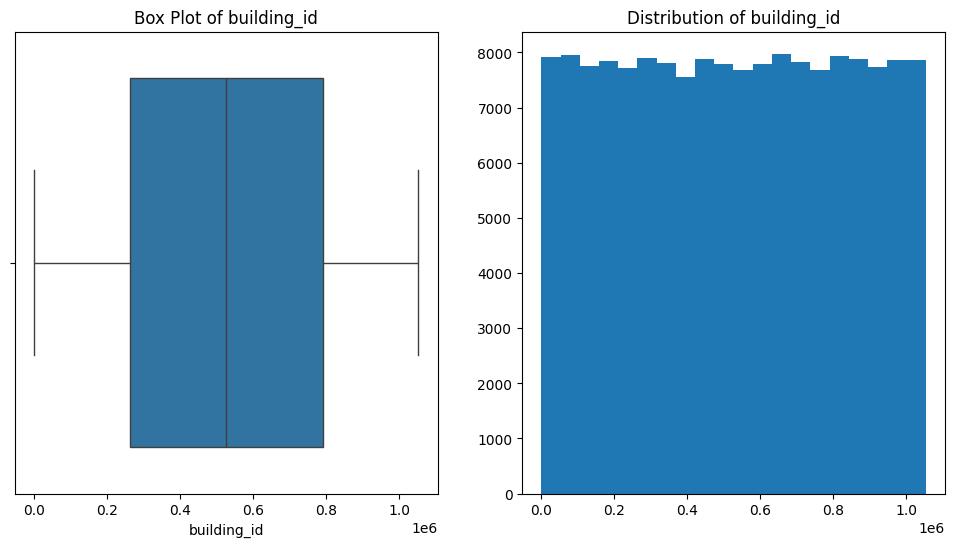

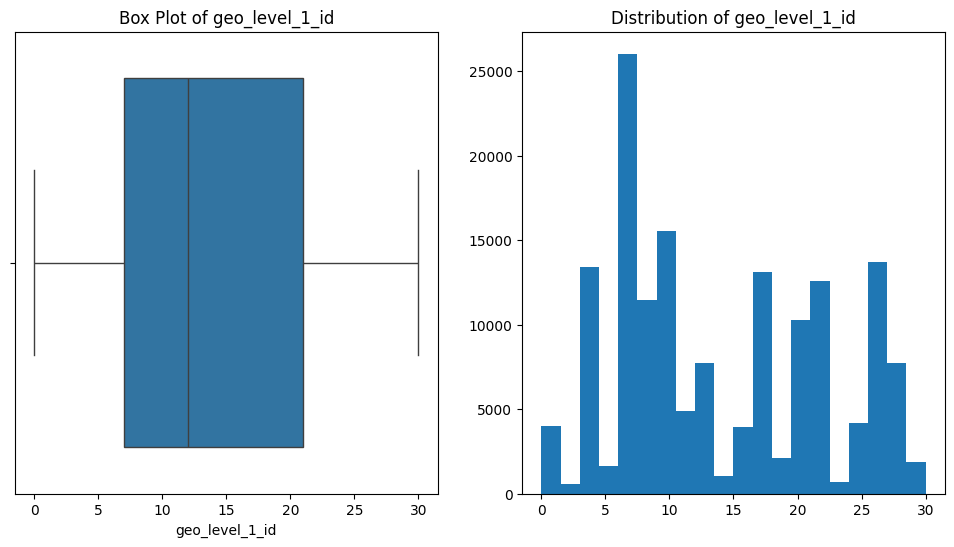

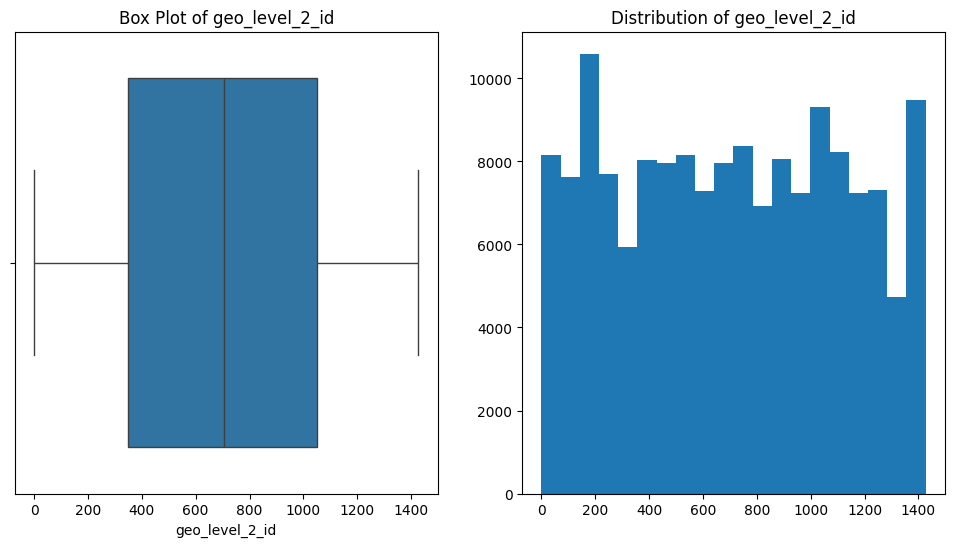

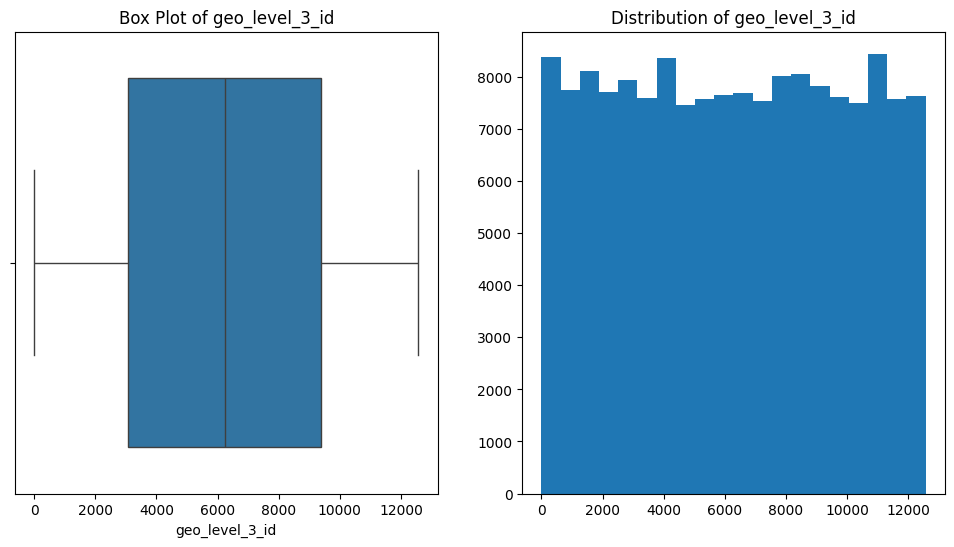

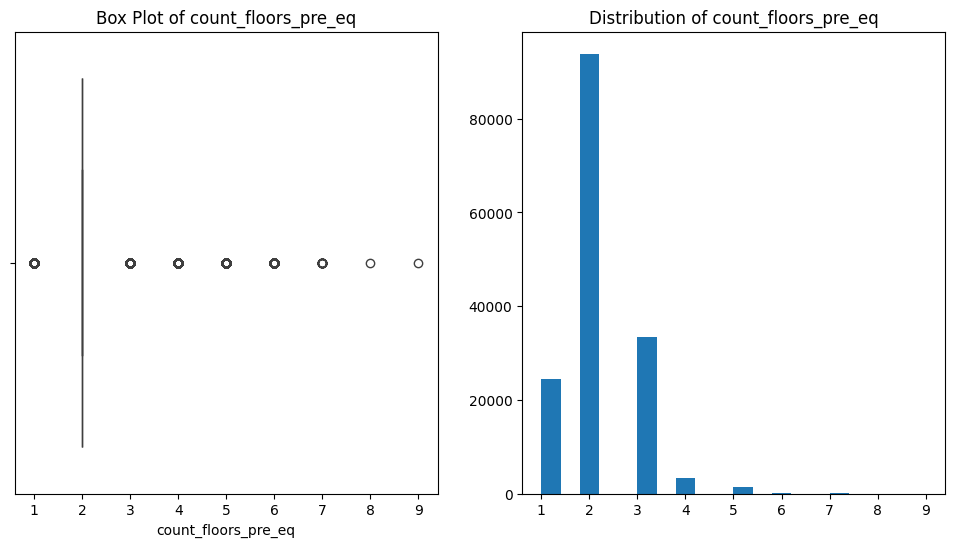

...

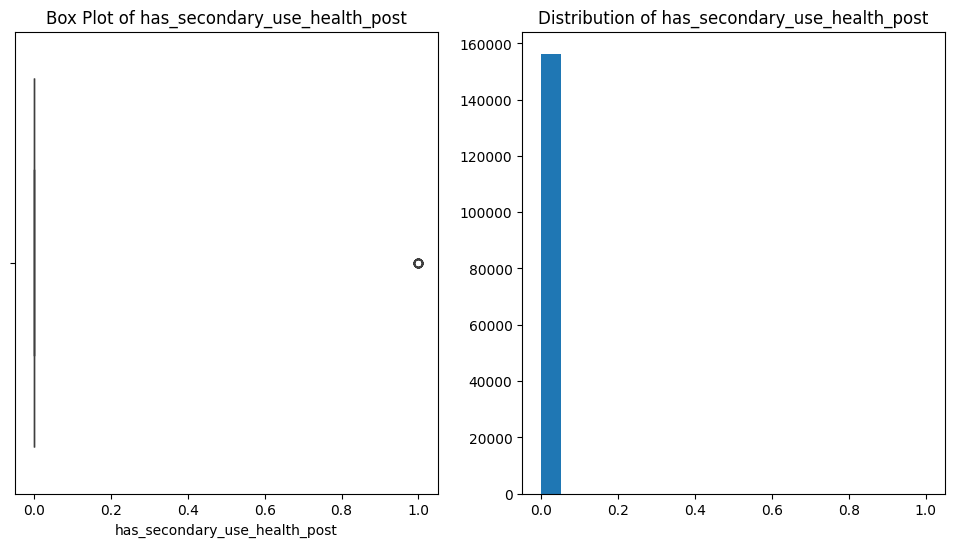

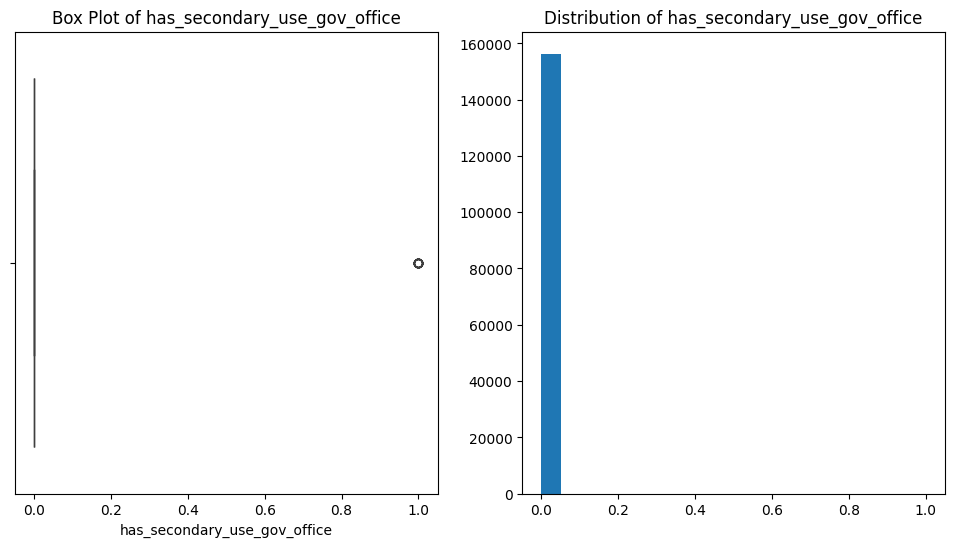

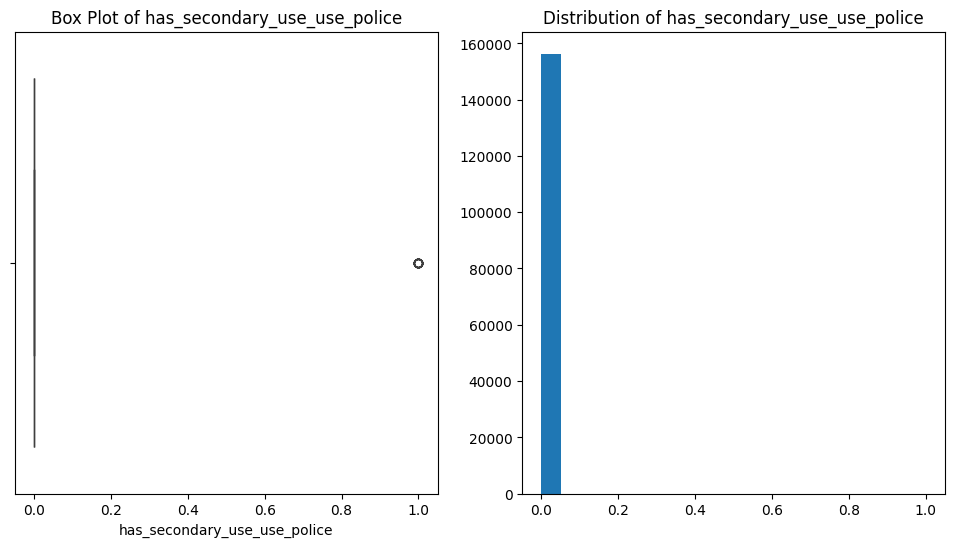

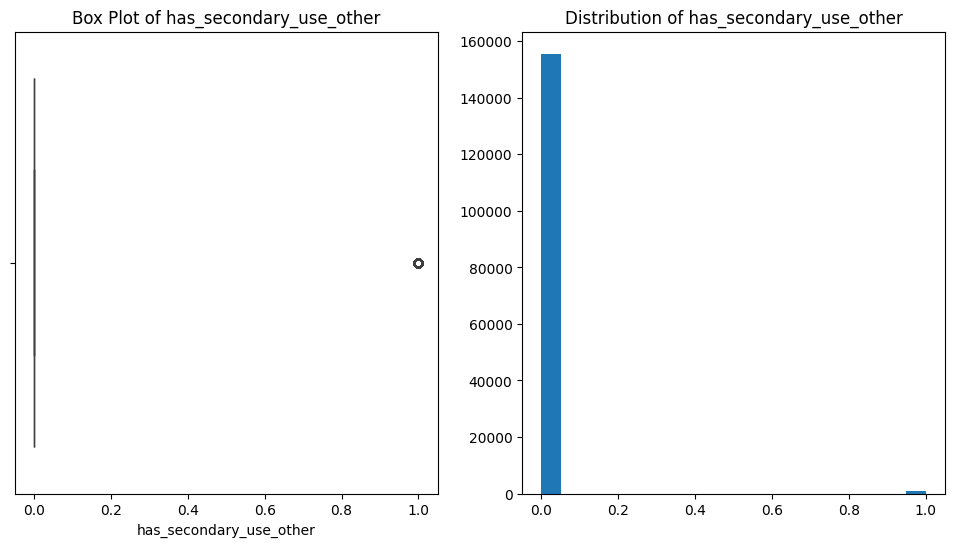

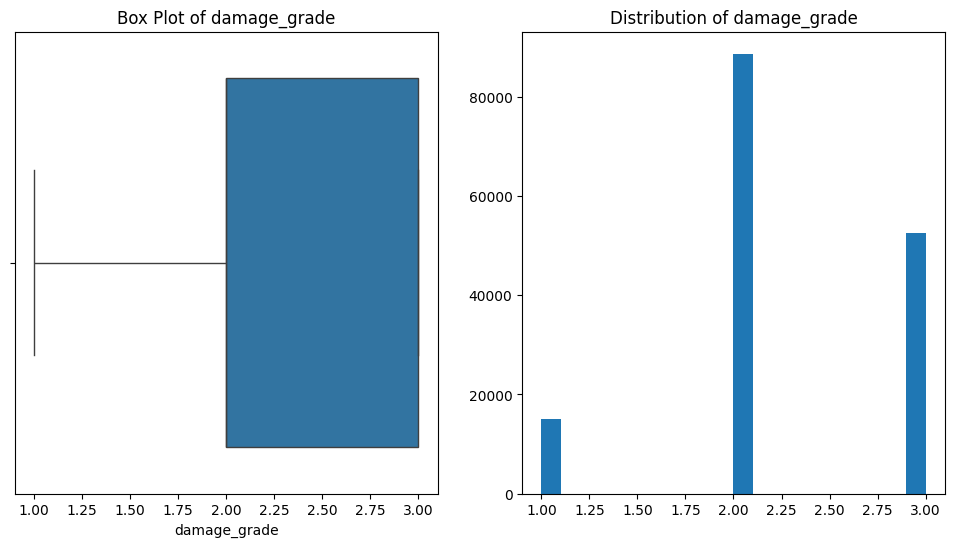

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through numerical columns and create box plots and histograms
for column in train_data.select_dtypes(include=['number']).columns:
  plt.figure(figsize=(12, 6))

  # Box plot
  plt.subplot(1, 2, 1)
  sns.boxplot(x=train_data[column])
  plt.title(f'Box Plot of {column}')

  # Histogram
  plt.subplot(1, 2, 2)
  plt.hist(train_data[column], bins=20)
  plt.title(f'Distribution of {column}')

  plt.show()


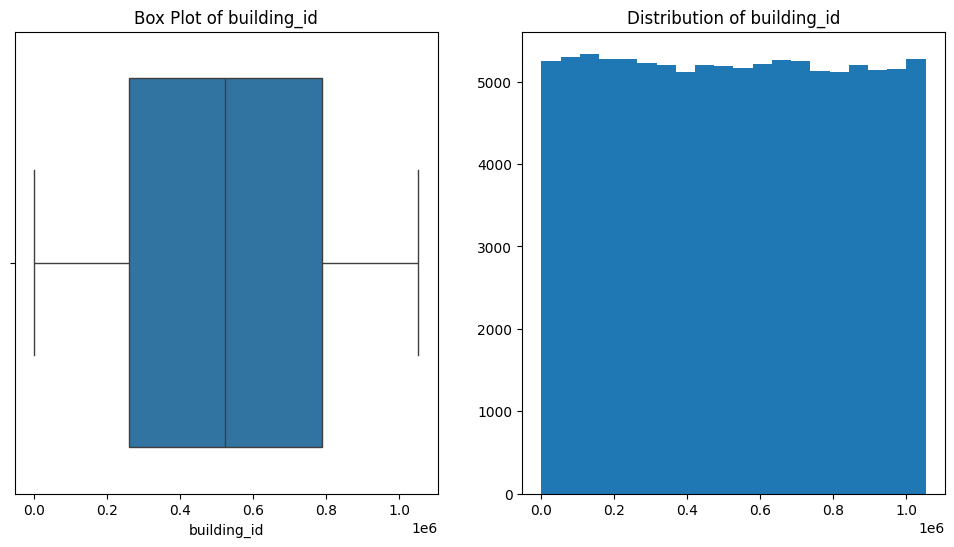

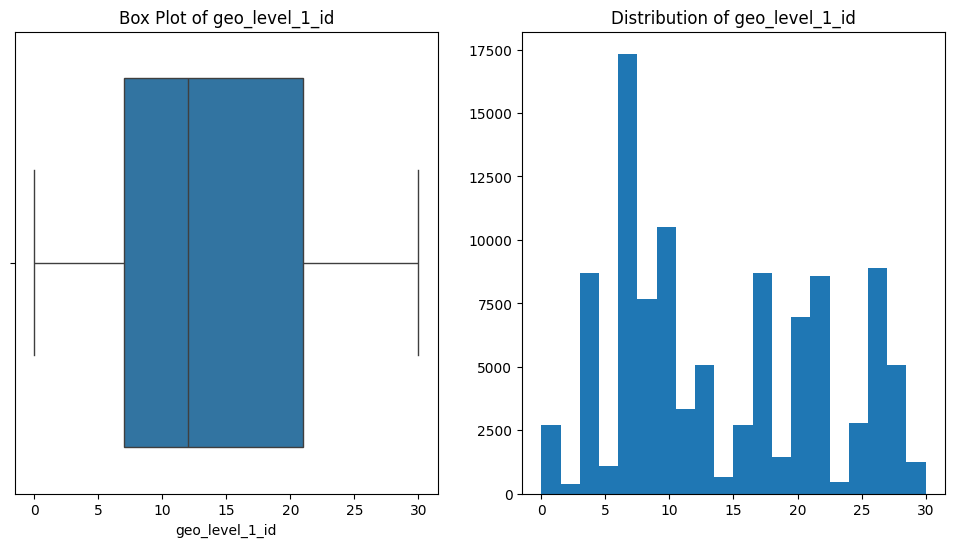

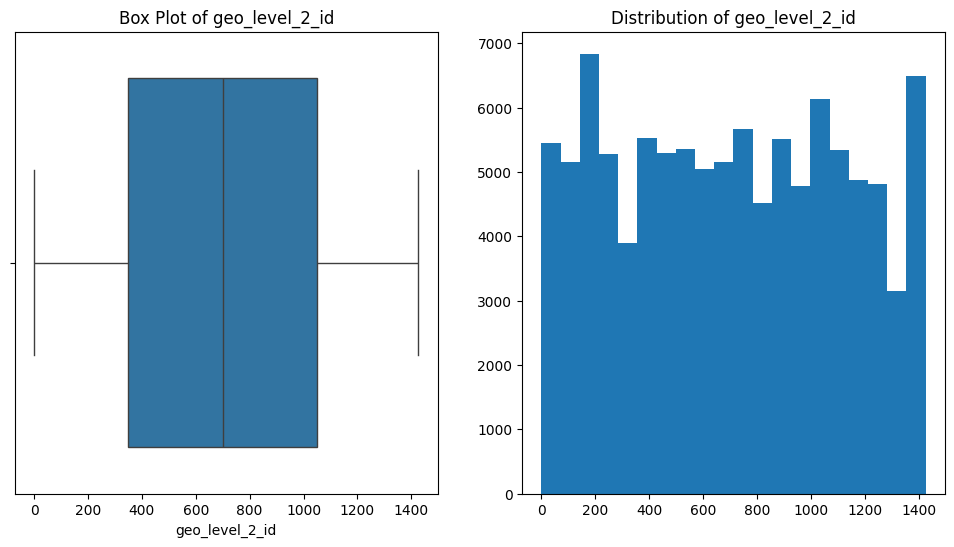

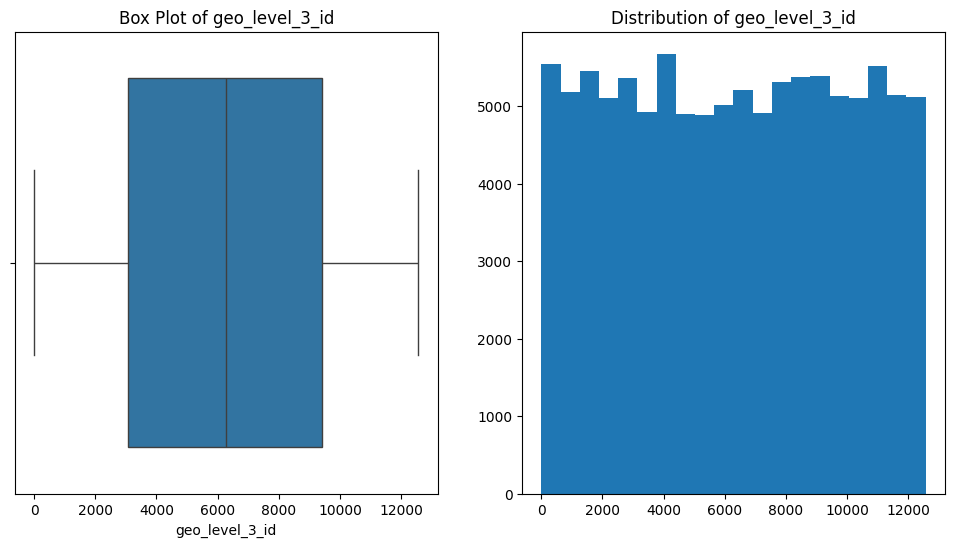

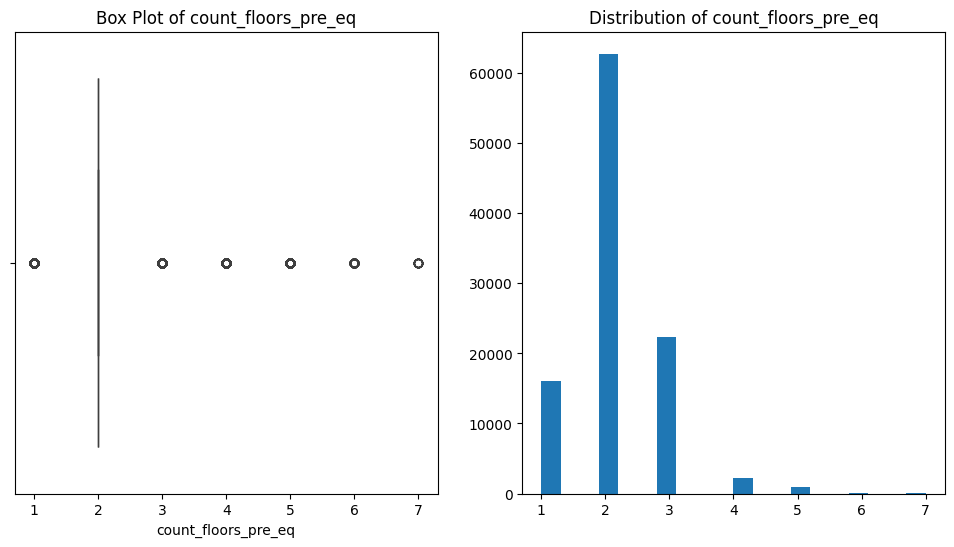

...

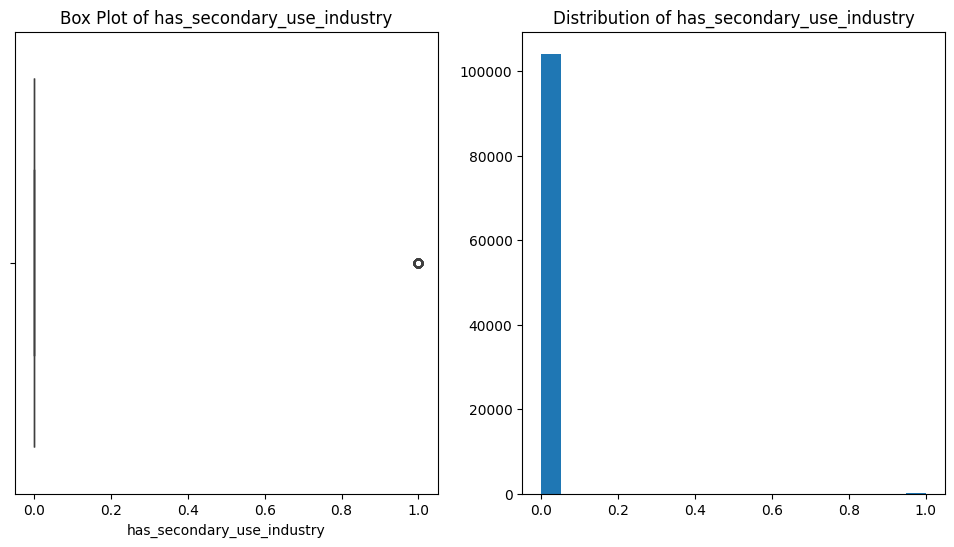

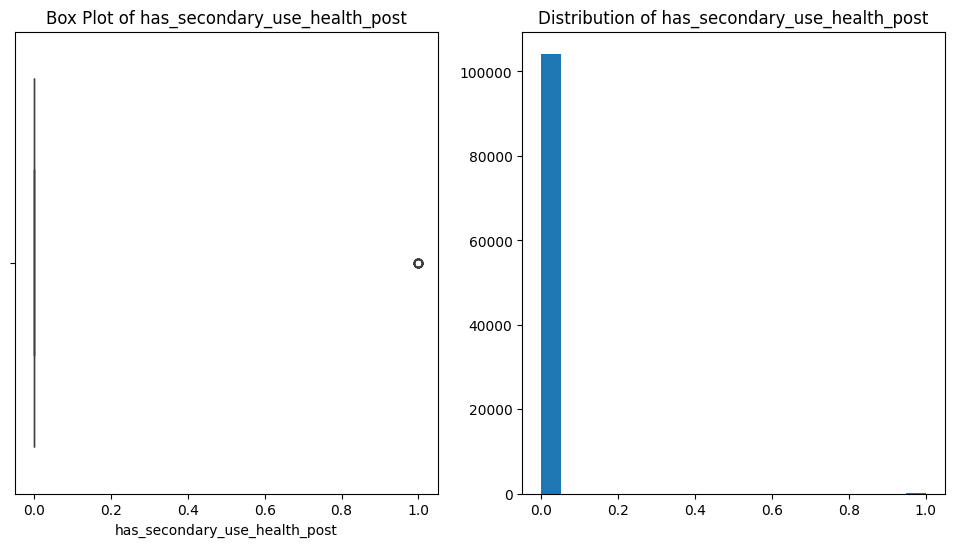

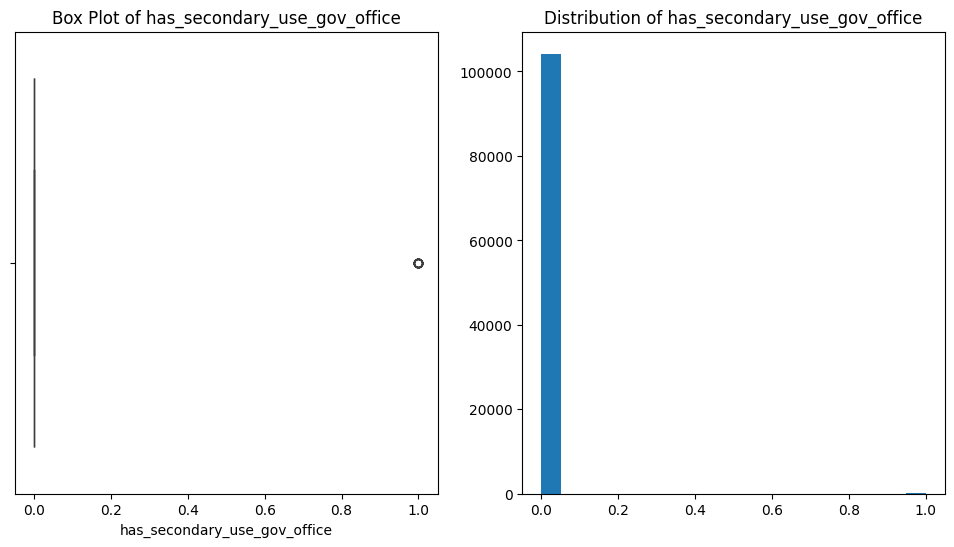

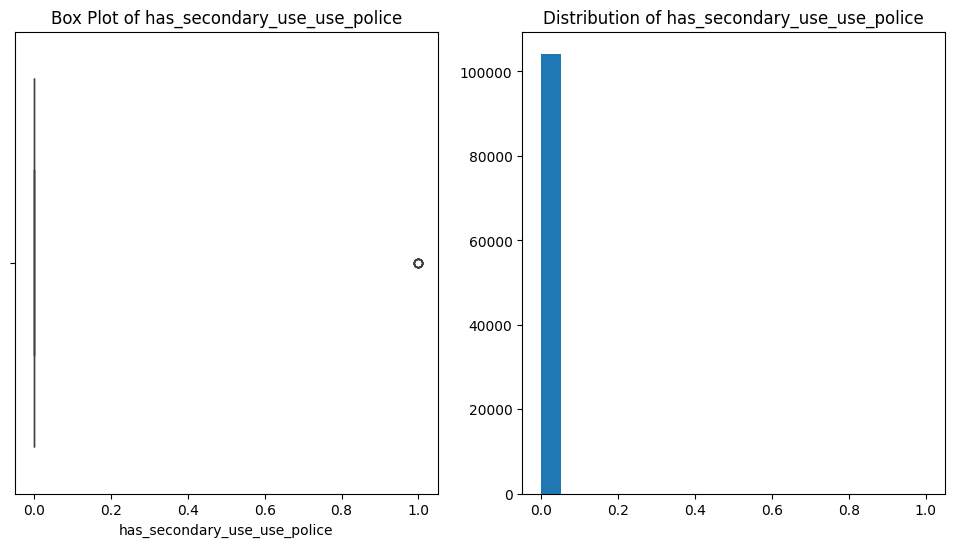

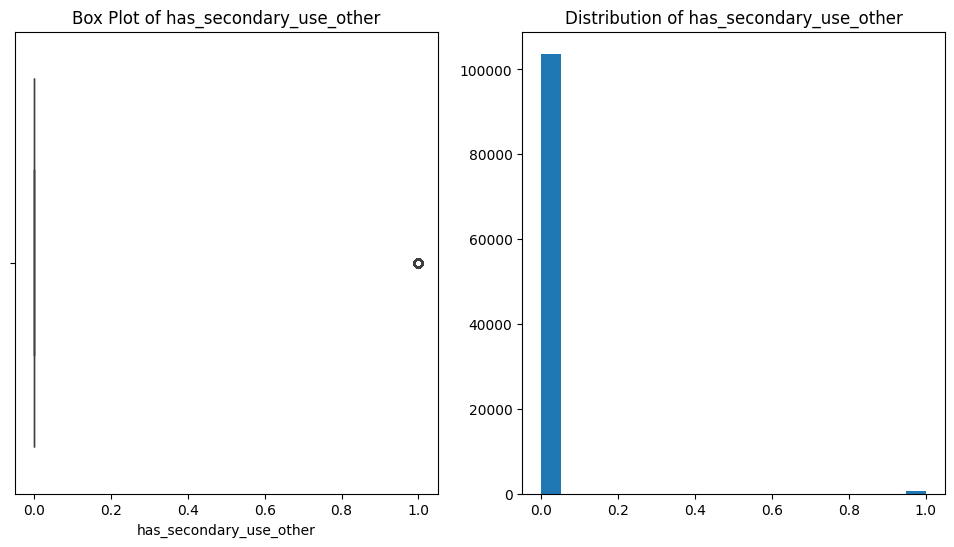

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through numerical columns and create box plots and histograms
for column in test_data.select_dtypes(include=['number']).columns:
  plt.figure(figsize=(12, 6))

  # Box plot
  plt.subplot(1, 2, 1)
  sns.boxplot(x=test_data[column])
  plt.title(f'Box Plot of {column}')

  # Histogram
  plt.subplot(1, 2, 2)
  plt.hist(test_data[column], bins=20)
  plt.title(f'Distribution of {column}')

  plt.show()


Outlier Detection

In [ ]:
# prompt: train dataset remove the outliers

def remove_outliers_iqr(df, columns, threshold=1.5):
  """
  Removes outliers from a DataFrame using the Interquartile Range (IQR) method.

  Args:
    df: The pandas DataFrame.
    columns: A list of column names to check for outliers.
    threshold: The IQR multiplier for outlier detection (default 1.5).

  Returns:
    A new DataFrame with outliers removed.
  """
  df_no_outliers = df.copy()
  for column in columns:
    Q1 = df_no_outliers[column].quantile(0.25)
    Q3 = df_no_outliers[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    df_no_outliers = df_no_outliers[(df_no_outliers[column] >= lower_bound) & (df_no_outliers[column] <= upper_bound)]
  return df_no_outliers

# Identify numerical columns for outlier detection
numerical_columns = train_data.select_dtypes(include=['number']).columns

# Remove outliers from the training data
train_data_no_outliers = remove_outliers_iqr(train_data, numerical_columns)

# You can also remove outliers from the test data if needed
# test_data_no_outliers = remove_outliers_iqr(test_data, numerical_columns)


print(f"Original training data shape: {train_data.shape}")
print(f"Training data shape after outlier removal: {train_data_no_outliers.shape}")

# Now you can use train_data_no_outliers for model training.

Original training data shape: (156360, 40)
Training data shape after outlier removal: (36706, 40)


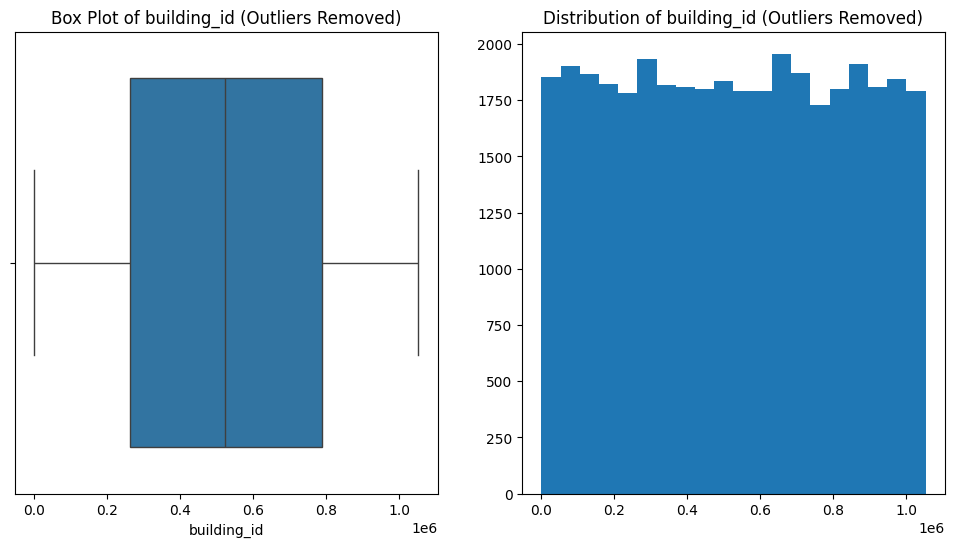

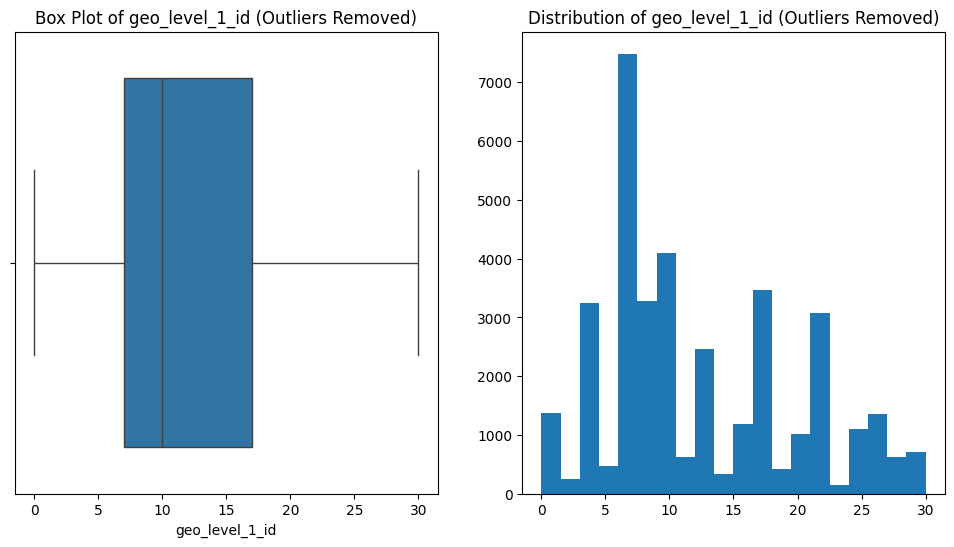

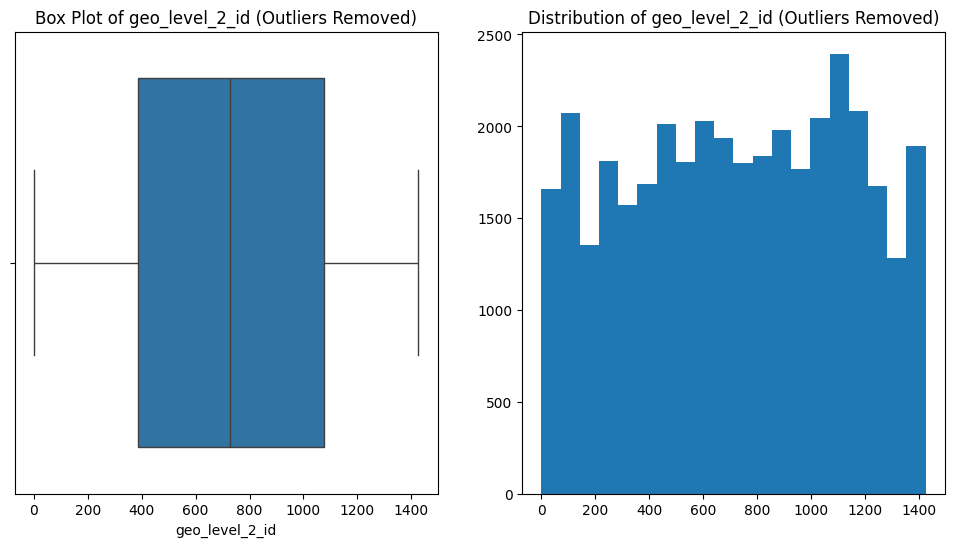

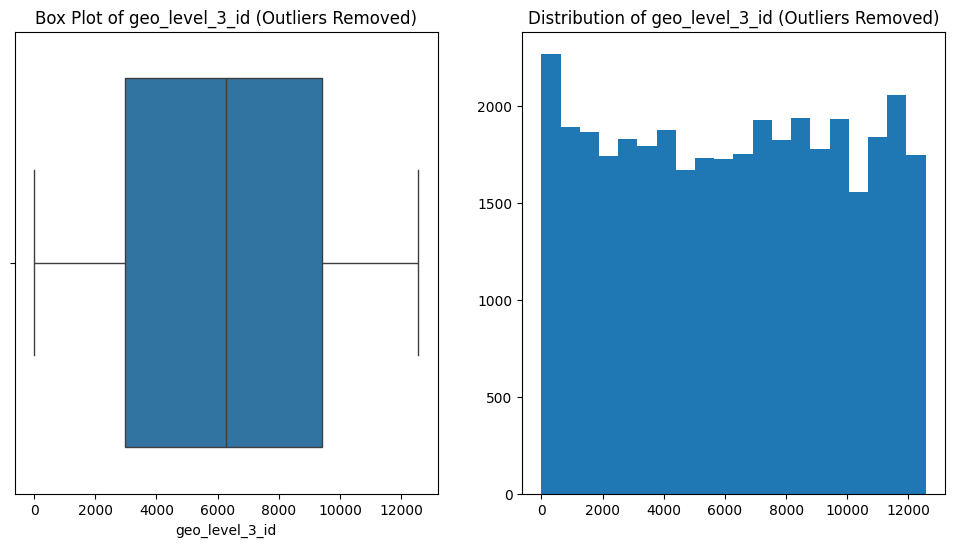

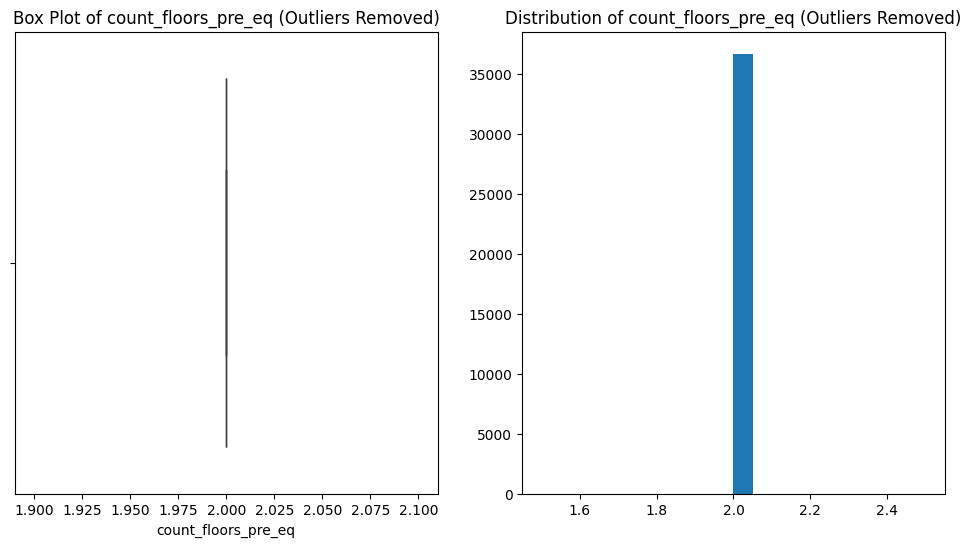

...

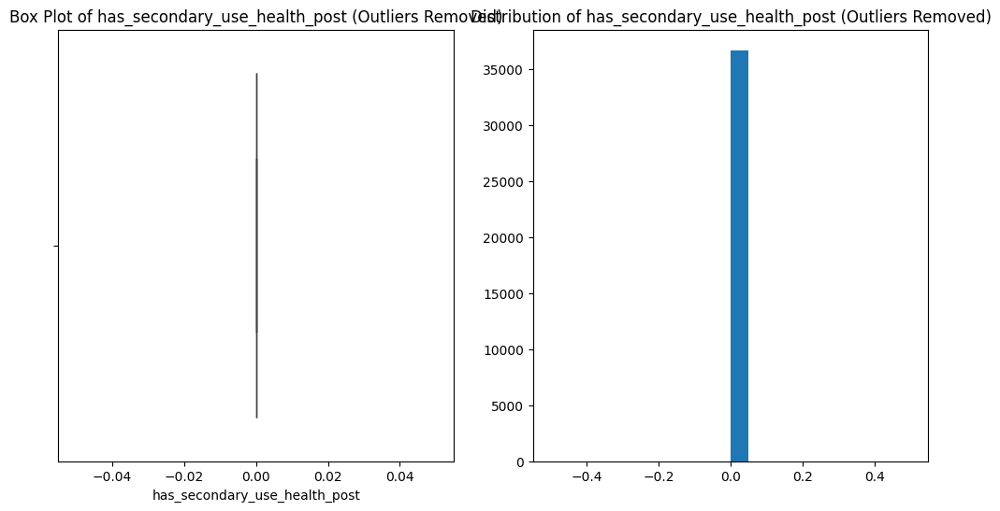

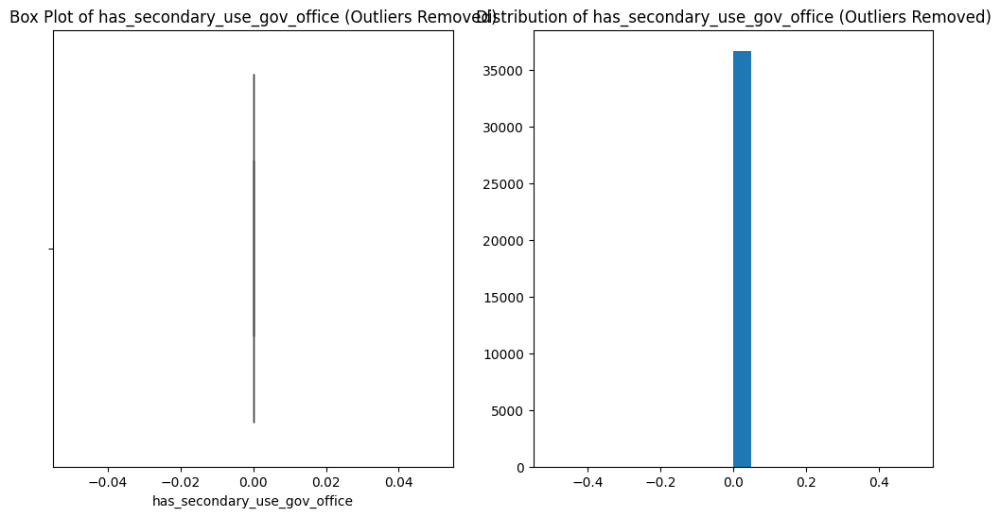

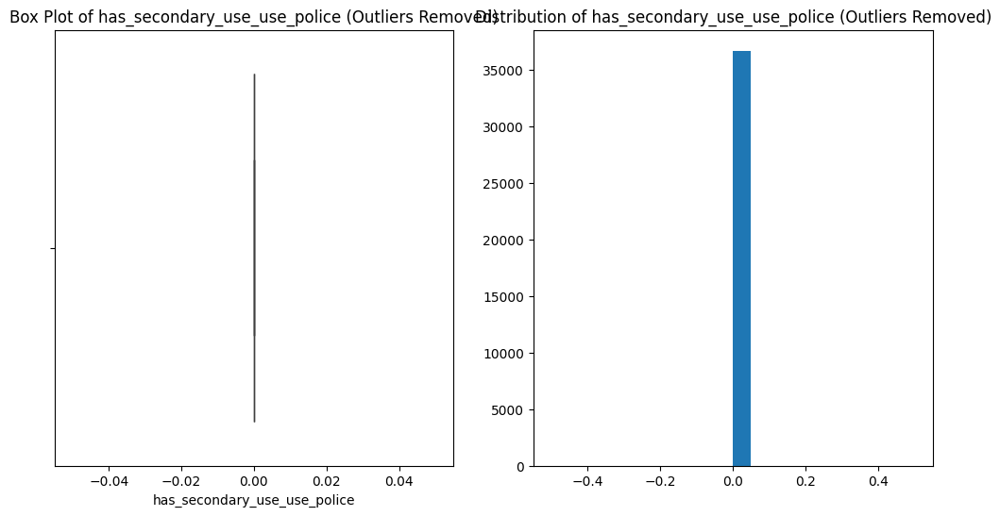

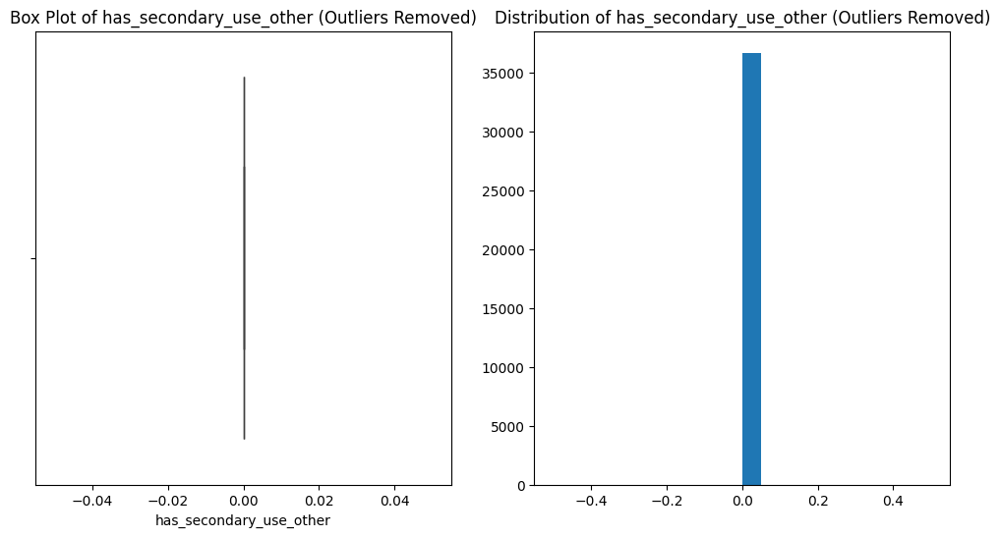

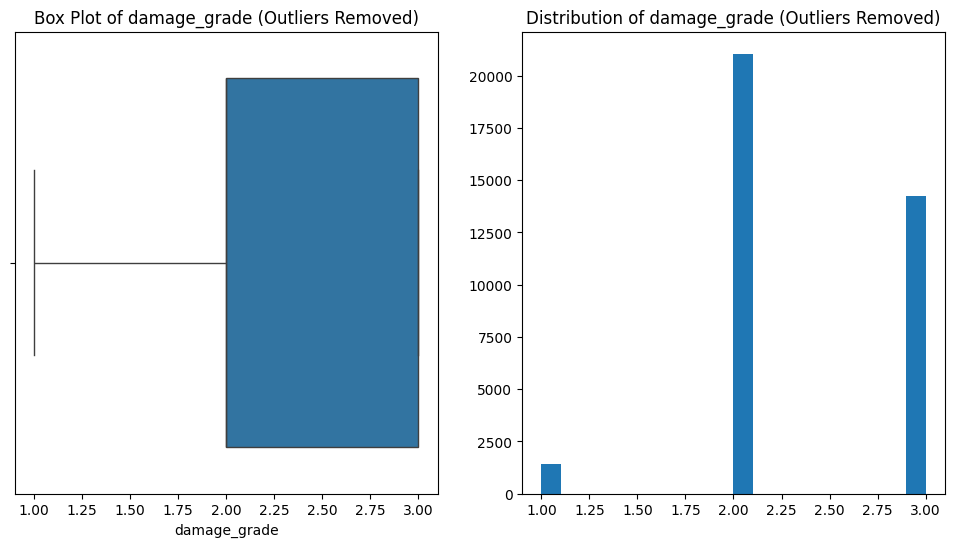

In [ ]:
# prompt: train dataset remove outliers show the box plot and histogram

# Loop through numerical columns and create box plots and histograms after outlier removal
for column in train_data_no_outliers.select_dtypes(include=['number']).columns:
  plt.figure(figsize=(12, 6))

  # Box plot
  plt.subplot(1, 2, 1)
  sns.boxplot(x=train_data_no_outliers[column])
  plt.title(f'Box Plot of {column} (Outliers Removed)')

  # Histogram
  plt.subplot(1, 2, 2)
  plt.hist(train_data_no_outliers[column], bins=20)
  plt.title(f'Distribution of {column} (Outliers Removed)')

  plt.show()

Original test data shape: (104241, 39)
Test data shape after outlier removal: (30444, 39)


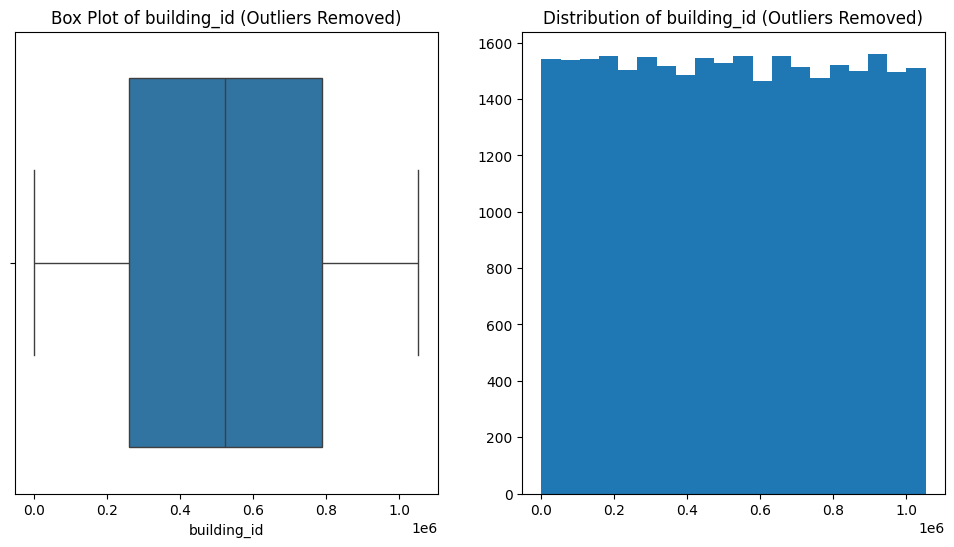

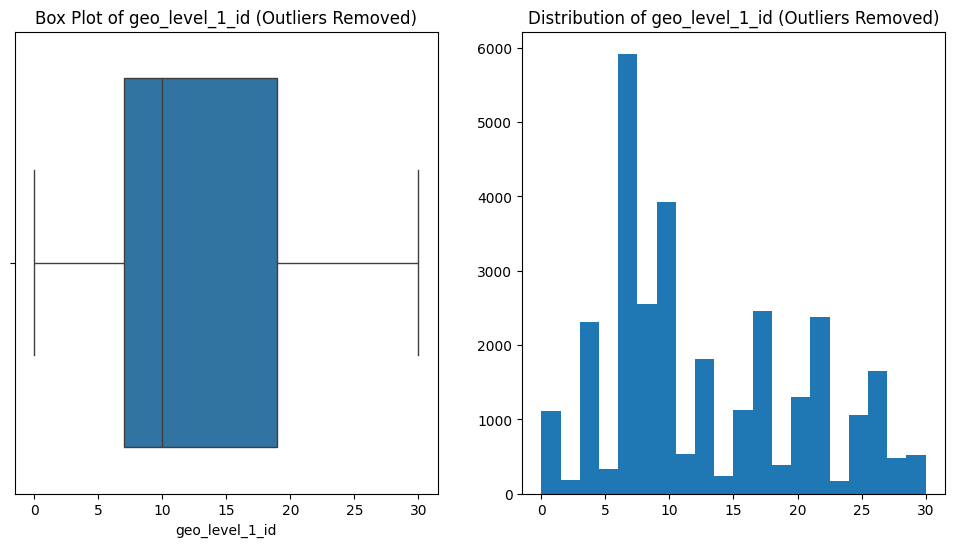

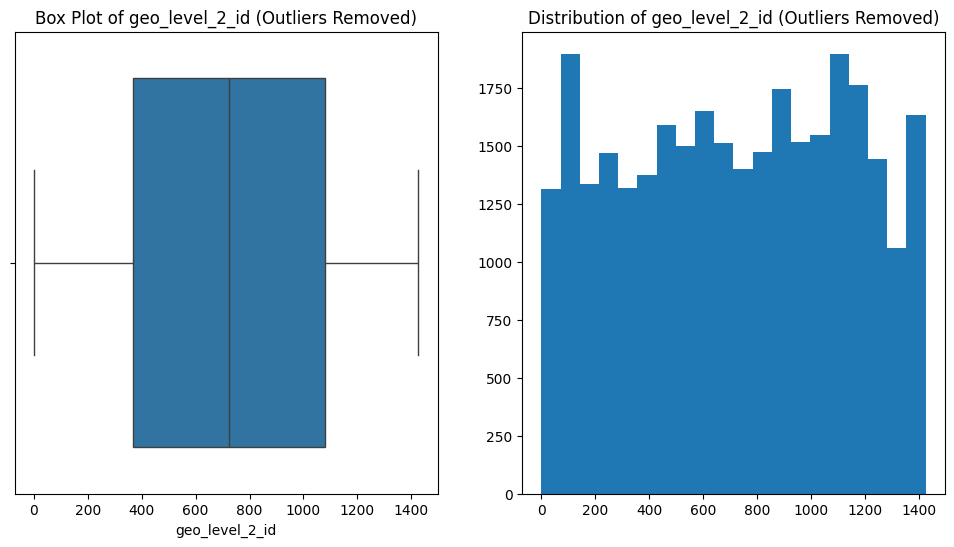

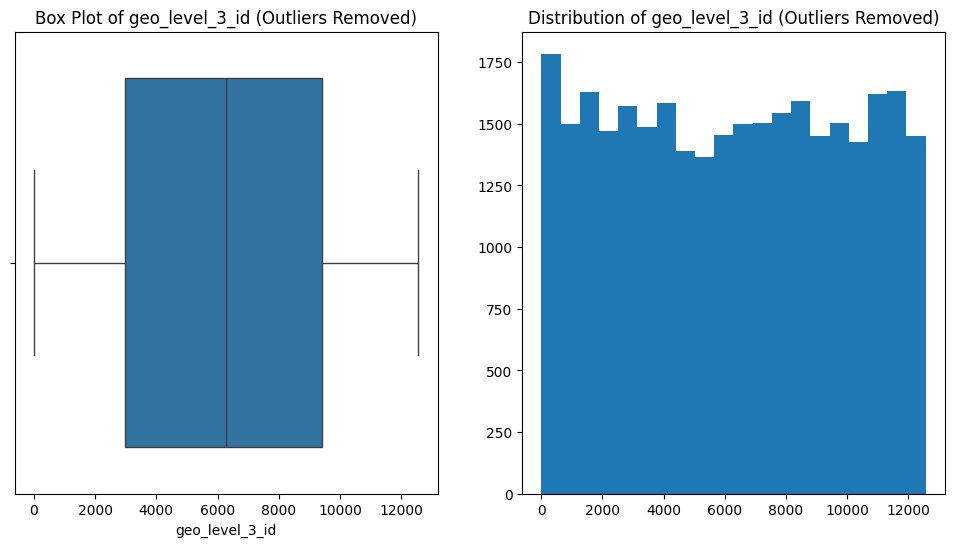

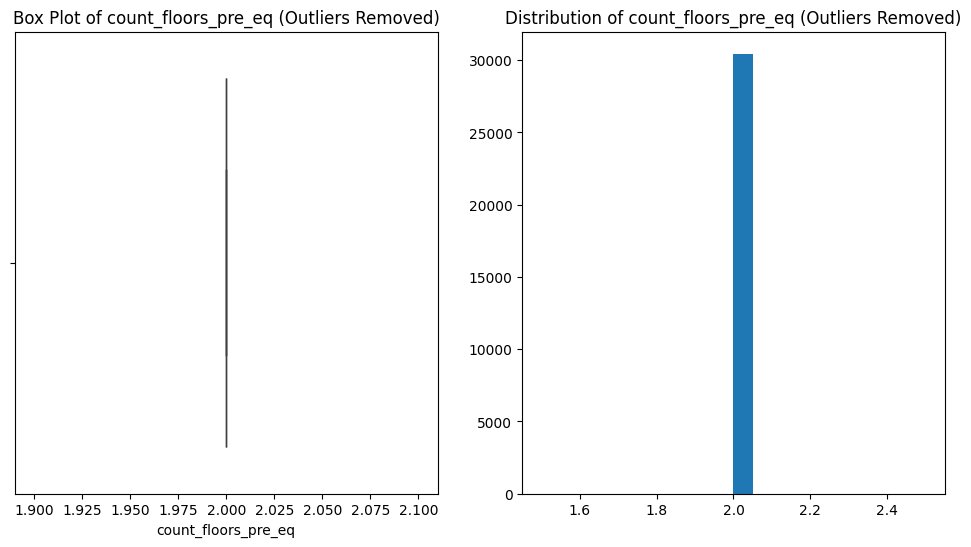

...

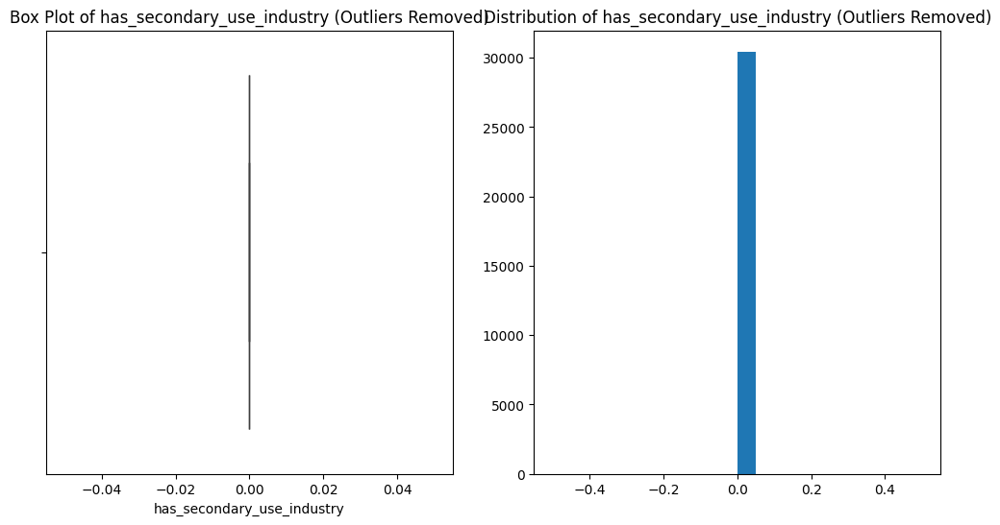

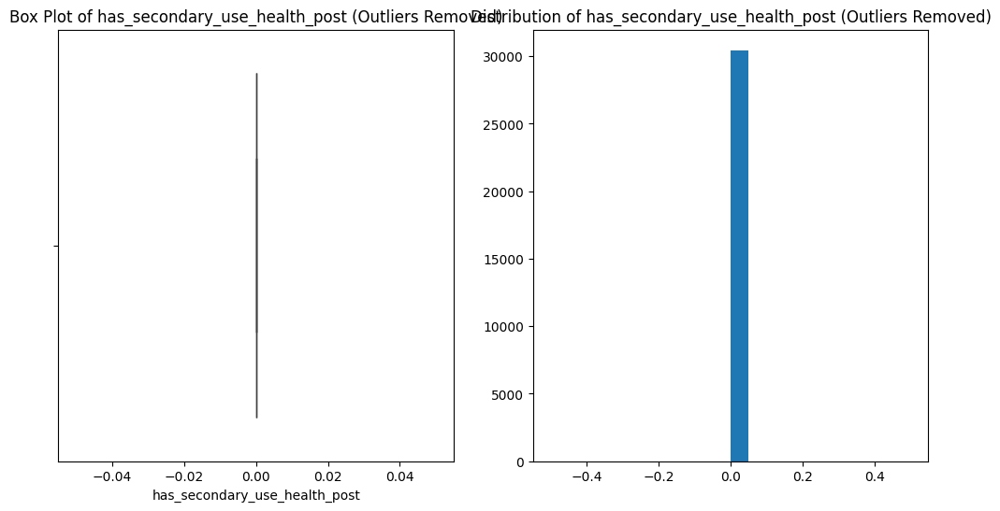

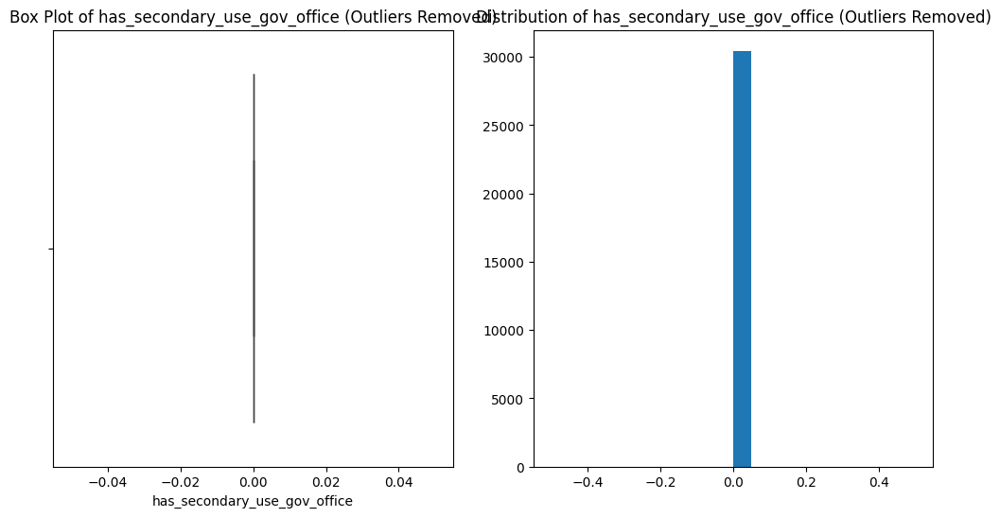

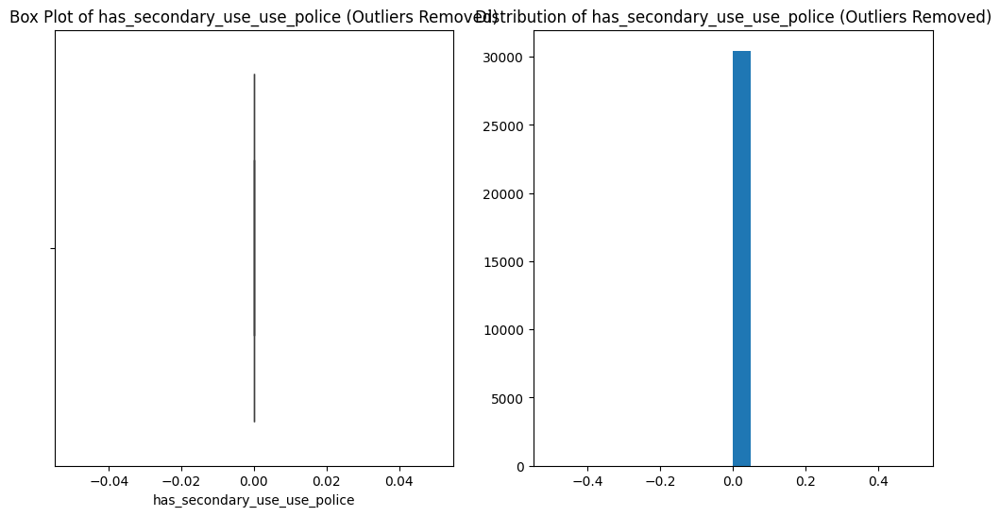

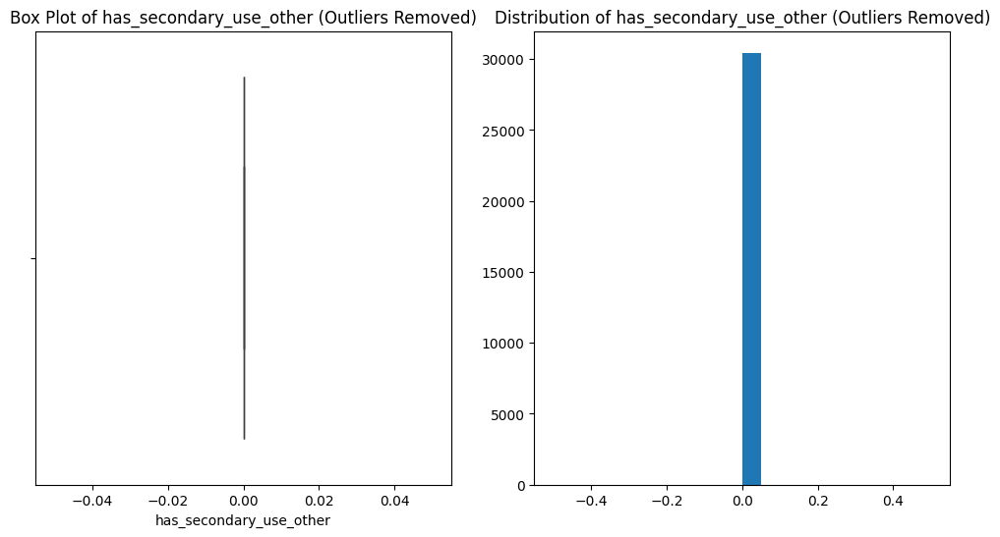

In [ ]:
# prompt: test dataset  test_data remove the outlies

# Identify numerical columns for outlier detection
numerical_columns = test_data.select_dtypes(include=['number']).columns

# Remove outliers from the test data
test_data_no_outliers = remove_outliers_iqr(test_data, numerical_columns)

print(f"Original test data shape: {test_data.shape}")
print(f"Test data shape after outlier removal: {test_data_no_outliers.shape}")

# Now you can use test_data_no_outliers for model testing or evaluation.

# Loop through numerical columns and create box plots and histograms after outlier removal
for column in test_data_no_outliers.select_dtypes(include=['number']).columns:
  plt.figure(figsize=(12, 6))

  # Box plot
  plt.subplot(1, 2, 1)
  sns.boxplot(x=test_data_no_outliers[column])
  plt.title(f'Box Plot of {column} (Outliers Removed)')

  # Histogram
  plt.subplot(1, 2, 2)
  plt.hist(test_data_no_outliers[column], bins=20)
  plt.title(f'Distribution of {column} (Outliers Removed)')

  plt.show()


```



*Step 6: Standardize Numerical Features*


*Step 7: Encode Categorical Variables*


In [ ]:
# prompt: Encode the categorical colmn

# Assuming you have your 'train_data' and 'test_data' DataFrames defined
# and 'categorical_features' list as in the previous code snippet.

from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Iterate through the categorical features
for col in categorical_features:
  if col in train_data.columns:
    # Fit the LabelEncoder on the training data
    label_encoder.fit(train_data[col])

    # Transform both the training and testing data
    train_data[col] = label_encoder.transform(train_data[col])
    if col in test_data.columns:
      test_data[col] = label_encoder.transform(test_data[col])

# Now, your categorical features in 'train_data' and 'test_data' are encoded
# with numerical values.

In [ ]:
  print("Train DataFrame:", train_data.head)
  print("Test DataFrame:", test_data.head)

Train DataFrame: <bound method NDFrame.head of         building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0            903419              22            1136            5551   
1            911693              25             419           11222   
2            888461              23             892            6156   
3            503788              10            1397            1591   
4            634804              27             422           10353   
...             ...             ...             ...             ...   
156355       142460              27             422            1092   
156356       382036              10             690            7305   
156357       184009              17             229            9736   
156358       714253              26            1215           10395   
156359       738067              27            1106            5222   

        count_floors_pre_eq  age  area_percentage  height_percentage  \
0                         1 

In [ ]:
train_data_no_outliers.to_csv('train_data_no_outliers.csv', index=False)
test_data_no_outliers.to_csv('test_data_no_outliers.csv', index=False)

In [ ]:
train_data_no_outliers

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
5,759592,30,1179,12090,2,40,12,4,t,r,...,0,0,0,0,0,0,0,0,0,2
7,1050794,9,772,1032,2,5,6,4,n,r,...,0,0,0,0,0,0,0,0,0,2
8,223537,5,867,9344,2,20,6,5,t,r,...,0,0,0,0,0,0,0,0,0,1
15,620650,16,595,8085,2,5,6,6,n,r,...,0,0,0,0,0,0,0,0,0,2
21,703115,18,256,7194,2,10,7,5,t,r,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156342,482341,5,841,6929,2,30,7,5,t,r,...,0,0,0,0,0,0,0,0,0,2
156346,633307,17,967,2968,2,10,7,7,t,r,...,0,0,0,0,0,0,0,0,0,3
156348,832355,8,374,4551,2,15,5,5,n,r,...,0,0,0,0,0,0,0,0,0,3
156350,708367,6,449,484,2,20,10,7,n,r,...,0,0,0,0,0,0,0,0,0,2


In [ ]:
test_data_no_outliers

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,360320,13,777,5562,2,5,5,4,t,r,...,0,0,0,0,0,0,0,0,0,0
1,479622,26,203,8953,2,10,9,6,t,r,...,0,0,0,0,0,0,0,0,0,0
3,429841,16,732,504,2,5,4,5,t,r,...,0,0,0,0,0,0,0,0,0,0
6,800181,26,227,3596,2,20,6,5,t,w,...,0,0,0,0,0,0,0,0,0,0
7,413022,6,537,6733,2,40,11,6,t,r,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104230,147398,25,1065,3930,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0
104234,302635,13,1310,3061,2,5,6,4,t,r,...,0,0,0,0,0,0,0,0,0,0
104236,308121,6,724,7981,2,20,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0
104238,545414,10,1397,3786,2,40,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0


*Step 8: Final Cleaned Data Summary*





In [ ]:
# Check the shape and data types after cleaning
print("Cleaned Train Data Shape:", train_data.shape)
print("Cleaned Test Data Shape:", test_data.shape)
print("Training Data Types After Cleaning:\n", train_data.dtypes)
print("Test Data Types After Cleaning:\n", test_data.dtypes)


Cleaned Train Data Shape: (156360, 40)
Cleaned Test Data Shape: (104241, 39)
Training Data Types After Cleaning:
 building_id                               int64
geo_level_1_id                            int64
geo_level_2_id                            int64
geo_level_3_id                            int64
count_floors_pre_eq                       int64
age                                       int64
area_percentage                           int64
height_percentage                         int64
land_surface_condition                    int64
foundation_type                           int64
roof_type                                 int64
ground_floor_type                         int64
other_floor_type                          int64
position                                  int64
plan_configuration                        int64
has_superstructure_adobe_mud              int64
has_superstructure_mud_mortar_stone       int64
has_superstructure_stone_flag             int64
has_superstructure_cem

                                        building_id  geo_level_1_id  \
building_id                                1.000000        0.000260   
geo_level_1_id                             0.000260        1.000000   
geo_level_2_id                             0.007398        0.009684   
geo_level_3_id                            -0.004797       -0.015676   
count_floors_pre_eq                             NaN             NaN   
age                                       -0.004732        0.023526   
area_percentage                           -0.001783        0.042276   
height_percentage                          0.001427       -0.034292   
has_superstructure_adobe_mud                    NaN             NaN   
has_superstructure_mud_mortar_stone             NaN             NaN   
has_superstructure_stone_flag                   NaN             NaN   
has_superstructure_cement_mortar_stone          NaN             NaN   
has_superstructure_mud_mortar_brick             NaN             NaN   
has_su

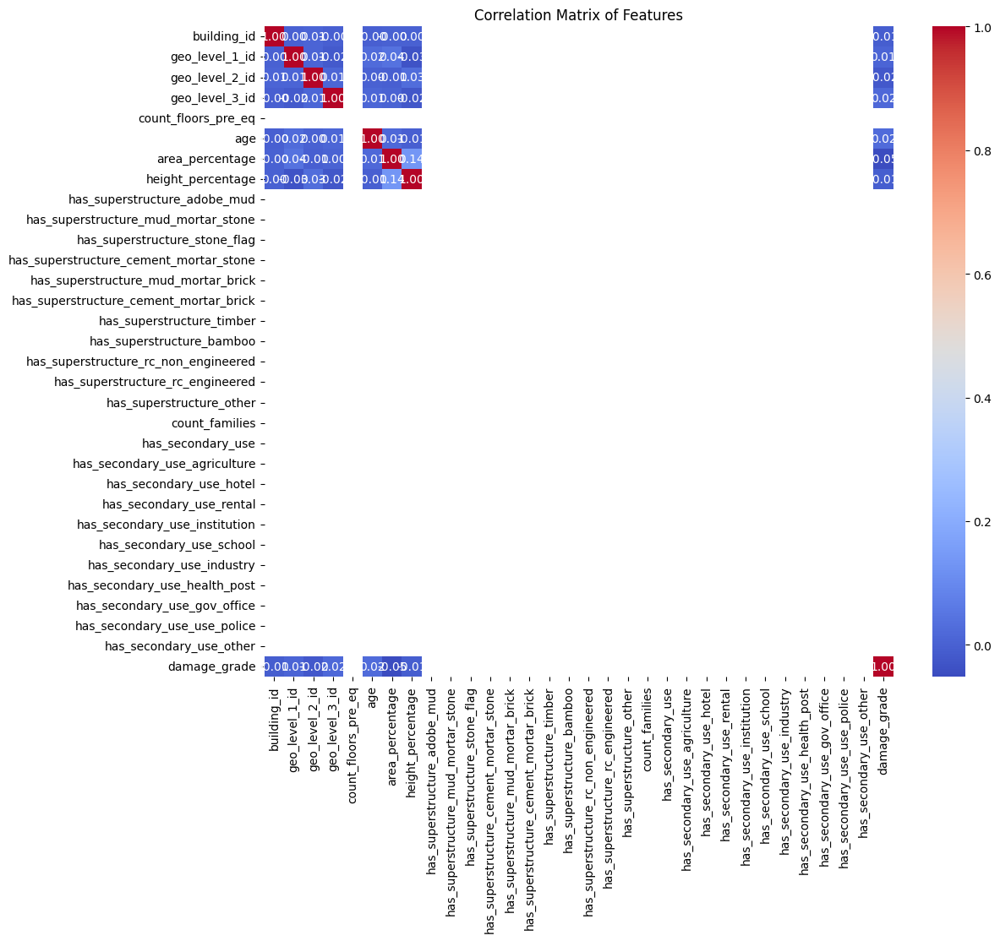

In [ ]:
# prompt: Correlation matrix

# Assuming 'train_data' is your cleaned DataFrame
correlation_matrix = train_data_no_outliers.corr(numeric_only=True) # Added numeric_only=True

# Display the correlation matrix
print(correlation_matrix)

# You can also visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features')
plt.show()

#3. EDA (EXPOLATORY DATA ANALYSIS)>>

*1.Load/Read The DATA*

In [ ]:
# prompt: Load the dataset

import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# #1. Data Load
# Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.

!pip install gdown


# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

# #2. DATA CLEANING
# *Step 1: load/Read The Dataset*


def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)

if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head())
  print("Test DataFrame:", df_test.head())

# ... (rest of your code for data cleaning and EDA) ...

Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 104MB/s] 
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 40.7MB/s]


Train DataFrame:    building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0       903419              22            1136            5551   
1       911693              25             419           11222   
2       888461              23             892            6156   
3       503788              10            1397            1591   
4       634804              27             422           10353   

   count_floors_pre_eq  age  area_percentage  height_percentage  \
0                    1   20                4                  2   
1                    2   15               12                  5   
2                    3   30                8                  7   
3                    2   15                7                  6   
4                    2   30                7                  5   

  land_surface_condition foundation_type  ... has_secondary_use_hotel  \
0                      t               r  ...                       0   
1                      n             

*2. Target Variable Distribution (has_superstructure_mud_mortar_stone)*




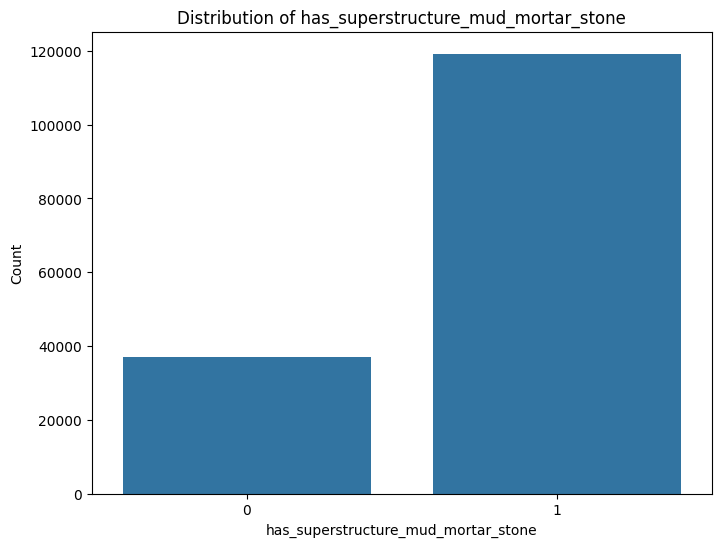

In [ ]:
# prompt: target variable  distribution (has_superstructure_mud_mortar_stone)

# Assuming 'train_data' is your DataFrame after cleaning
plt.figure(figsize=(8, 6))
sns.countplot(x='has_superstructure_mud_mortar_stone', data=df_train)
plt.title('Distribution of has_superstructure_mud_mortar_stone')
plt.xlabel('has_superstructure_mud_mortar_stone')
plt.ylabel('Count')
plt.show()


#Insight:

Class Balance: If one has_superstructure_mud_mortar_stone category is more prevalent than others, it indicates an imbalance. This could influence model training, as models might need to account for or correct class imbalance to improve accuracy.


*3. Numerical Feature Distributions*




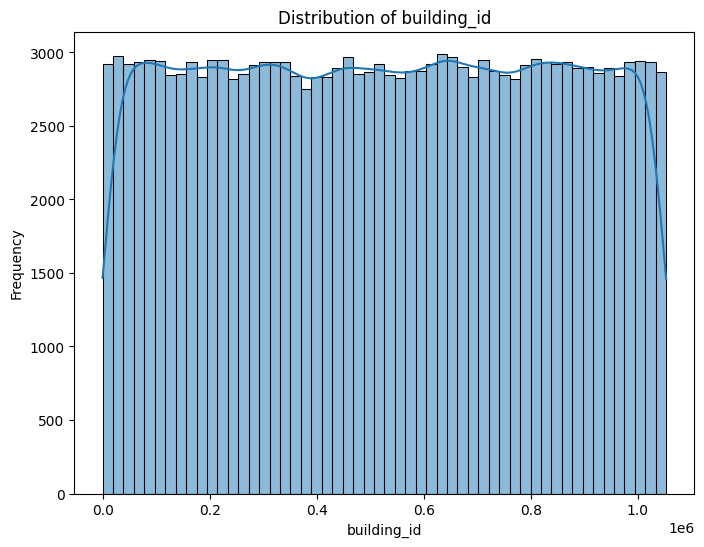

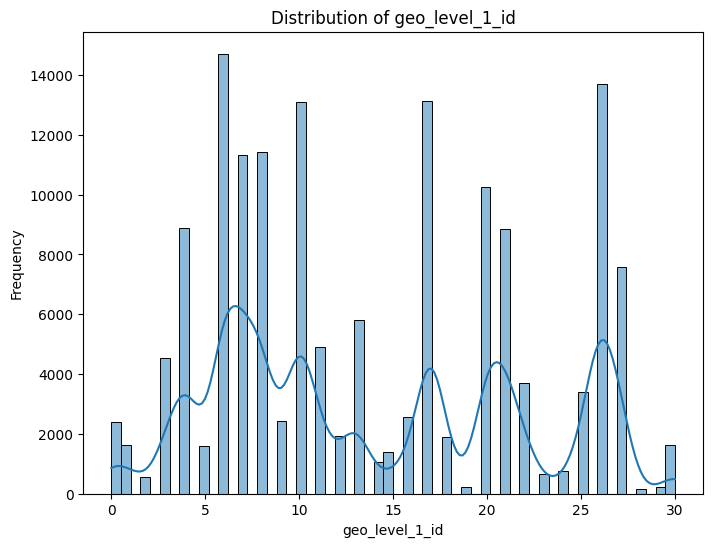

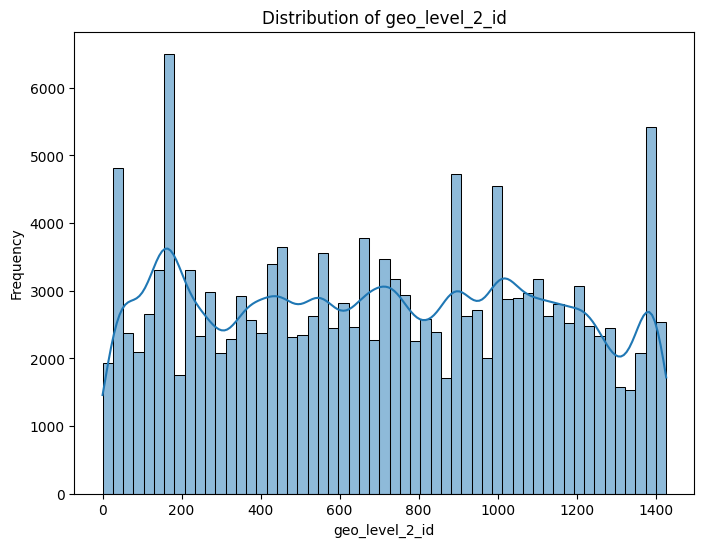

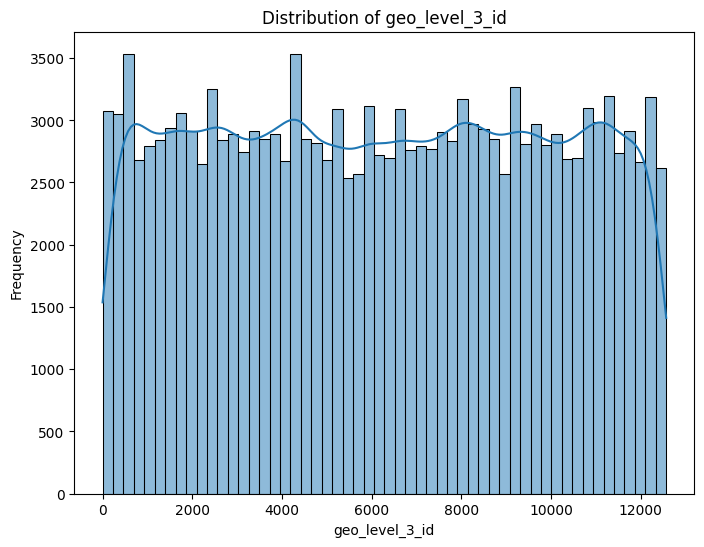

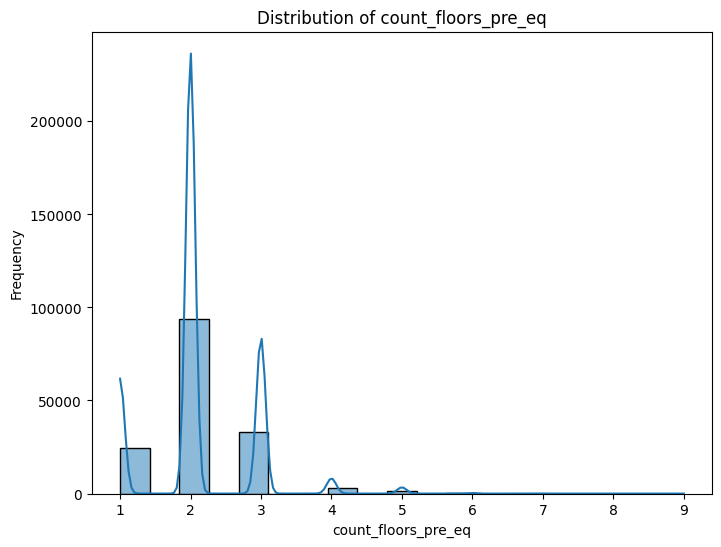

...

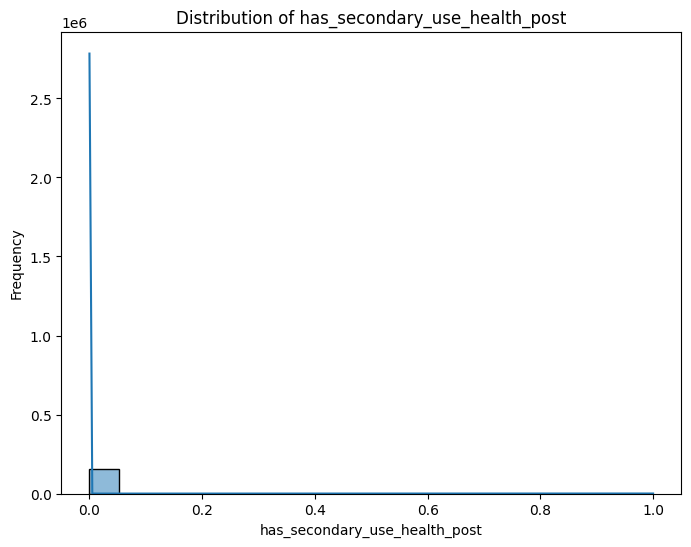

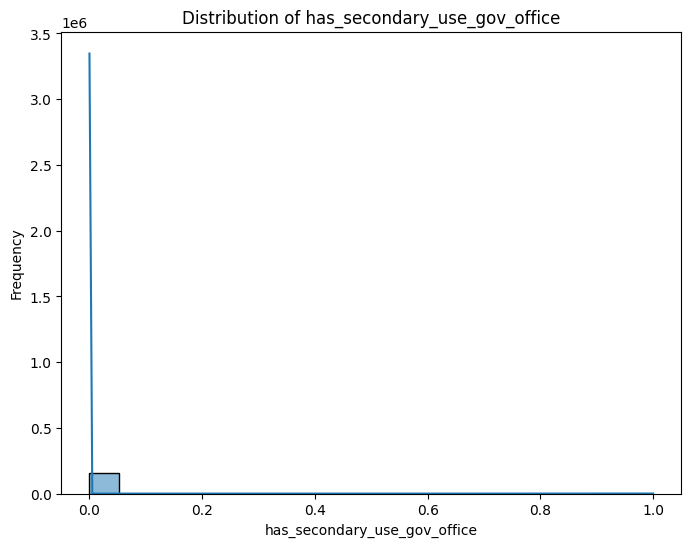

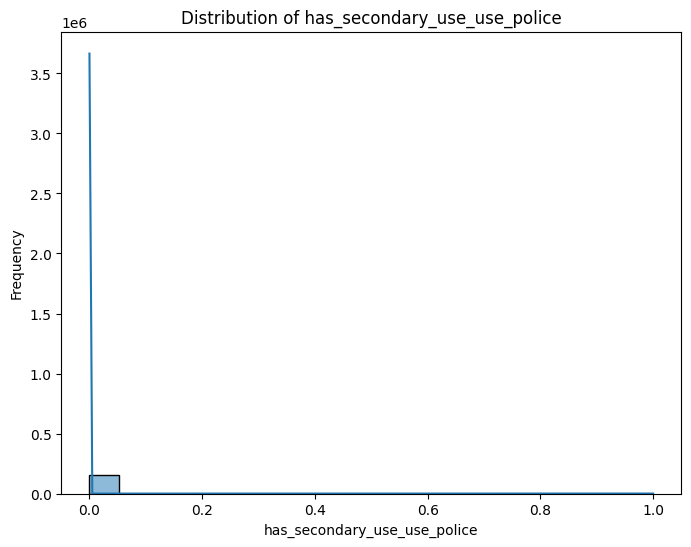

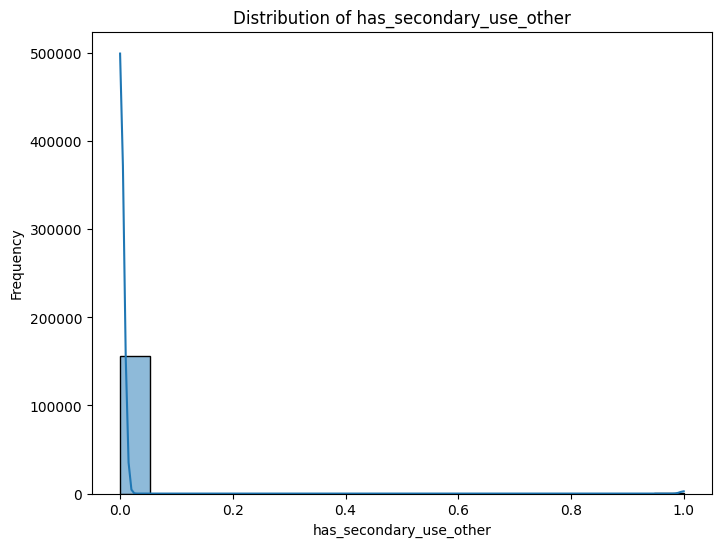

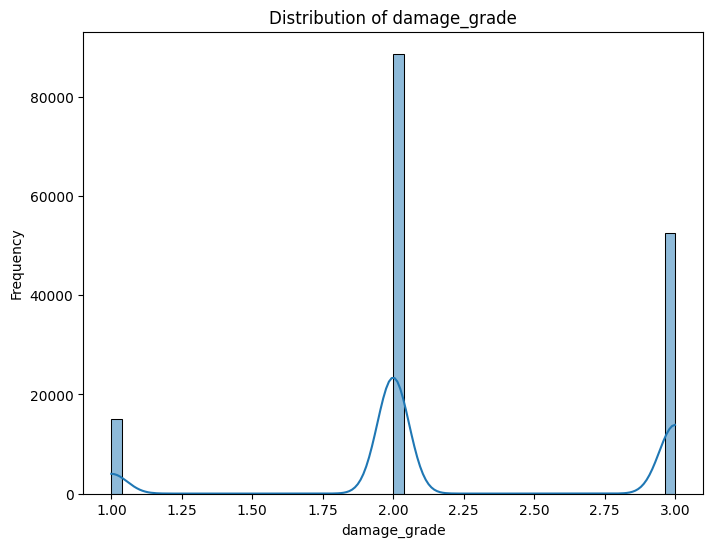

In [ ]:
# prompt: Numerical Feature Distributions

# Assuming 'train_data' is your DataFrame after cleaning
numerical_features = df_train.select_dtypes(include=['number']).columns

for feature in numerical_features:
  plt.figure(figsize=(8, 6))
  sns.histplot(df_train[feature], kde=True)
  plt.title(f'Distribution of {feature}')
  plt.xlabel(feature)
  plt.ylabel('Frequency')
  plt.show()


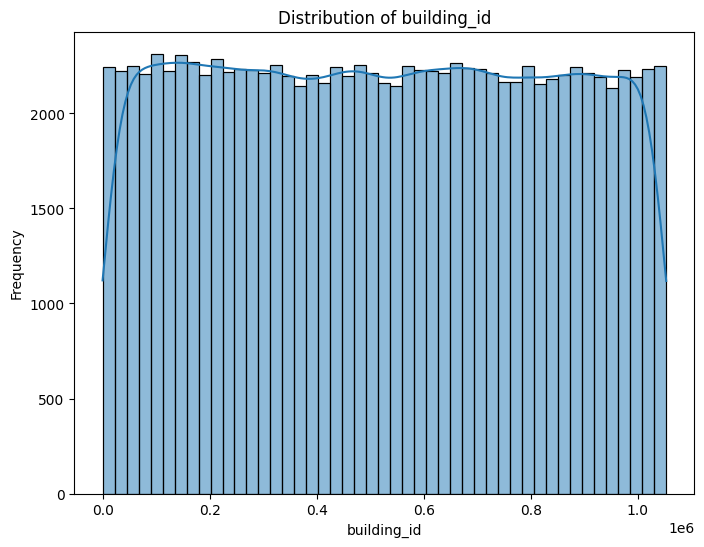

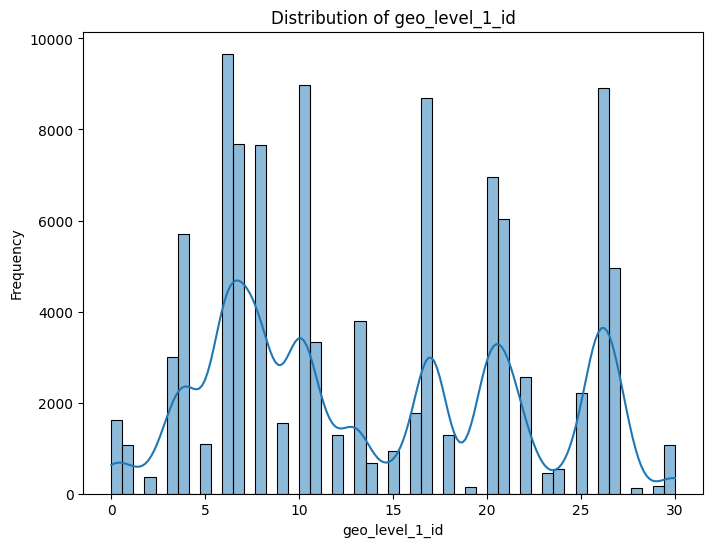

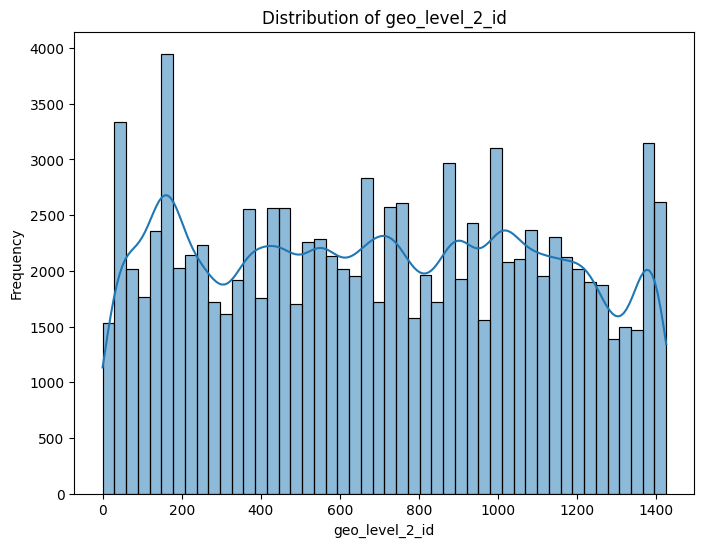

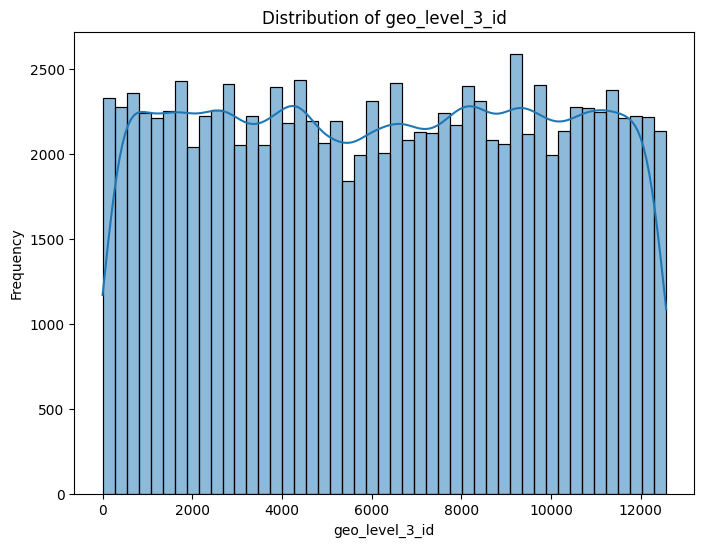

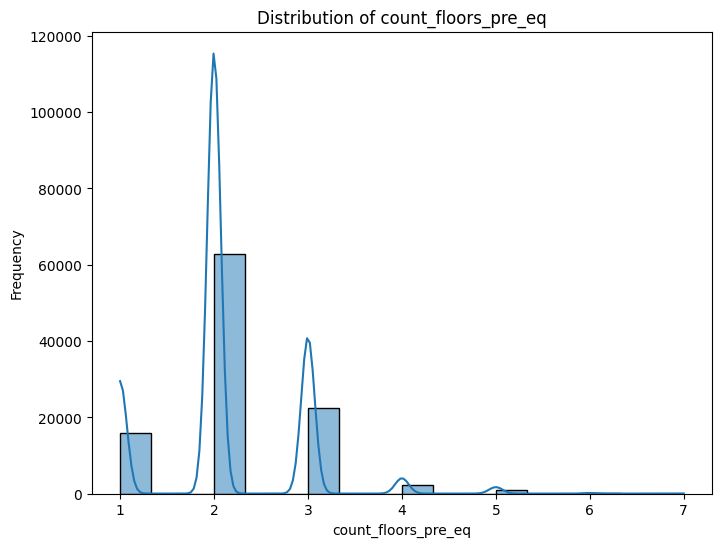

...

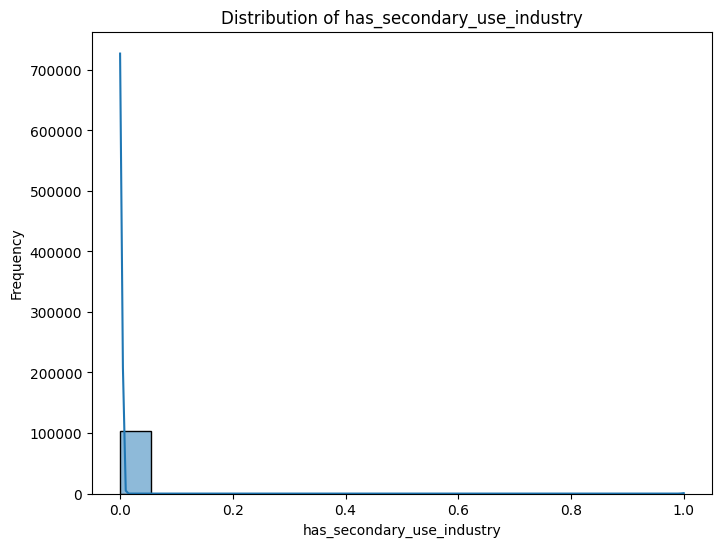

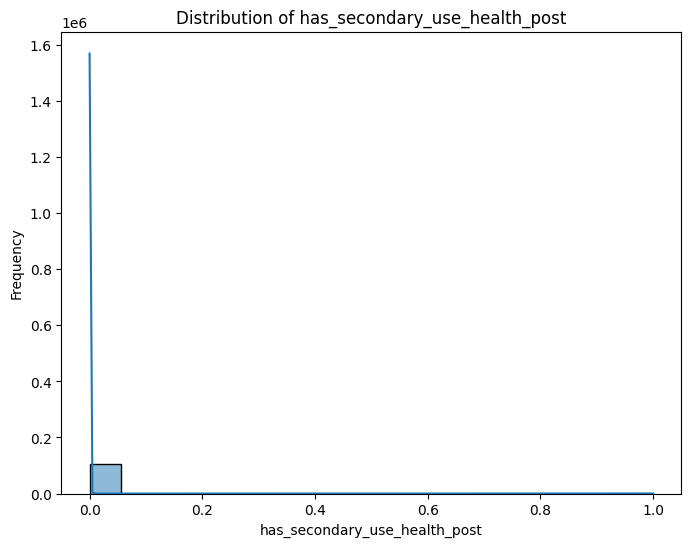

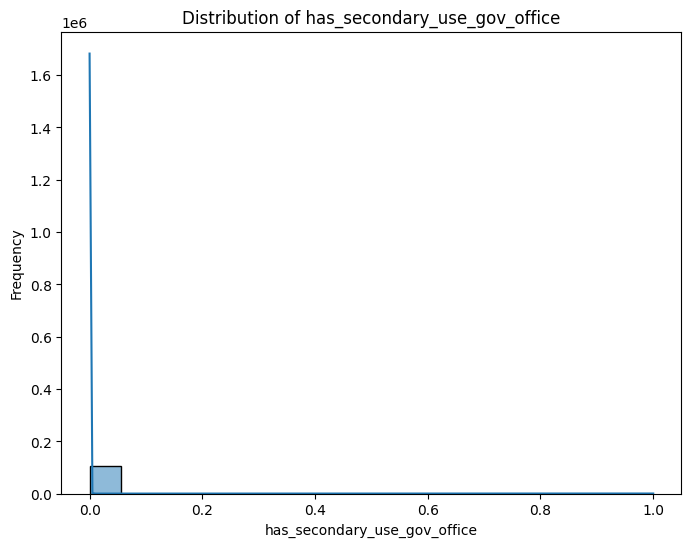

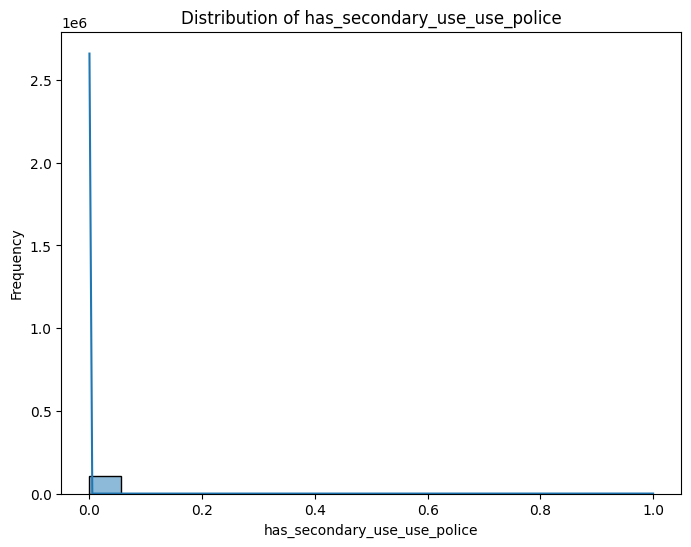

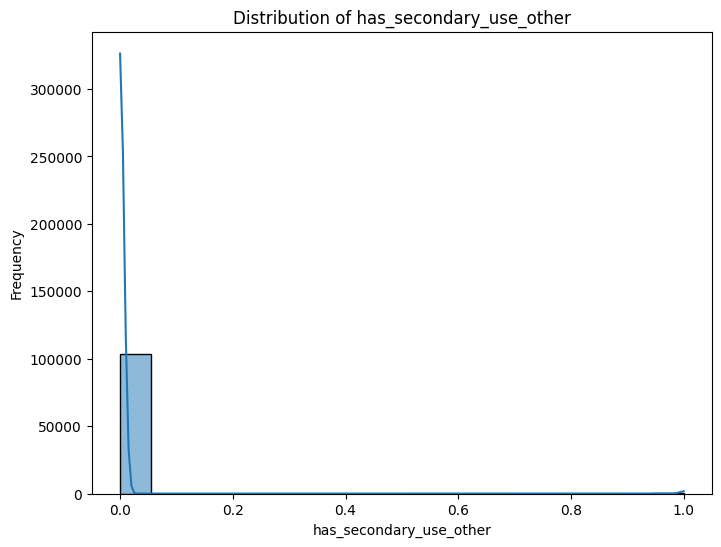

In [ ]:
# prompt:  Numerical Feature Distribution

# Assuming 'train_data' is your DataFrame after cleaning
numerical_features = df_test.select_dtypes(include=['number']).columns

for feature in numerical_features:
  plt.figure(figsize=(8, 6))
  sns.histplot(df_test[feature], kde=True)
  plt.title(f'Distribution of {feature}')
  plt.xlabel(feature)
  plt.ylabel('Frequency')
  plt.show()

# You can also analyze the relationship between numerical features
# and the target variable (damage_grade) using box plots or scatter plots.
# For example, you can analyze how 'age' or 'area' are distributed
# across different damage grades.

# Example with box plots:
# for feature in numerical_features:
#   plt.figure(figsize=(8, 6))
#   sns.boxplot(x='damage_grade', y=feature, data=train_data)
#   plt.title(f'Distribution of {feature} by Damage Grade')
#   plt.xlabel('Damage Grade')
#   plt.ylabel(feature)
#   plt.show()


#Insight:

Outliers and Skewness: If certain features, like age, are skewed or contain outliers, it may indicate that these variables need transformation (e.g., log scaling) or outlier handling to avoid skewing model results.

Distribution Patterns: Observing distribution can help identify key characteristics, like whether building age affects damage_grade.


*4. Categorical Feature Analysis by has_superstructure_mud_mortar_stone*


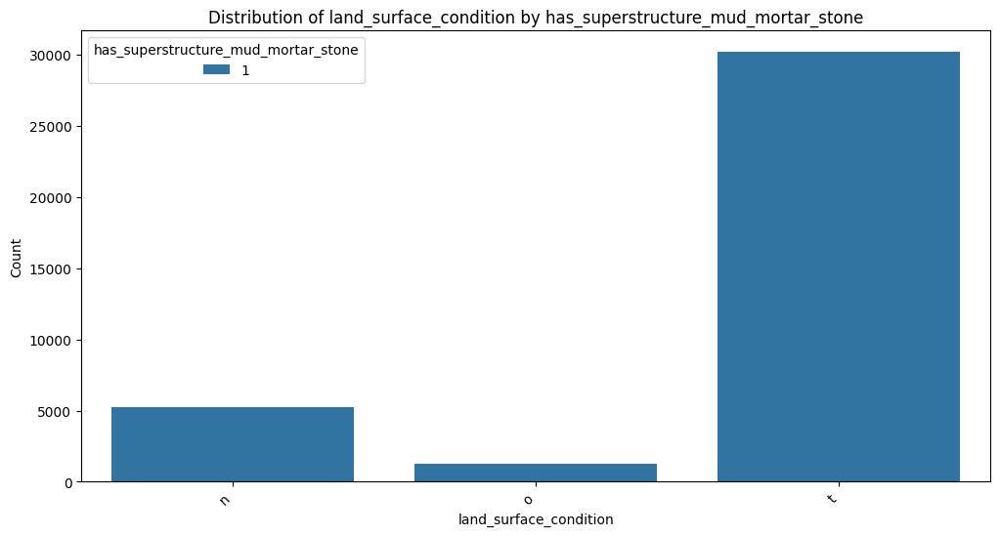

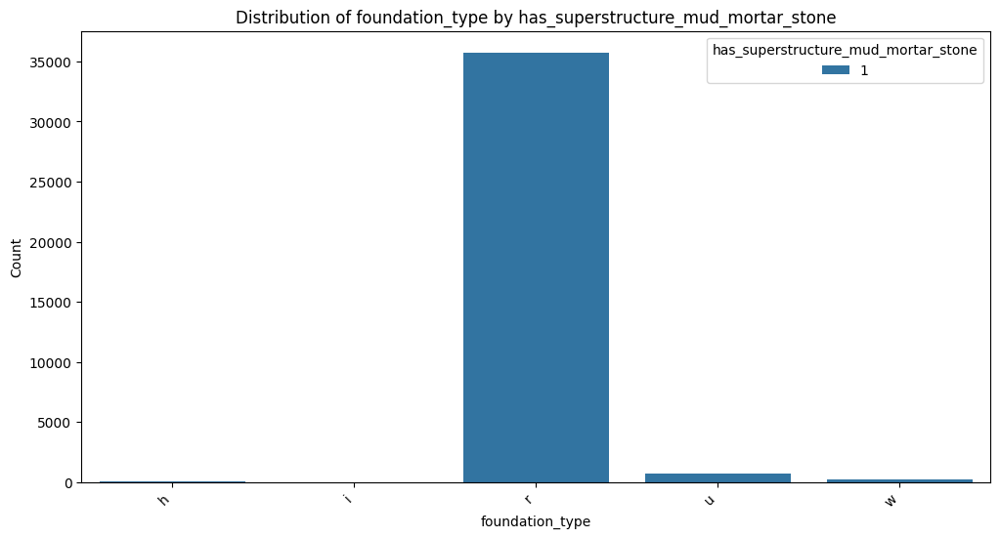

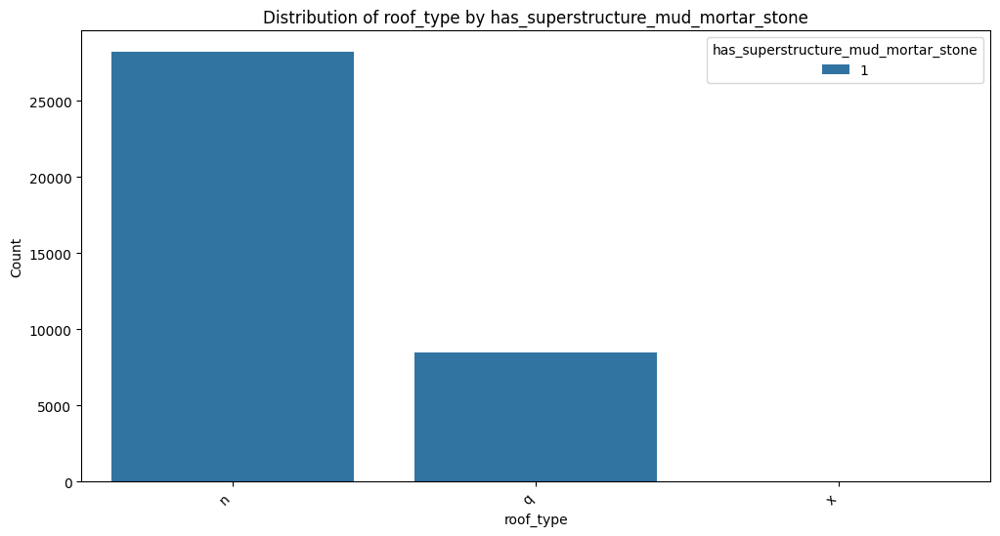

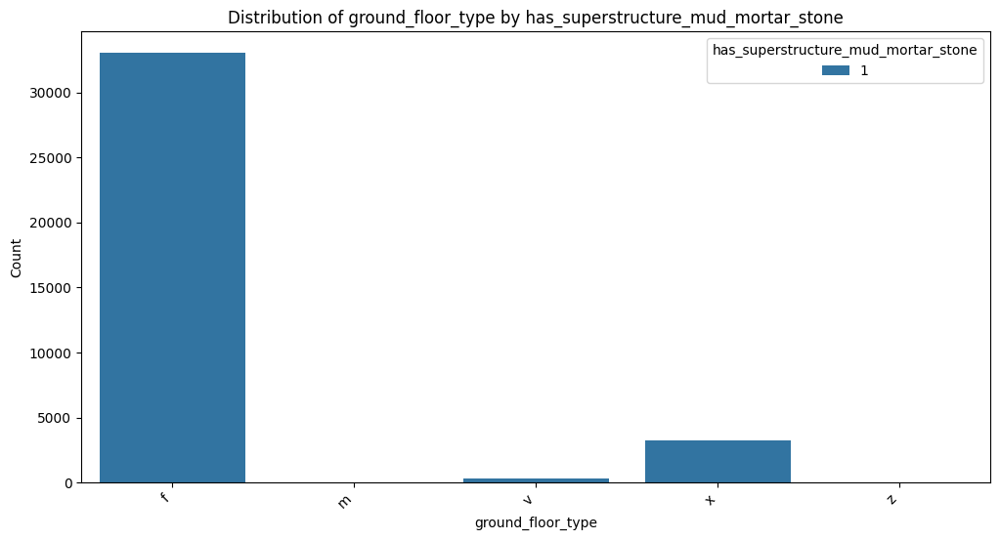

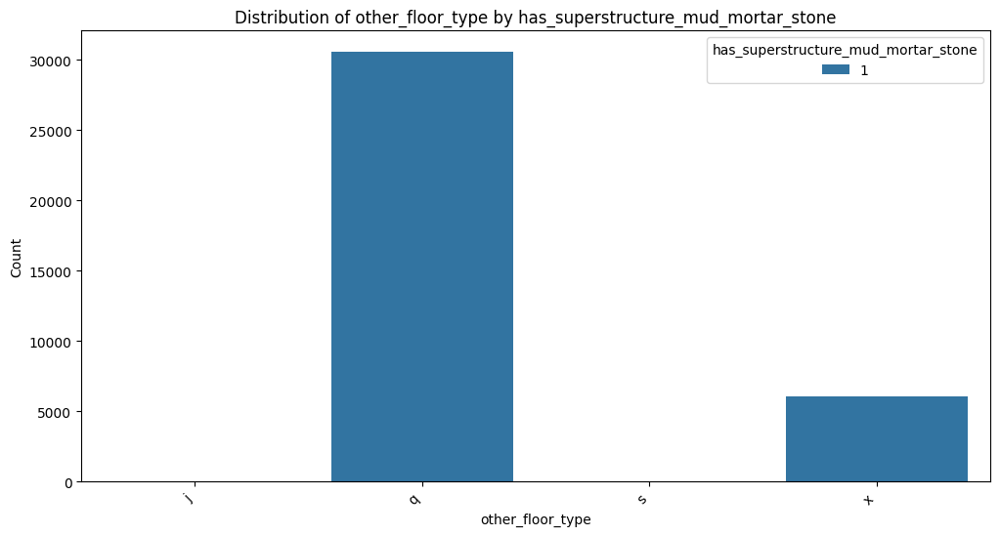

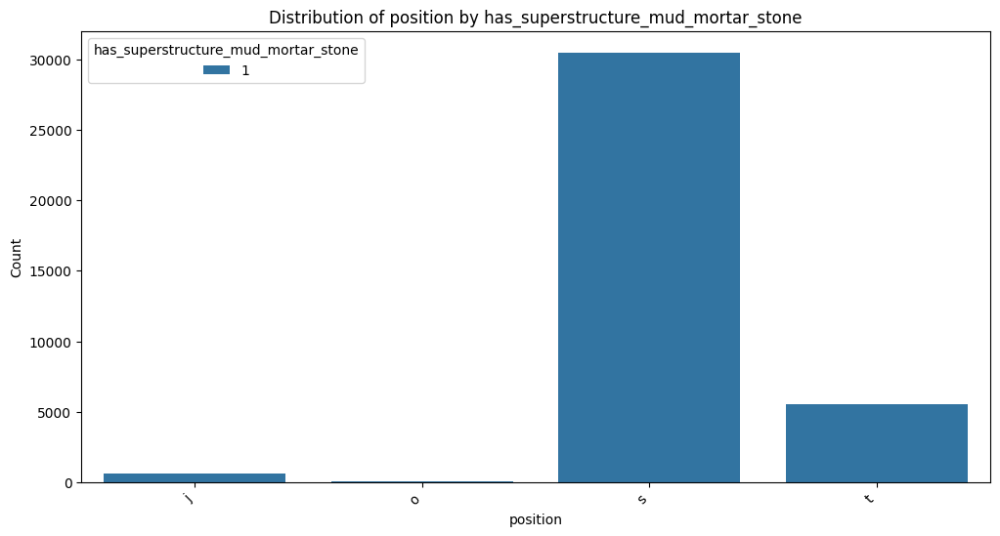

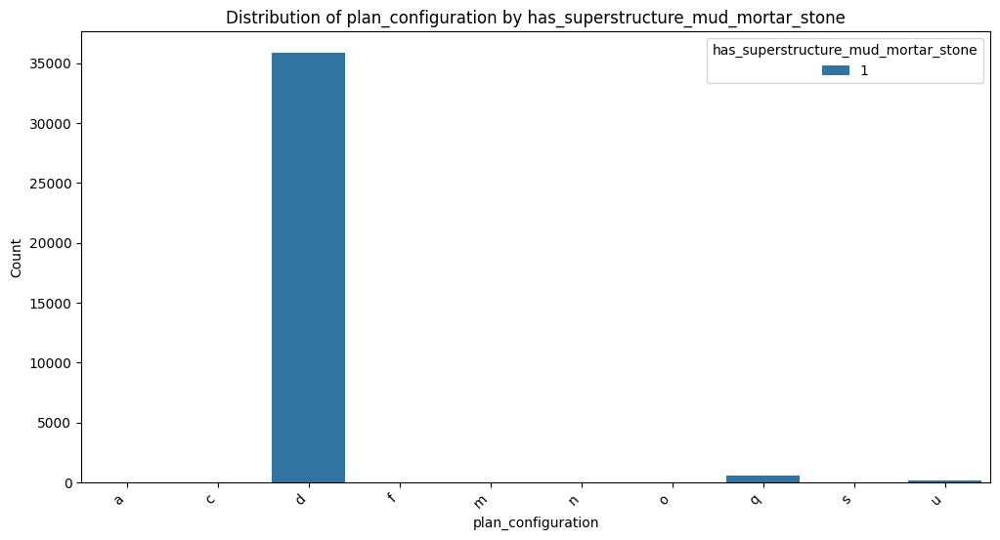

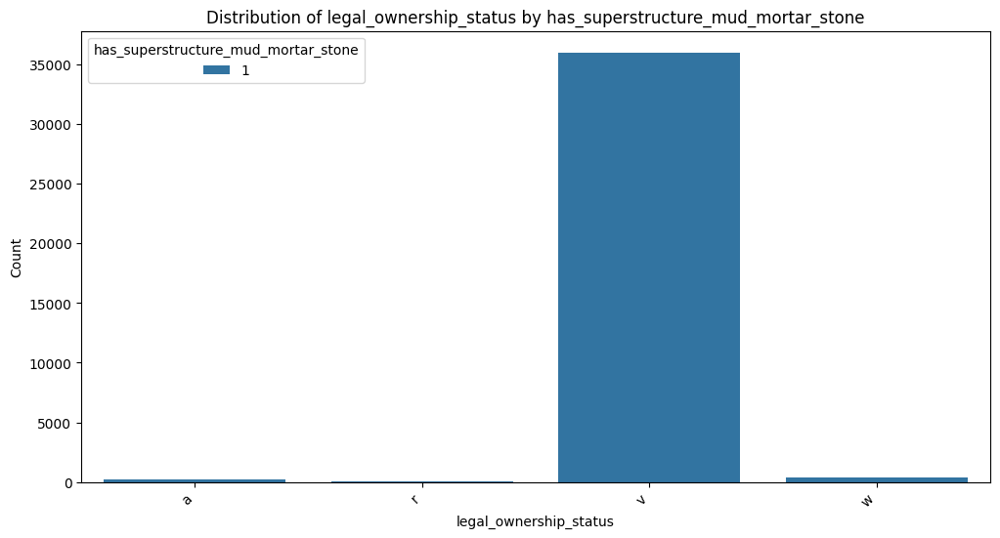

In [ ]:
# prompt: Categorical Feature Analysis by has_superstructure_mud_mortar_stone

# Assuming 'train_data' is your DataFrame after cleaning
categorical_features = ['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type',
                        'other_floor_type', 'position', 'plan_configuration', 'legal_ownership_status']

for feature in categorical_features:
  plt.figure(figsize=(12, 6))
  sns.countplot(x=feature, hue='has_superstructure_mud_mortar_stone', data=train_data_no_outliers)
  plt.title(f'Distribution of {feature} by has_superstructure_mud_mortar_stone')
  plt.xlabel(feature)
  plt.ylabel('Count')
  plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
  plt.legend(title='has_superstructure_mud_mortar_stone')
  plt.show()


#Insight:

Category Vulnerability: If certain categories (e.g., foundation_type like mud-mortar) are associated with high damage_grade, this indicates structural vulnerability in these types of buildings.
Predictive Potential: Categorical features that vary significantly with has_superstructure_mud_mortar_stone might have high predictive value in classification models.


*5. Correlation Analysis for Numerical Features*


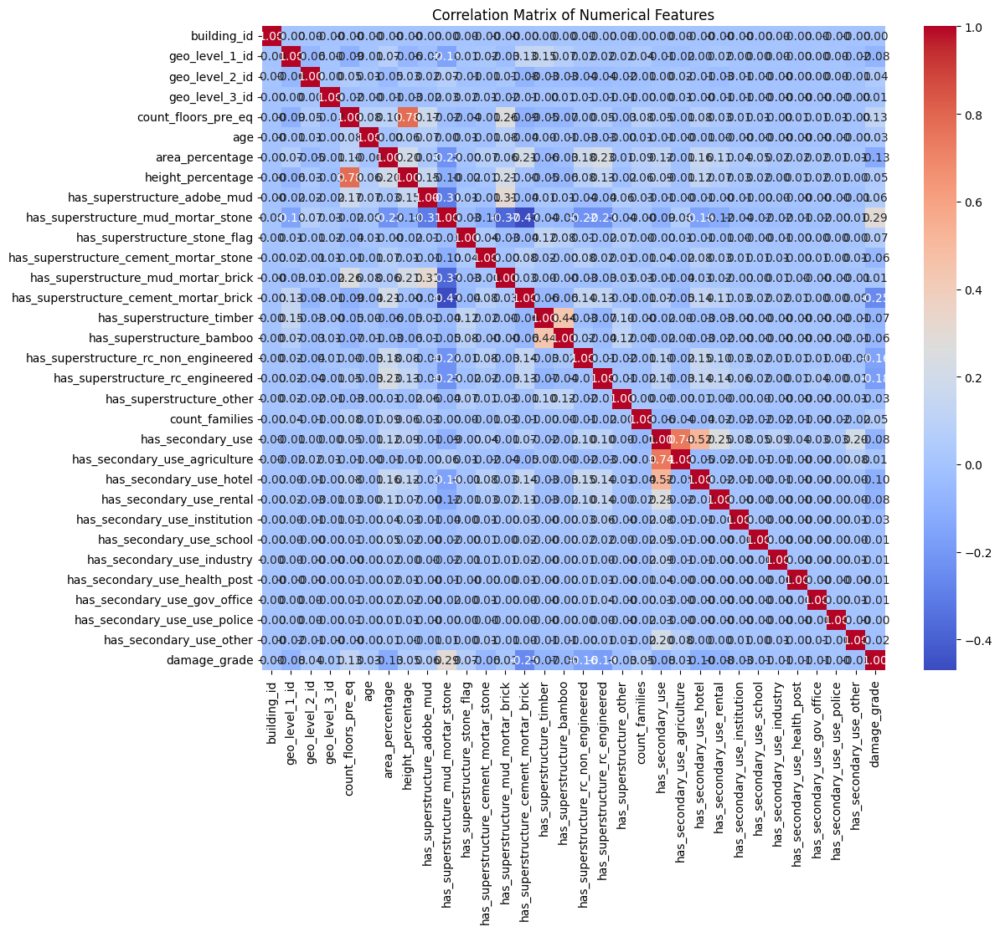

Highly correlated features: {'height_percentage', 'has_secondary_use_agriculture'}


In [ ]:
# Correlation matrix for numerical features
# Select only numerical features for correlation analysis
numerical_features = df_train.select_dtypes(include=['number']).columns
correlation_matrix = df_train[numerical_features].corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Identify highly correlated features (e.g., correlation > 0.7 or <-0.7)
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
  for j in range(i):
    if abs(correlation_matrix.iloc[i, j]) > 0.7:
      colname = correlation_matrix.columns[i]
      correlated_features.add(colname)

print(f"Highly correlated features: {correlated_features}")

# You can further analyze these correlated features and decide whether
# to remove one of the features to avoid multicollinearity in your models.

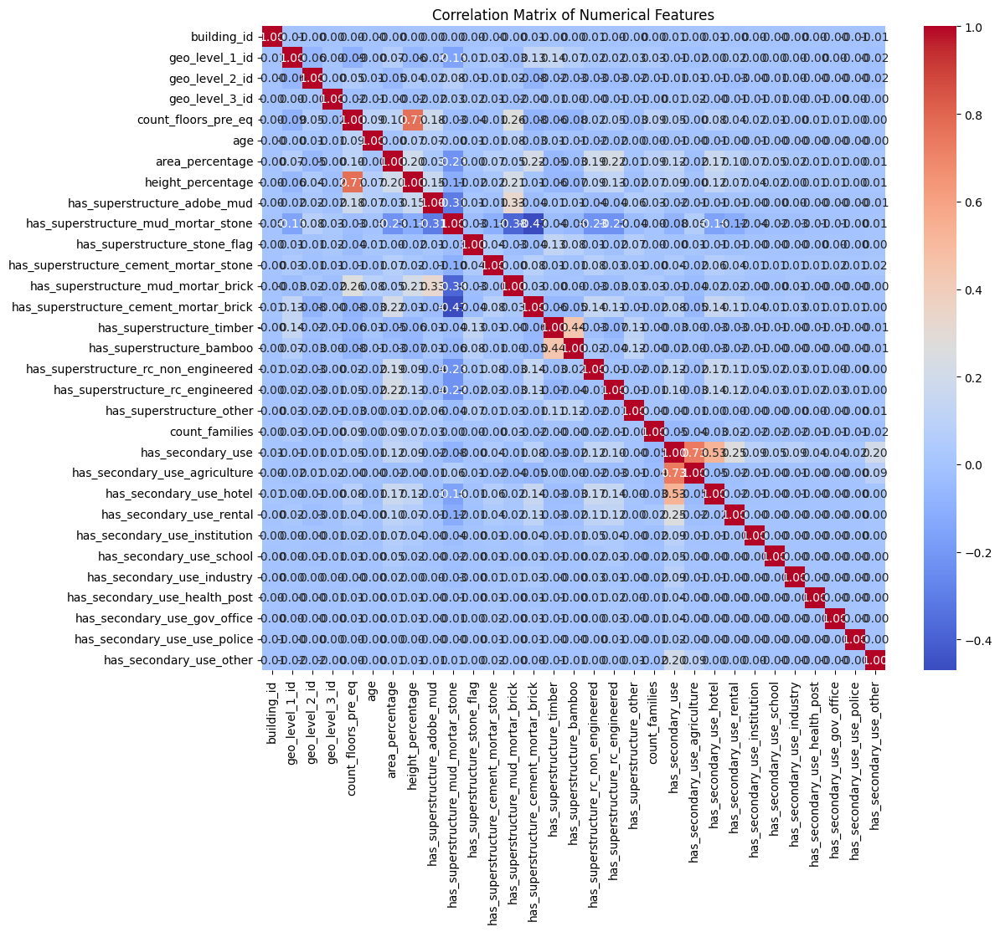

Highly correlated features: {'height_percentage', 'has_secondary_use_agriculture'}


In [ ]:
# Correlation matrix for numerical features
# Select only numerical features for correlation analysis
numerical_features = df_test.select_dtypes(include=['number']).columns
correlation_matrix = df_test[numerical_features].corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Identify highly correlated features (e.g., correlation > 0.7 or <-0.7)
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
  for j in range(i):
    if abs(correlation_matrix.iloc[i, j]) > 0.7:
      colname = correlation_matrix.columns[i]
      correlated_features.add(colname)

print(f"Highly correlated features: {correlated_features}")

# You can further analyze these correlated features and decide whether
# to remove one of the features to avoid multicollinearity in your models.

<*Interaction Between Numerical Features and Damage Grade:*

Exploring combinations of numerical features can reveal how multiple factors influence damage_grade.


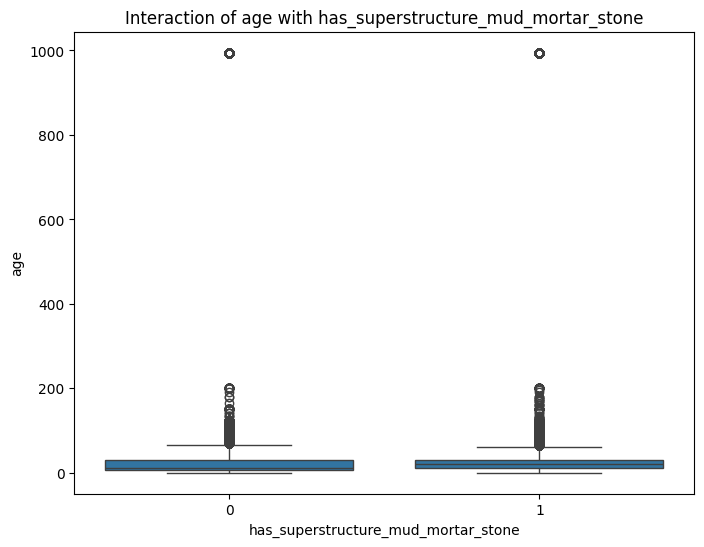

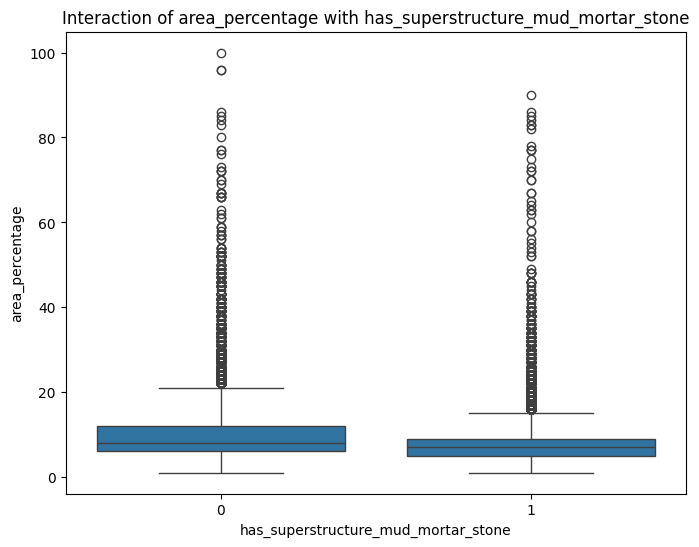

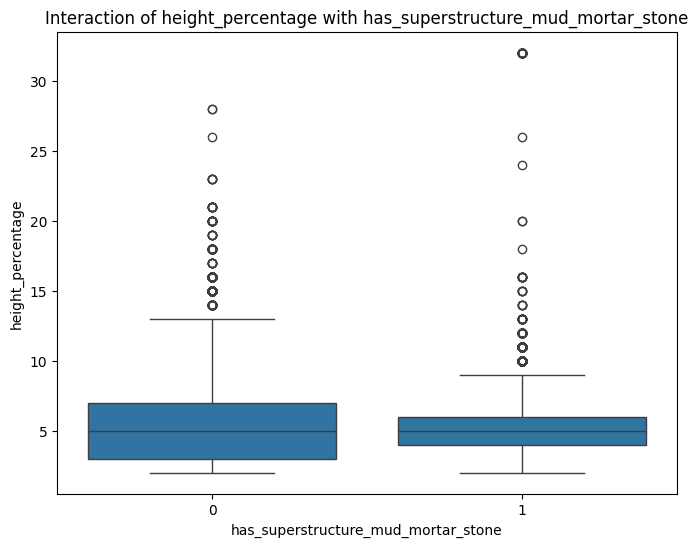

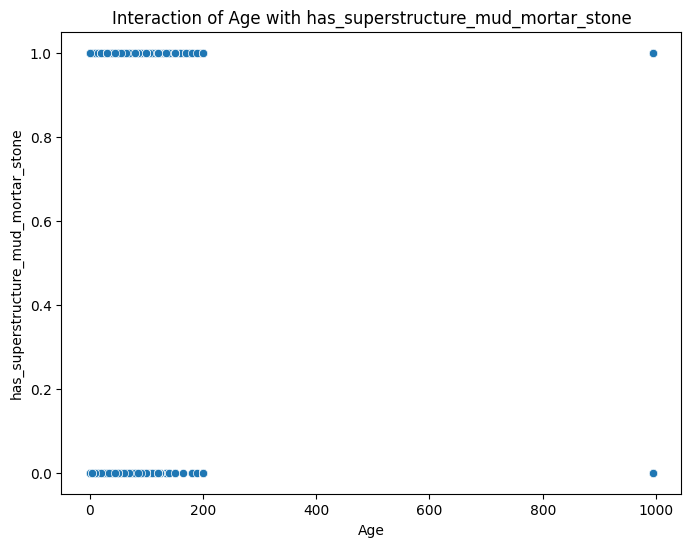

T-test for age between has_superstructure_mud_mortar_stone 1 and 3:
T-statistic: nan
P-value: nan


In [ ]:
# prompt: Interaction Between Numerical Features and has_superstructure_mud_mortar_stone

# Assuming 'train_data' is your DataFrame after cleaning
for feature in ['age', 'area_percentage', 'height_percentage']:  # Replace with your numerical features
  plt.figure(figsize=(8, 6))
  sns.boxplot(x='has_superstructure_mud_mortar_stone', y=feature, data=df_train)
  plt.title(f'Interaction of {feature} with has_superstructure_mud_mortar_stone')
  plt.xlabel('has_superstructure_mud_mortar_stone')
  plt.ylabel(feature)
  plt.show()


# You can also use scatter plots to visualize relationships between
# numerical features and damage grade, especially for continuous variables.
# For example, to visualize the relationship between 'age' and 'damage_grade':
plt.figure(figsize=(8, 6))
sns.scatterplot(x='age', y='has_superstructure_mud_mortar_stone', data=df_train)
plt.title('Interaction of Age with has_superstructure_mud_mortar_stone')
plt.xlabel('Age')
plt.ylabel('has_superstructure_mud_mortar_stone')
plt.show()


# Statistical Tests (e.g., t-test)
# Perform t-tests or ANOVA to compare the mean of a numerical feature
# across different damage grade categories.
# For example, to compare the mean 'age' between damage_grade 1 and 3:
group1 = df_train[df_train['has_superstructure_mud_mortar_stone'] == 1]['age']
group3 = df_train[df_train['has_superstructure_mud_mortar_stone'] == 3]['age']

t_statistic, p_value = ttest_ind(group1, group3)
print(f"T-test for age between has_superstructure_mud_mortar_stone 1 and 3:")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


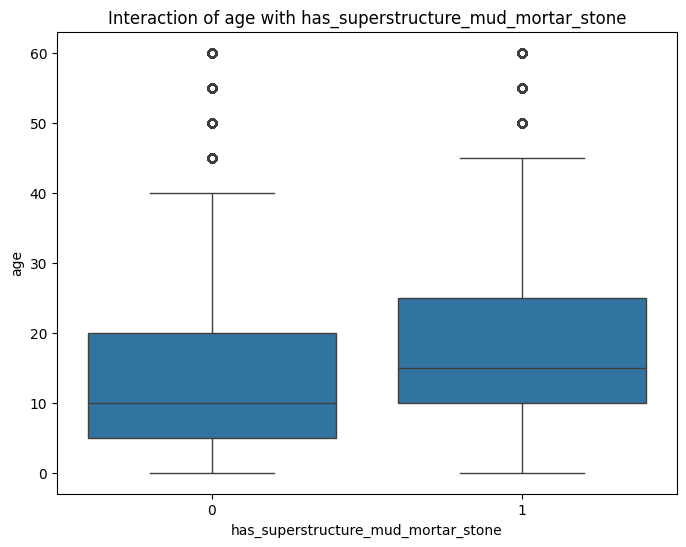

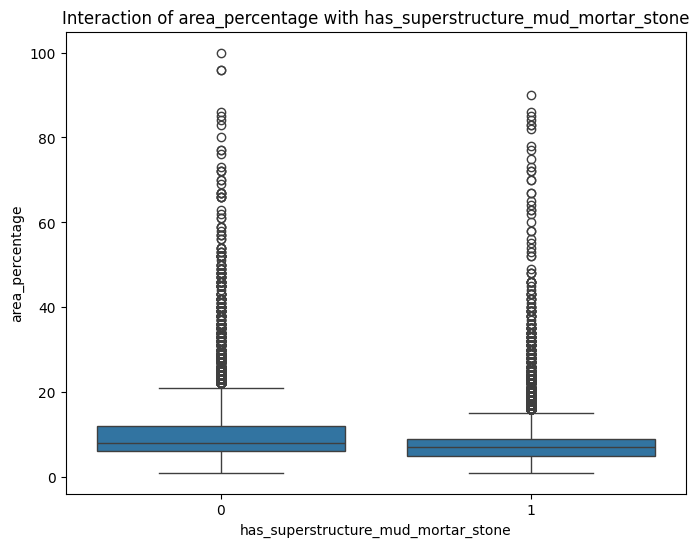

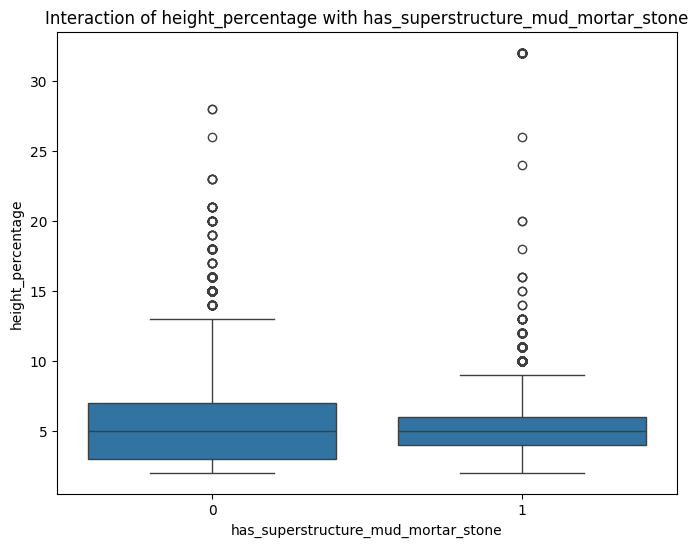

In [ ]:
# prompt: Interaction Between Numerical Features and has_superstructure_mud_mortar_stone

# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Assuming you have a DataFrame named 'train_data' with outliers
# Replace 'your_outlier_removal_method' with the actual method used to remove outliers
# For example, if you used the IQR method:
Q1 = train_data['age'].quantile(0.25)
Q3 = train_data['age'].quantile(0.75)
IQR = Q3 - Q1
train_data_no_outliers = train_data[~((train_data['age'] < (Q1 - 1.5 * IQR)) | (train_data['age'] > (Q3 + 1.5 * IQR)))]

# ... (your outlier removal logic here) ...

# Or if you have a pre-existing DataFrame containing outlier-free data,
# assign it to 'train_data_no_outliers':
# train_data_no_outliers = your_outlier_free_dataframe

# Rest of the code remains the same
for feature in ['age', 'area_percentage', 'height_percentage']:  # Replace with your numerical features
  plt.figure(figsize=(8, 6))
  sns.boxplot(x='has_superstructure_mud_mortar_stone', y=feature, data=train_data_no_outliers)
  plt.title(f'Interaction of {feature} with has_superstructure_mud_mortar_stone')
  plt.xlabel('has_superstructure_mud_mortar_stone')
  plt.ylabel(feature)
  plt.show()

# ... (rest of the code) ...

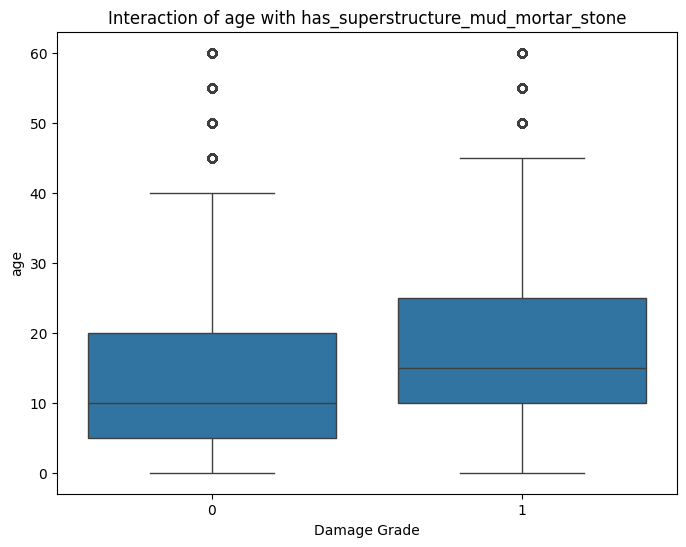

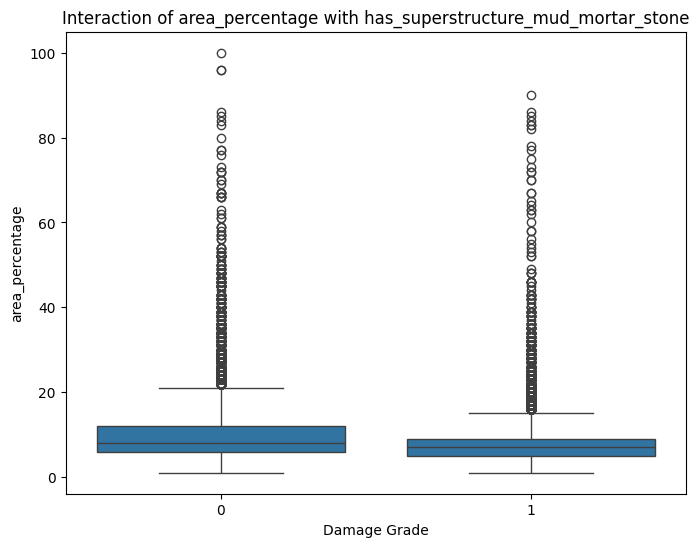

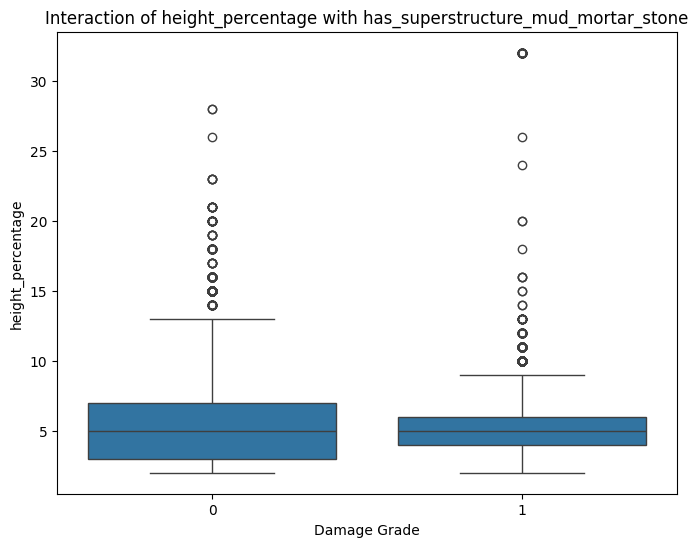

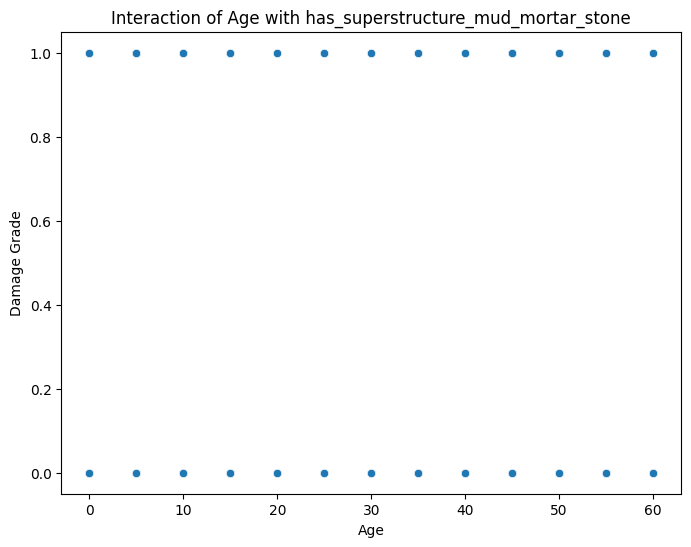

T-test for age between has_superstructure_mud_mortar_stone 1 and 3:
T-statistic: nan
P-value: nan


In [ ]:
# prompt: Interaction Between Numerical Features and Damage Grade

# Assuming 'train_data' is your DataFrame after cleaning
for feature in ['age', 'area_percentage', 'height_percentage']:  # Replace with your numerical features
  plt.figure(figsize=(8, 6))
  sns.boxplot(x='has_superstructure_mud_mortar_stone', y=feature, data=train_data_no_outliers)
  plt.title(f'Interaction of {feature} with has_superstructure_mud_mortar_stone')
  plt.xlabel('Damage Grade')
  plt.ylabel(feature)
  plt.show()


# You can also use scatter plots to visualize relationships between
# numerical features and damage grade, especially for continuous variables.
# For example, to visualize the relationship between 'age' and 'damage_grade':
plt.figure(figsize=(8, 6))
sns.scatterplot(x='age', y='has_superstructure_mud_mortar_stone', data=train_data_no_outliers)
plt.title('Interaction of Age with has_superstructure_mud_mortar_stone')
plt.xlabel('Age')
plt.ylabel('Damage Grade')
plt.show()


# Statistical Tests (e.g., t-test)
# Perform t-tests or ANOVA to compare the mean of a numerical feature
# across different damage grade categories.
# For example, to compare the mean 'age' between damage_grade 1 and 3:
group1 = train_data_no_outliers[train_data_no_outliers['has_superstructure_mud_mortar_stone'] == 1]['age']
group3 = train_data_no_outliers[train_data_no_outliers['has_superstructure_mud_mortar_stone'] == 3]['age']

t_statistic, p_value = ttest_ind(group1, group3)
print(f"T-test for age between has_superstructure_mud_mortar_stone 1 and 3:")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


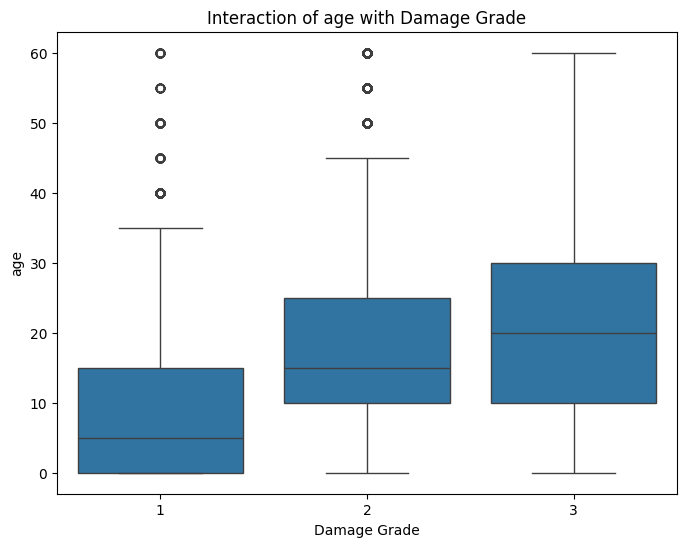

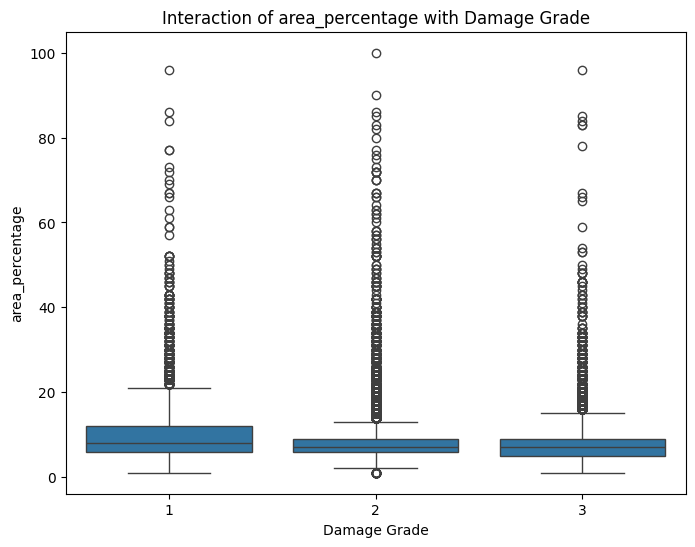

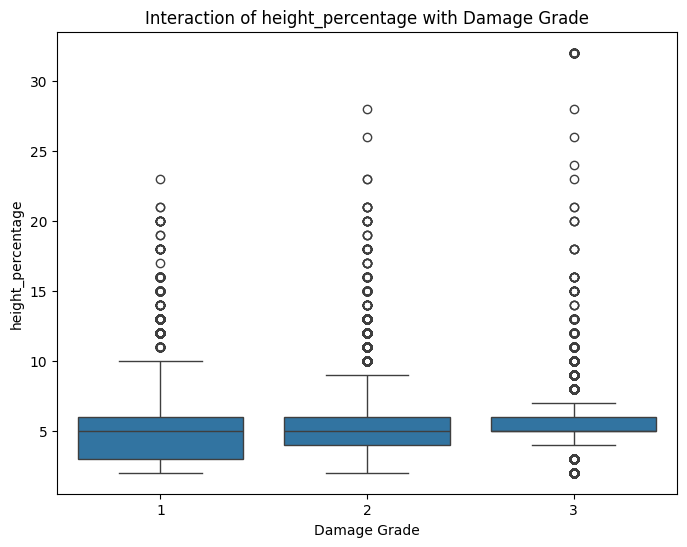

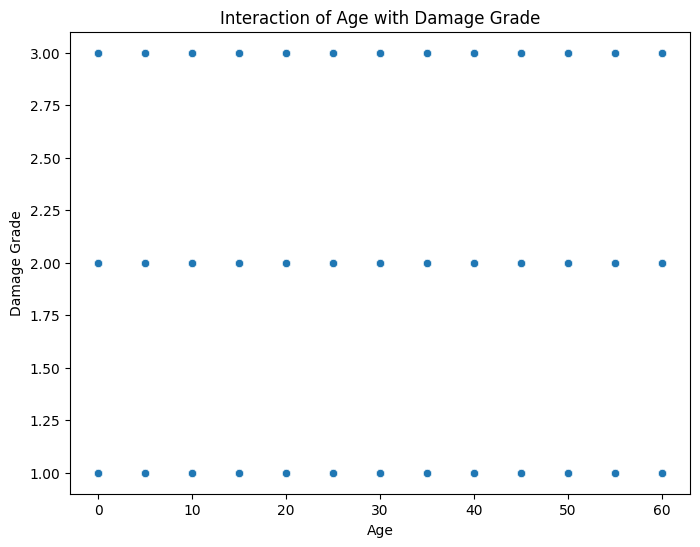

T-test for age between damage_grade 1 and 3:
T-statistic: -84.60547973399098
P-value: 0.0


In [ ]:
# prompt: Interaction Between Numerical Features and Damage Grade

# Assuming 'train_data' is your DataFrame after cleaning
for feature in ['age', 'area_percentage', 'height_percentage']:  # Replace with your numerical features
  plt.figure(figsize=(8, 6))
  sns.boxplot(x='damage_grade', y=feature, data=train_data_no_outliers)
  plt.title(f'Interaction of {feature} with Damage Grade')
  plt.xlabel('Damage Grade')
  plt.ylabel(feature)
  plt.show()


# You can also use scatter plots to visualize relationships between
# numerical features and damage grade, especially for continuous variables.
# For example, to visualize the relationship between 'age' and 'damage_grade':
plt.figure(figsize=(8, 6))
sns.scatterplot(x='age', y='damage_grade', data=train_data_no_outliers)
plt.title('Interaction of Age with Damage Grade')
plt.xlabel('Age')
plt.ylabel('Damage Grade')
plt.show()


# Statistical Tests (e.g., t-test)
# Perform t-tests or ANOVA to compare the mean of a numerical feature
# across different damage grade categories.
# For example, to compare the mean 'age' between damage_grade 1 and 3:
group1 = train_data_no_outliers[train_data_no_outliers['damage_grade'] == 1]['age']
group3 = train_data_no_outliers[train_data_no_outliers['damage_grade'] == 3]['age']

t_statistic, p_value = ttest_ind(group1, group3)
print(f"T-test for age between damage_grade 1 and 3:")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")


# Insight:

# Age: Buildings with higher ages might show a greater likelihood of severe damage.
# Area Percentage: Buildings with larger areas or percentages might be more vulnerable.
# Height Percentage: Buildings with larger heights or percentages may be at higher risk.


# You can also investigate other numerical features that might interact with damage grade
# and perform similar analyses.

#Insight:

Combined Influence: Observing feature pairs, like height_percentage vs. age, could reveal that certain combinations are linked to higher damage_grade. For instance, older and taller buildings might exhibit increased vulnerability, suggesting an interaction effect between building age and height.


<*Age Binning and its Impact on Damage Grade:*

Creating bins for age can help determine if certain age ranges of buildings have a higher incidence of specific damage_grade values.



<ipython-input-39-264d37864d2b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_no_outliers['age_bin'] = pd.cut(train_data_no_outliers['age'], bins=bins, labels=labels, right=False)


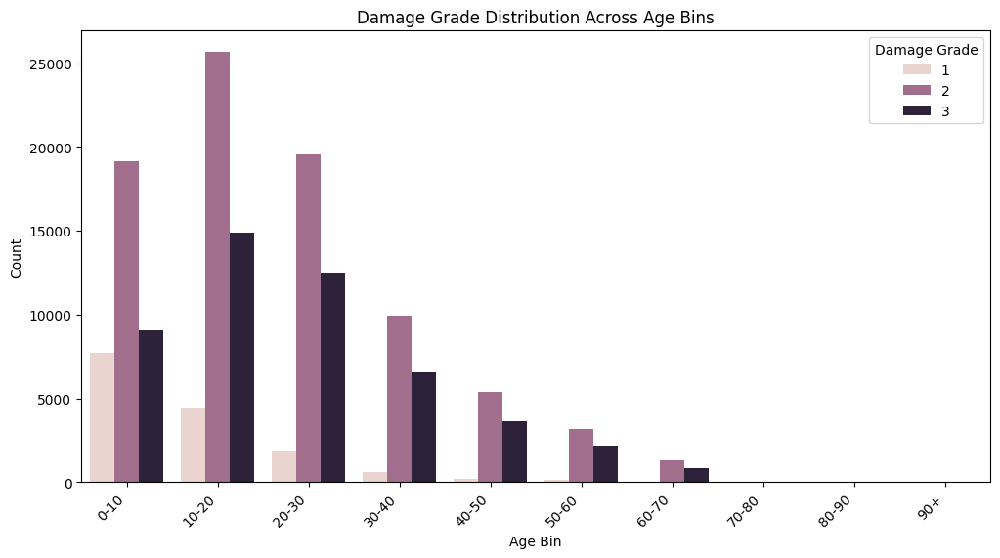

<ipython-input-39-264d37864d2b>:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  damage_grade_3_proportion = train_data_no_outliers.groupby('age_bin')['damage_grade'].apply(lambda x: (x == 3).mean()).reset_index(name='proportion_damage_grade_3')


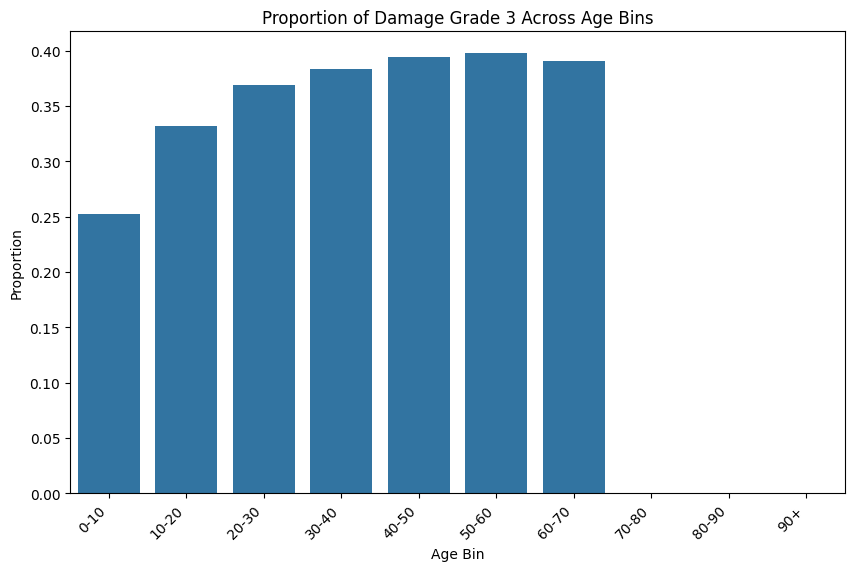

In [ ]:
# prompt: Age Binning and its Impact on Damage Grade

# Assuming 'train_data_no_outliers' is your DataFrame after cleaning
# and you want to analyze the impact of age on damage grade.

# Create age bins (you can adjust the bin edges as needed)
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, float('inf')]  # Adjust bin edges
labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90+']

train_data_no_outliers['age_bin'] = pd.cut(train_data_no_outliers['age'], bins=bins, labels=labels, right=False)

# Analyze the relationship between age bins and damage grade
plt.figure(figsize=(12, 6))
sns.countplot(x='age_bin', hue='damage_grade', data=train_data_no_outliers)
plt.title('Damage Grade Distribution Across Age Bins')
plt.xlabel('Age Bin')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Damage Grade')
plt.show()

# You can also calculate the proportion of each damage grade within each age bin
# to get a clearer understanding of the impact.

# Example: Calculate the proportion of damage_grade 3 in each age bin
damage_grade_3_proportion = train_data_no_outliers.groupby('age_bin')['damage_grade'].apply(lambda x: (x == 3).mean()).reset_index(name='proportion_damage_grade_3')

plt.figure(figsize=(10, 6))
sns.barplot(x='age_bin', y='proportion_damage_grade_3', data=damage_grade_3_proportion)
plt.title('Proportion of Damage Grade 3 Across Age Bins')
plt.xlabel('Age Bin')
plt.ylabel('Proportion')
plt.xticks(rotation=45, ha='right')
plt.show()

# Insight:

# Age Bin Effect: Analyze how the proportion of each damage grade changes across different age bins.
# For example, older buildings (e.g., 60+ years) may have a higher proportion of damage grade 3.
# This highlights the impact of age on the likelihood of severe damage.

# You can extend this analysis to other variables and calculate proportions for specific damage grades to further understand their impact on building damage.

<*Building Height and Family Count Relationship with Damage Grade:*


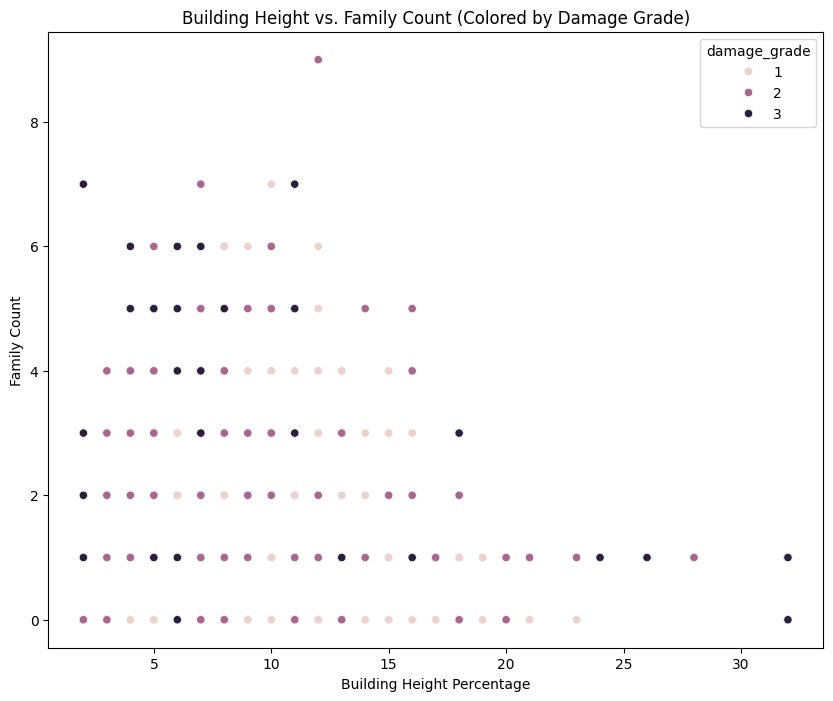

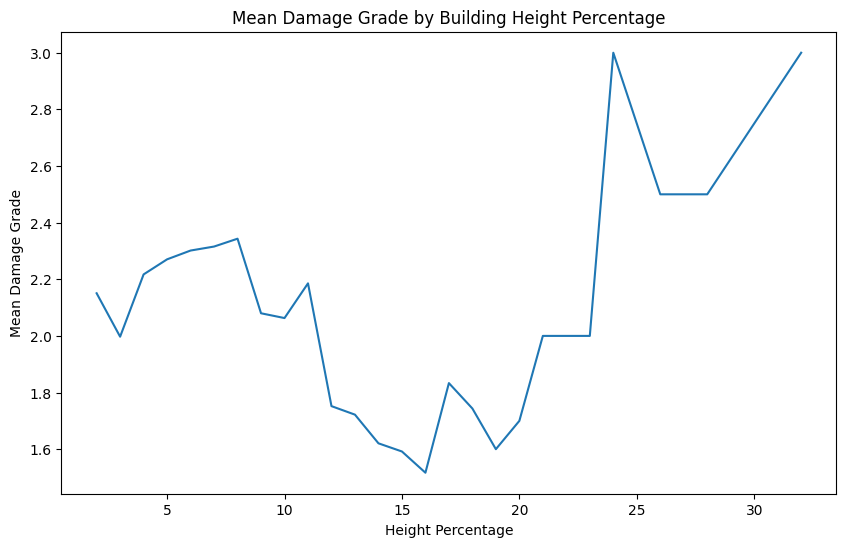

In [ ]:
# prompt: Building Height and Family Count Relationship

# Assuming 'train_data_no_outliers' is your DataFrame after cleaning
# and you want to analyze the relationship between building height,
# family count, and damage grade.

# Create a scatter plot to visualize the relationship between height_percentage
# and family count, colored by damage grade
plt.figure(figsize=(10, 8))
sns.scatterplot(x='height_percentage', y='count_families', hue='damage_grade', data=train_data_no_outliers)
plt.title('Building Height vs. Family Count (Colored by Damage Grade)')
plt.xlabel('Building Height Percentage')
plt.ylabel('Family Count')
plt.show()

# You can also create a 3D scatter plot to visualize the interaction between
# height_percentage, family count, and damage grade in more detail (if you have
# a suitable library like mpl_toolkits.mplot3d).


# Analyze the mean damage grade for different ranges of height_percentage and family count
# For example, create bins for height_percentage and family count, then calculate the
# mean damage grade for each combination of bins.

# You can use groupby to analyze the relationship in a more statistical way.
# For example, calculate the mean damage grade for different ranges of height_percentage:
height_damage_relationship = train_data_no_outliers.groupby('height_percentage')['damage_grade'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(x='height_percentage', y='damage_grade', data=height_damage_relationship)
plt.title('Mean Damage Grade by Building Height Percentage')
plt.xlabel('Height Percentage')
plt.ylabel('Mean Damage Grade')
plt.show()

# You can do the same for family count.

# Insight:

# Interaction: Investigate if buildings with both high height_percentage and a large family count
# are more likely to experience a specific damage grade (e.g., severe damage).
# You can identify potential interactions between these variables and damage grade by looking
# at clustering patterns or trends in the scatter plots.

# Potential Implications: If you find that certain combinations of height_percentage and
# family count correlate with higher damage_grade, it might suggest that taller buildings
# with a larger number of occupants may be more vulnerable to damage during an earthquake.
# This information could be useful for identifying potential risk areas and improving building
# design or safety measures.


#Insight:

Structural Load and Stability: If higher buildings with more families (higher structural load) tend to have higher damage grade, it suggests that load-bearing capacity might be a critical factor. This insight could prompt considerations for reinforcing buildings with high family counts.


<*Ratio-Based Features:*


<ipython-input-41-b2526c685162>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_no_outliers['area_height_ratio'] = train_data_no_outliers['area_percentage'] / train_data_no_outliers['height_percentage']
<ipython-input-41-b2526c685162>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_no_outliers['age_area_ratio'] = train_data_no_outliers['age'] / train_data_no_outliers['area_percentage']


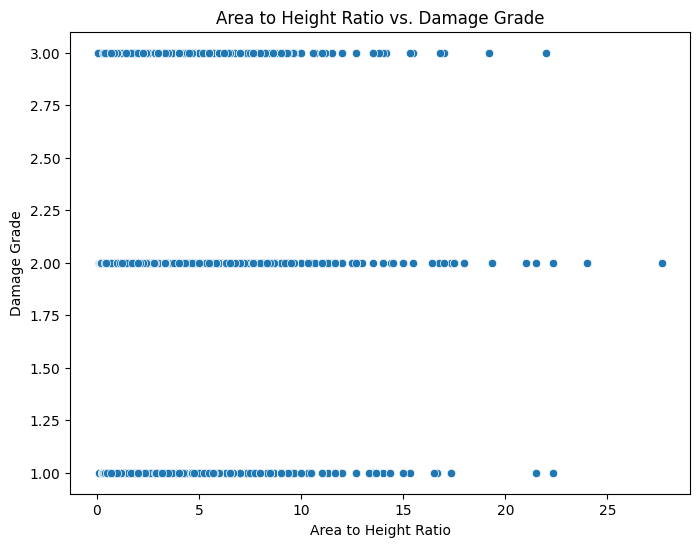

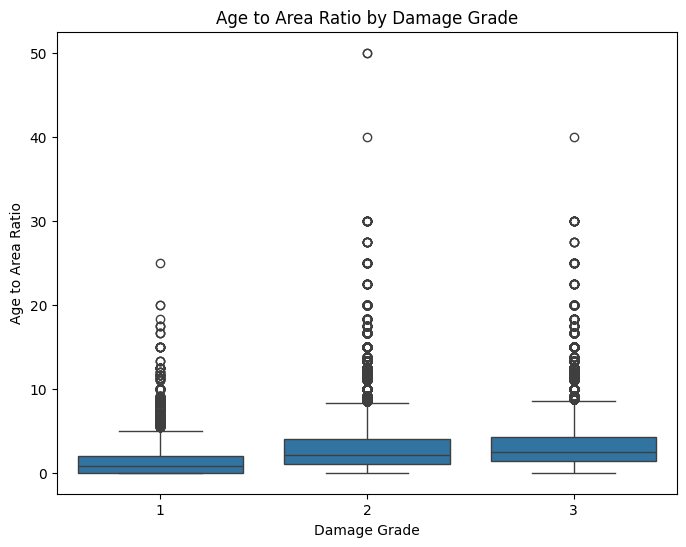

Correlation between area_height_ratio and damage_grade: -0.1575707582289357


In [ ]:
# prompt: Ratio-Based Features

# Assuming 'train_data_no_outliers' is your DataFrame after cleaning
# and you want to create ratio-based features.

# Example: Area to Height Ratio
train_data_no_outliers['area_height_ratio'] = train_data_no_outliers['area_percentage'] / train_data_no_outliers['height_percentage']

# Example: Age to Area Ratio
train_data_no_outliers['age_area_ratio'] = train_data_no_outliers['age'] / train_data_no_outliers['area_percentage']

# You can create other ratio-based features as needed based on your data and
# insights from the EDA.

# Analyze the relationship between these ratio-based features and damage grade
# using similar techniques as in the previous analyses (e.g., scatter plots, box plots, correlations).

# Example: Scatter plot of area_height_ratio vs. damage_grade
plt.figure(figsize=(8, 6))
sns.scatterplot(x='area_height_ratio', y='damage_grade', data=train_data_no_outliers)
plt.title('Area to Height Ratio vs. Damage Grade')
plt.xlabel('Area to Height Ratio')
plt.ylabel('Damage Grade')
plt.show()

# Example: Box plot of age_area_ratio by damage_grade
plt.figure(figsize=(8, 6))
sns.boxplot(x='damage_grade', y='age_area_ratio', data=train_data_no_outliers)
plt.title('Age to Area Ratio by Damage Grade')
plt.xlabel('Damage Grade')
plt.ylabel('Age to Area Ratio')
plt.show()

# You can calculate correlations between ratio-based features and damage grade
# to further understand the relationship.

# Example: Correlation between area_height_ratio and damage_grade
correlation_area_height_ratio = train_data_no_outliers['area_height_ratio'].corr(train_data_no_outliers['damage_grade'])
print(f"Correlation between area_height_ratio and damage_grade: {correlation_area_height_ratio}")


# Insight:

# Potential Interactions: Ratio-based features can capture the interaction between two or
# more features. For example, the area_height_ratio may reveal whether a building with
# a larger area relative to its height is more prone to specific damage.

# Improved Predictive Power: Ratio-based features can potentially enhance the predictive
# power of your models, especially if they represent meaningful relationships
# between different features.


# You can further analyze and experiment with different ratio-based features to
# find those that provide the most valuable insights and contribute most to
# your model's performance.

#Insight:

Structural Proportion Impact: If the height_to_area_ratio is high in buildings with severe damage_grade, it suggests that buildings with tall, narrow structures might be more vulnerable to earthquakes. This insight could guide structural design recommendations for earthquake-prone areas.


<*Aggregating Structural Categories*



<ipython-input-42-ee7decc86da6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_no_outliers['floor_combined'] = train_data_no_outliers['ground_floor_type'].astype(str) + train_data['other_floor_type'].astype(str)


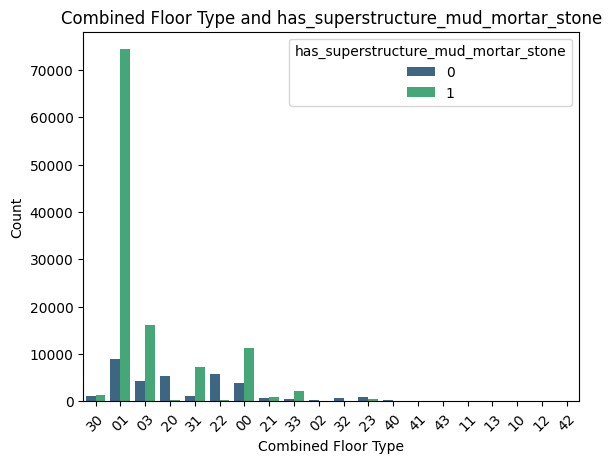

In [ ]:
# Create a combined floor type feature and analyze
train_data_no_outliers['floor_combined'] = train_data_no_outliers['ground_floor_type'].astype(str) + train_data['other_floor_type'].astype(str)
sns.countplot(data=train_data_no_outliers, x='floor_combined', hue='has_superstructure_mud_mortar_stone', palette='viridis')
plt.title("Combined Floor Type and has_superstructure_mud_mortar_stone")
plt.xlabel("Combined Floor Type")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

<*Analysis of Building Position and Orientation:*


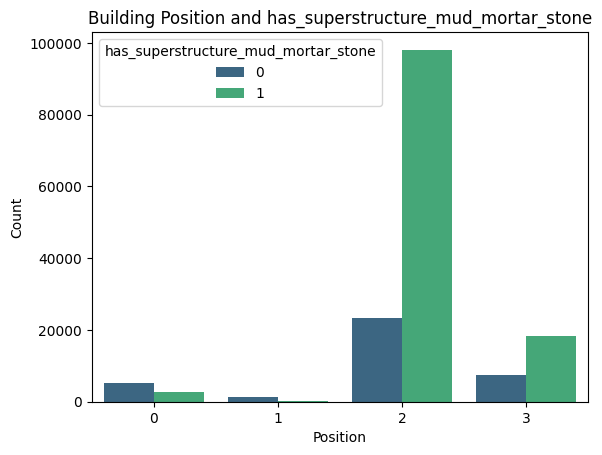

In [ ]:
# Analyze the effect of position on has_superstructure_mud_mortar_stone
sns.countplot(data=train_data, x='position', hue='has_superstructure_mud_mortar_stone', palette='viridis')
plt.title("Building Position and has_superstructure_mud_mortar_stone")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()


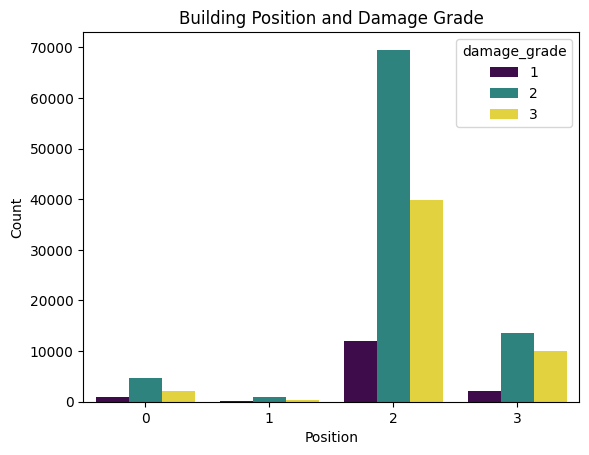

In [ ]:
# Analyze the effect of position on damage grade
sns.countplot(data=train_data, x='position', hue='damage_grade', palette='viridis')
plt.title("Building Position and Damage Grade")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()


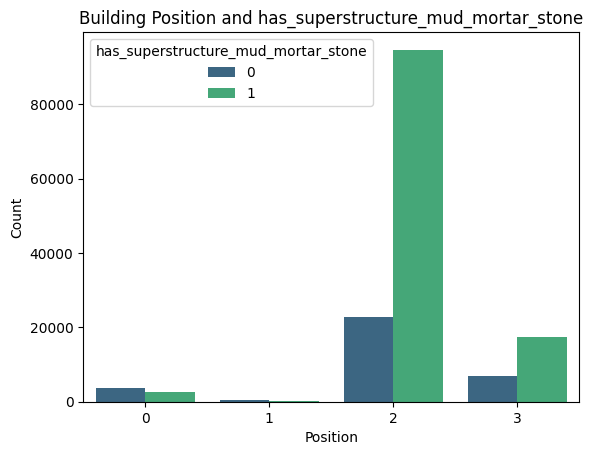

In [ ]:
# Analyze the effect of position on has_superstructure_mud_mortar_stone
sns.countplot(data=train_data_no_outliers, x='position', hue='has_superstructure_mud_mortar_stone', palette='viridis')
plt.title("Building Position and has_superstructure_mud_mortar_stone")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()


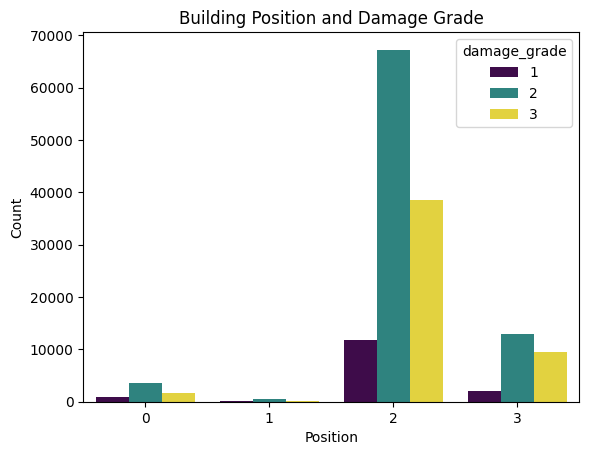

In [ ]:
# Analyze the effect of position on damage grade
sns.countplot(data=train_data_no_outliers, x='position', hue='damage_grade', palette='viridis')
plt.title("Building Position and Damage Grade")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()


#EDA INSIGHTS SUMMARIZE:

These insights build on the initial EDA findings by analyzing feature interactions, aggregating categories, creating ratios, and exploring geospatial, structural, and temporal dimensions. This deeper EDA can help identify more complex patterns, uncover new predictive features, and support more informed decisions in feature engineering and model selection. Let me know if you’d like to explore any specific aspect further!

#4. DATA PREPRPCESSING>>

*APPLY THE DIFFERENT ALGORIHTMS IN DATASET:~*

#A) LOGISTIC REGRESSION CLASSIFICATION ALGOTITHM

In [ ]:
# prompt: Load the dataset

import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# #1. Data Load
# Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.

!pip install gdown


# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

# #2. DATA CLEANING
# *Step 1: load/Read The Dataset*


def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)

if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head())
  print("Test DataFrame:", df_test.head())


Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 77.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 132MB/s]


Train DataFrame:    building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0       903419              22            1136            5551   
1       911693              25             419           11222   
2       888461              23             892            6156   
3       503788              10            1397            1591   
4       634804              27             422           10353   

   count_floors_pre_eq  age  area_percentage  height_percentage  \
0                    1   20                4                  2   
1                    2   15               12                  5   
2                    3   30                8                  7   
3                    2   15                7                  6   
4                    2   30                7                  5   

  land_surface_condition foundation_type  ... has_secondary_use_hotel  \
0                      t               r  ...                       0   
1                      n             

In [ ]:
df_train = df_train.rename(columns={'has_superstructure_mud_mortar_stone': 'target'})

In [ ]:
print(df_train['target'].unique())

[1 0]


In [ ]:
from sklearn.model_selection import train_test_split

X = df_train.drop('target', axis=1)
y = df_train['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
130055,251157,20,251,1863,2,5,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
12526,639857,6,744,4616,2,25,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
119864,923395,16,177,4571,2,20,6,5,n,r,...,0,0,0,0,0,0,0,0,0,2
36336,26752,20,832,3971,2,10,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
52785,839073,8,426,173,3,30,3,7,t,r,...,0,0,0,0,0,0,0,0,0,3


In [ ]:
y_train.head()

,target
130055,1
12526,1
119864,1
36336,1
52785,1


# TRAIN AND TEST THE MODEL>>

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

# Identify categorical columns in X_train
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Create a OneHotEncoder instance
enc = OneHotEncoder(handle_unknown='ignore')

# Fit the encoder on X_train and transform both X_train and X_test
X_train_encoded = enc.fit_transform(X_train[categorical_cols]).toarray()
X_test_encoded = enc.transform(X_test[categorical_cols]).toarray()

# Combine encoded features with numerical features
# Assuming X_train has numerical features
X_train_numerical = X_train.select_dtypes(include=['number'])
X_test_numerical = X_test.select_dtypes(include=['number'])

X_train = np.concatenate((X_train_encoded, X_train_numerical), axis=1)
X_test = np.concatenate((X_test_encoded, X_test_numerical), axis=1)

In [ ]:
X_test

array([[0., 0., 1., ..., 0., 0., 2.],
       [1., 0., 0., ..., 0., 0., 3.],
       [0., 0., 1., ..., 0., 0., 3.],
       ...,
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 3.]])

In [ ]:
y_test

,target
67044,1
116499,1
152761,1
95340,1
10222,0
...,...
120699,1
98868,1
86073,1
65889,1


In [ ]:
# prompt: show unique values and their count in X_test

unique_values, counts = np.unique(X_test, return_counts=True)
for value, count in zip(unique_values, counts):
  print(f"Value: {value}, Count: {count}")

Streaming output truncated to the last 5000 lines.
Value: 938203.0, Count: 1
Value: 938237.0, Count: 1
Value: 938262.0, Count: 1
Value: 938263.0, Count: 1
Value: 938291.0, Count: 1
Value: 938340.0, Count: 1
Value: 938369.0, Count: 1
Value: 938379.0, Count: 1
Value: 938429.0, Count: 1
Value: 938443.0, Count: 1
Value: 938447.0, Count: 1
Value: 938474.0, Count: 1
Value: 938516.0, Count: 1
Value: 938519.0, Count: 1
Value: 938520.0, Count: 1
Value: 938543.0, Count: 1
Value: 938551.0, Count: 1
Value: 938574.0, Count: 1
Value: 938600.0, Count: 1
Value: 938639.0, Count: 1
Value: 938699.0, Count: 1
Value: 938720.0, Count: 1
Value: 938757.0, Count: 1
Value: 938785.0, Count: 1
Value: 938837.0, Count: 1
Value: 938842.0, Count: 1
Value: 938849.0, Count: 1
Value: 938870.0, Count: 1
Value: 938928.0, Count: 1
Value: 938936.0, Count: 1
Value: 938962.0, Count: 1
Value: 938982.0, Count: 1
Value: 938988.0, Count: 1
Value: 939007.0, Count: 1
Value: 939017.0, Count: 1
Value: 939059.0, Count: 1
Value: 939075

In [ ]:
# prompt: show unique values and their count in y_test

unique_values, counts = np.unique(y_test, return_counts=True)
for value, count in zip(unique_values, counts):
  print(f"Value: {value}, Count: {count}")

Value: 0, Count: 11137
Value: 1, Count: 35771


Class Imbalance

In [ ]:
def calculate_class_weights(y):
    unique_classes, class_counts = np.unique(y, return_counts=True)
    total_samples = len(y)
    class_weights = {}

    for class_label, class_count in zip(unique_classes, class_counts):
        class_weight = total_samples / (2.0 * class_count)
        class_weights[class_label] = class_weight

    return class_weights

# Assuming 'y' contains the class labels (0s and 1s) for the binary classification problem
class_weights = calculate_class_weights(y_train)
print("Class weights:", class_weights)

Class weights: {0: 2.105251009809579, 1: 0.6557388834968906}


In [ ]:
# prompt: fit X_train and y_train into Logistic regression
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(class_weight=class_weights)
model.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 2.105251009809579, 1: 0.6557388834968906})

In [ ]:
print(model.coef_)
print(model.intercept_)

[[ 7.11751309e-04  1.28292206e-04 -1.33312255e-03 -2.48473801e-04
  -2.12577857e-03  5.47384423e-03 -1.81373721e-03 -1.77893368e-03
   2.15180418e-03  5.26192651e-04 -3.17107587e-03  4.13380281e-03
  -4.72736870e-05 -4.26729857e-03 -1.88409761e-04 -1.23899821e-04
  -2.26599421e-03  4.32126264e-03 -2.27812984e-03 -2.70217627e-04
  -1.53019469e-03 -4.11505883e-04  2.14109885e-03 -6.92477311e-04
  -1.69387822e-05 -2.80676507e-05  1.95797931e-04  5.25202822e-07
  -6.49439852e-06  4.77324316e-07 -1.32520212e-05 -2.46626092e-04
  -2.23334010e-05 -3.56167148e-04 -6.01961367e-04 -9.96382921e-05
   2.35103906e-04 -2.65832809e-05  3.83729718e-07 -4.12522588e-02
   5.23267819e-04  4.72071845e-05 -1.79566247e-03  4.87264659e-04
  -3.32145916e-02 -8.88966179e-03 -2.71705856e-03 -1.90059390e-04
  -4.28582869e-04 -2.89178195e-03 -3.72122602e-03 -6.34300943e-04
  -4.49071823e-04 -1.32738086e-03 -8.63794360e-04 -1.53707392e-04
  -4.77202660e-04 -9.02081121e-04  3.72224941e-04 -8.75629267e-04
  -3.19028

In [ ]:
X_test

array([[0., 0., 1., ..., 0., 0., 2.],
       [1., 0., 0., ..., 0., 0., 3.],
       [0., 0., 1., ..., 0., 0., 3.],
       ...,
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 3.]])

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
y_pred

array([0, 0, 1, ..., 0, 1, 1])

In [ ]:
y_test

,target
67044,1
116499,1
152761,1
95340,1
10222,0
...,...
120699,1
98868,1
86073,1
65889,1




*ACCURACY OF LOGISTIC REGRESSION MODEL*

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.5832267417071715


*`CLASSIFICATION REPORT OF LOGISTIC REGRESSION MODEL`*

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.31      0.62      0.41     11137
           1       0.83      0.57      0.68     35771

    accuracy                           0.58     46908
   macro avg       0.57      0.60      0.55     46908
weighted avg       0.71      0.58      0.61     46908

[[ 6917  4220]
 [15330 20441]]


*ROC CURVE*

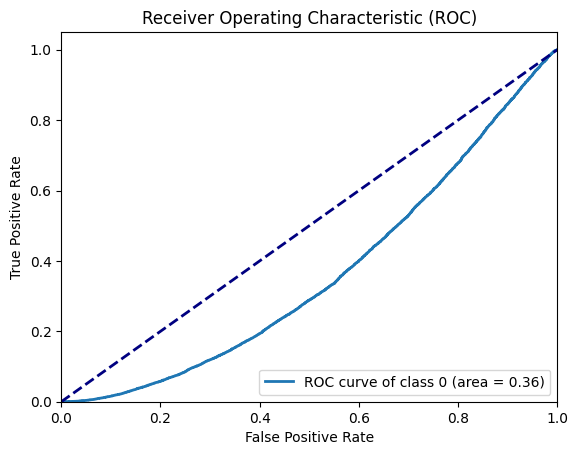

In [ ]:
# prompt: roc curve of logistic regression

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the output
y_test_bin = label_binarize(y_test, classes=model.classes_)
n_classes = y_test_bin.shape[1]

# Get predicted probabilities for all classes
y_pred_proba = model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve of class {0} (area = {1:0.2f})'
                                   ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

#B) KNN (K-NEAREST NEIGHBORS)



In [ ]:
# prompt: Load the dataset

import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# #1. Data Load
# Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.

!pip install gdown


# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

# #2. DATA CLEANING
# *Step 1: load/Read The Dataset*


def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)

if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head())
  print("Test DataFrame:", df_test.head())


Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 42.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 66.3MB/s]


Train DataFrame:    building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0       903419              22            1136            5551   
1       911693              25             419           11222   
2       888461              23             892            6156   
3       503788              10            1397            1591   
4       634804              27             422           10353   

   count_floors_pre_eq  age  area_percentage  height_percentage  \
0                    1   20                4                  2   
1                    2   15               12                  5   
2                    3   30                8                  7   
3                    2   15                7                  6   
4                    2   30                7                  5   

  land_surface_condition foundation_type  ... has_secondary_use_hotel  \
0                      t               r  ...                       0   
1                      n             

#TRAIN AND TEST THE MODEL>>

In [ ]:
df_train = df_train.rename(columns={'has_superstructure_mud_mortar_stone': 'target'})

In [ ]:
print(df_train['target'].unique())

[1 0]


In [ ]:
# prompt: break into training and test sets with 30% test data

from sklearn.model_selection import train_test_split

X = df_train.drop('target', axis=1)
y = df_train['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
130055,251157,20,251,1863,2,5,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
12526,639857,6,744,4616,2,25,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
119864,923395,16,177,4571,2,20,6,5,n,r,...,0,0,0,0,0,0,0,0,0,2
36336,26752,20,832,3971,2,10,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
52785,839073,8,426,173,3,30,3,7,t,r,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,274230,14,683,518,2,5,11,6,t,r,...,0,0,0,0,0,0,0,0,0,2
103694,380680,3,1006,11911,2,60,46,5,t,r,...,0,0,0,0,0,0,0,0,0,2
131932,770252,10,337,11271,3,15,5,6,t,r,...,0,0,0,0,0,0,0,0,0,3
146867,439184,17,247,3997,4,5,8,10,n,u,...,1,0,0,0,0,0,0,0,0,2


In [ ]:
y_train

,target
130055,1
12526,1
119864,1
36336,1
52785,1
...,...
119879,1
103694,0
131932,1
146867,0


In [ ]:
# prompt: encode X_train, y_train and X_test, y_test data

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

# Assuming X_train and X_test have categorical features that need encoding
# You can choose the appropriate encoding method based on your data
# Here, we use OneHotEncoder for demonstration purposes

from sklearn.preprocessing import OneHotEncoder

# Identify categorical columns in X_train
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Create a OneHotEncoder instance
enc = OneHotEncoder(handle_unknown='ignore')

# Fit the encoder on X_train and transform both X_train and X_test
X_train_encoded = enc.fit_transform(X_train[categorical_cols]).toarray()
X_test_encoded = enc.transform(X_test[categorical_cols]).toarray()

# Combine encoded features with numerical features
# Assuming X_train has numerical features
X_train_numerical = X_train.select_dtypes(include=['number'])
X_test_numerical = X_test.select_dtypes(include=['number'])

X_train = np.concatenate((X_train_encoded, X_train_numerical), axis=1)
X_test = np.concatenate((X_test_encoded, X_test_numerical), axis=1)


In [ ]:
X_train

array([[0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 2.],
       [1., 0., 0., ..., 0., 0., 2.],
       ...,
       [0., 0., 1., ..., 0., 0., 3.],
       [1., 0., 0., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 2.]])

In [ ]:
y_train

array([1, 1, 1, ..., 1, 0, 1])

In [ ]:
# prompt: train using KNN

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=3)  # You can adjust the number of neighbors
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
X_test

array([[0., 0., 1., ..., 0., 0., 2.],
       [1., 0., 0., ..., 0., 0., 3.],
       [0., 0., 1., ..., 0., 0., 3.],
       ...,
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 2.],
       [0., 0., 1., ..., 0., 0., 3.]])

In [ ]:
y_pred = knn.predict(X_test)


In [ ]:
y_test

array([1, 1, 1, ..., 1, 1, 1])

*ACCURACY OF KNN*

In [ ]:
# prompt: calculate accuracy

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.6909269207811034


*CLASSIFICATION REPORT OF KNN*

In [ ]:
# prompt: show classification report and matrix

from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.25      0.15      0.19     11137
           1       0.76      0.86      0.81     35771

    accuracy                           0.69     46908
   macro avg       0.51      0.50      0.50     46908
weighted avg       0.64      0.69      0.66     46908

[[ 1677  9460]
 [ 5038 30733]]


*ROC CURVE OF KNN*

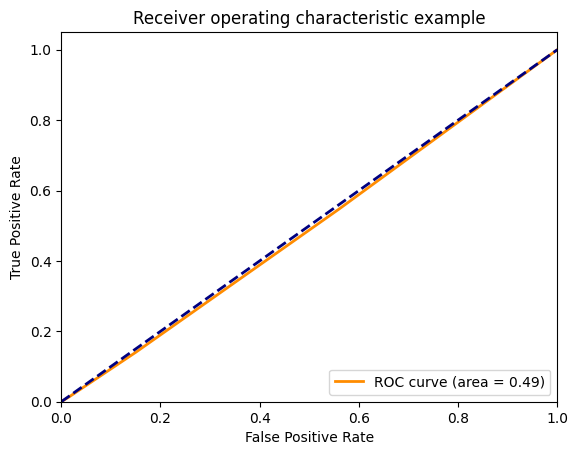

In [ ]:
# prompt: plot roc

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt

# Binarize the output
y_test_bin = label_binarize(y_test, classes=[0, 1]) # Assuming two classes
y_pred_proba = knn.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = y_test_bin.shape[1]

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr[0], tpr[0], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()


#C) DESICION TREE

In [ ]:
# prompt: Load the dataset

import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# #1. Data Load
# Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.

!pip install gdown


# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

# #2. DATA CLEANING
# *Step 1: load/Read The Dataset*


def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)

if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head())
  print("Test DataFrame:", df_test.head())


Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 183MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 227MB/s]


Train DataFrame:    building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0       903419              22            1136            5551   
1       911693              25             419           11222   
2       888461              23             892            6156   
3       503788              10            1397            1591   
4       634804              27             422           10353   

   count_floors_pre_eq  age  area_percentage  height_percentage  \
0                    1   20                4                  2   
1                    2   15               12                  5   
2                    3   30                8                  7   
3                    2   15                7                  6   
4                    2   30                7                  5   

  land_surface_condition foundation_type  ... has_secondary_use_hotel  \
0                      t               r  ...                       0   
1                      n             

#TRAIN AND TEST THE MODEL>>

In [ ]:
df_train = df_train.rename(columns={'has_superstructure_mud_mortar_stone': 'target'})

In [ ]:
print(df_train['target'].unique())

[1 0]


In [ ]:
from sklearn.model_selection import train_test_split

X = df_train.drop('target', axis=1)
y = df_train['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
130055,251157,20,251,1863,2,5,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
12526,639857,6,744,4616,2,25,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
119864,923395,16,177,4571,2,20,6,5,n,r,...,0,0,0,0,0,0,0,0,0,2
36336,26752,20,832,3971,2,10,8,5,t,r,...,0,0,0,0,0,0,0,0,0,2
52785,839073,8,426,173,3,30,3,7,t,r,...,0,0,0,0,0,0,0,0,0,3


In [ ]:
y_train.head()

,target
130055,1
12526,1
119864,1
36336,1
52785,1


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Define the preprocessor (ColumnTransformer)
categorical_cols = X_train.select_dtypes(include=['object']).columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', X_train.select_dtypes(exclude=['object']).columns.tolist()),
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_cols.tolist()),
    ])

# Fit and transform the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [ ]:
X_test

array([[6.33837e+05, 1.00000e+01, 4.17000e+02, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00],
       [4.48892e+05, 2.70000e+01, 1.81000e+02, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00],
       [1.99534e+05, 7.00000e+00, 5.45000e+02, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00],
       ...,
       [2.21153e+05, 8.00000e+00, 6.38000e+02, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00],
       [6.27303e+05, 8.00000e+00, 6.60000e+01, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00],
       [7.84566e+05, 1.00000e+01, 1.20700e+03, ..., 0.00000e+00,
        1.00000e+00, 0.00000e+00]])

In [ ]:
y_test

,target
67044,1
116499,1
152761,1
95340,1
10222,0
...,...
120699,1
98868,1
86073,1
65889,1


In [ ]:
# prompt: import decisiontree

from sklearn.tree import DecisionTreeClassifier



In [ ]:
model = DecisionTreeClassifier(max_depth=3, min_samples_split=2, min_samples_leaf=1)
model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

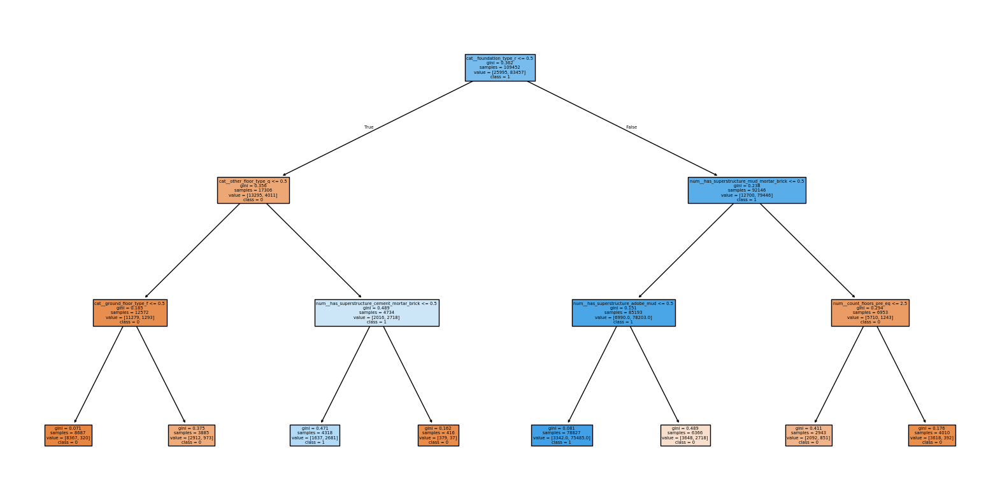

In [ ]:
# prompt: show decision tree of model
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Get feature names after OneHotEncoding
feature_names = preprocessor.get_feature_names_out()

# Plot the decision tree with the correct feature names
plt.figure(figsize=(20, 10))
plot_tree(model, feature_names=feature_names, class_names=['0', '1'], filled=True)
plt.show()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
y_pred

array([1, 0, 1, ..., 1, 1, 1])

In [ ]:
y_test

,target
67044,1
116499,1
152761,1
95340,1
10222,0
...,...
120699,1
98868,1
86073,1
65889,1


*ACCURACY OF DESICION TREE*

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9068389187345443


*CLASSIFICATION REPORT OF DESICION TREE*

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80     11137
           1       0.94      0.94      0.94     35771

    accuracy                           0.91     46908
   macro avg       0.87      0.87      0.87     46908
weighted avg       0.91      0.91      0.91     46908

[[ 9006  2131]
 [ 2239 33532]]


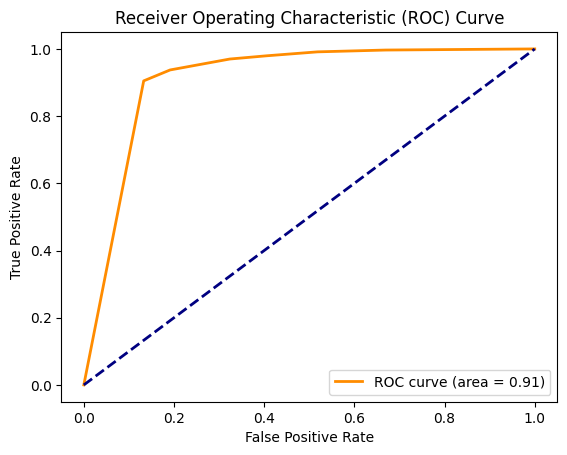

In [ ]:
# prompt: roc curve

from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Compute the AUC
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Decision Tree Accuracy: 0.945339814104204
              precision    recall  f1-score   support

           0       0.89      0.88      0.88     11137
           1       0.96      0.97      0.96     35771

    accuracy                           0.95     46908
   macro avg       0.93      0.92      0.92     46908
weighted avg       0.95      0.95      0.95     46908

[[ 9797  1340]
 [ 1224 34547]]


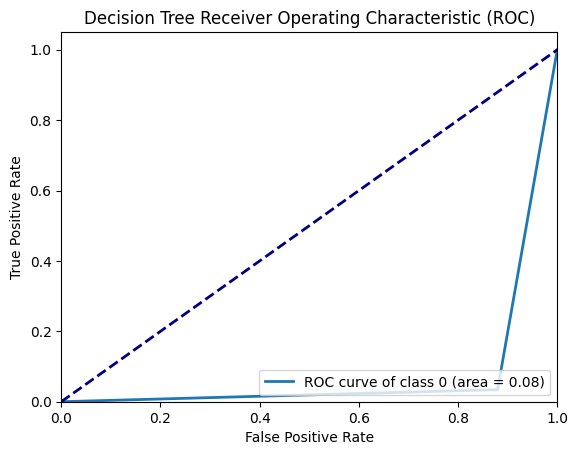

In [ ]:
# prompt: Apply the Desicion Tree train test and ROC CURVE make these

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming X_train, X_test, y_train, y_test are defined from the previous parts

# Train a Decision Tree classifier
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = dt_model.predict(X_test)

# Evaluate the model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt}")

print(classification_report(y_test, y_pred_dt))
print(confusion_matrix(y_test, y_pred_dt))


# Binarize the output for ROC curve
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Get predicted probabilities for all classes
y_pred_proba_dt = dt_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()
for i in range(n_classes):
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba_dt[:, i])
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Plot ROC curves for each class
plt.figure()
for i in range(n_classes):
    plt.plot(fpr_dt[i], tpr_dt[i], lw=2, label='ROC curve of class {0} (area = {1:0.2f})'
                                   ''.format(i, roc_auc_dt[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

#D) NAIVE BAYES

#TRAIN AND TEST THE MODEL>>

Naive Bayes Accuracy: 0.761533213950712
              precision    recall  f1-score   support

           0       0.44      0.01      0.03     11137
           1       0.76      0.99      0.86     35771

    accuracy                           0.76     46908
   macro avg       0.60      0.50      0.45     46908
weighted avg       0.69      0.76      0.67     46908



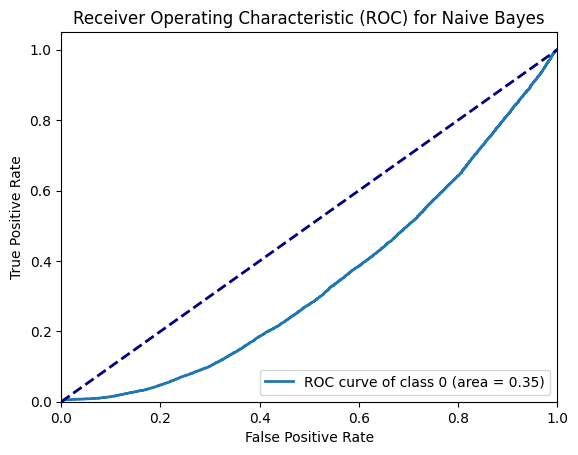

In [ ]:
# prompt: apply the Naive Bayes model train test accuracy and Roc curve make these

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming X_train, X_test, y_train, y_test are already defined

# Create a Naive Bayes classifier
nb = GaussianNB()

# Train the model
nb.fit(X_train, y_train)

# Make predictions
y_pred = nb.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Accuracy: {accuracy}")

# Print classification report
print(classification_report(y_test, y_pred))

# ROC Curve and AUC
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Get predicted probabilities for all classes
y_pred_proba = nb.predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
  roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure()
for i in range(n_classes):
  plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve of class {0} (area = {1:0.2f})'
                                ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for Naive Bayes')
plt.legend(loc="lower right")
plt.show()

#5. PCA (PRINCIPLE COMPONENT ANALYSIS)>>

In [ ]:
# prompt: Load the dataset

import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# #1. Data Load
# Load the data files (Earthquake_train.csv and Earthquake_test.csv) to check their structure and confirm data availability.

!pip install gdown


# Define the file IDs from Google Drive
file_ids = ['1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL', '1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x']
# Download the files
for file_id in file_ids:
  url = f'https://drive.google.com/uc?id={file_id}'
  output_path = f'/content/{file_id}.csv'  # Customize the output paths as needed
  gdown.download(url, output_path, quiet=False)

# #2. DATA CLEANING
# *Step 1: load/Read The Dataset*


def read_two_dataframes(file_paths):
  """
  Reads two CSV files into pandas DataFrames and returns them.

  Args:
    file_paths: A list of two file paths to CSV files.

  Returns:
    A tuple containing two pandas DataFrames, or None if there's an error.
  """
  try:
    df1 = pd.read_csv(file_paths[0])
    df2 = pd.read_csv(file_paths[1])
    return df1, df2
  except FileNotFoundError:
    print("Error: One or both files not found.")
    return None
  except Exception as e:
    print(f"Error reading files: {e}")
    return None


# Assuming the file paths are stored in a list called 'file_paths':
file_paths = ['/content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv',
              '/content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv']

df_train, df_test = read_two_dataframes(file_paths)

if df_train is not None and df_test is not None:
  # Now you can work with your dataframes 'df_train' and 'df_test'.
  print("Train DataFrame:", df_train.head())
  print("Test DataFrame:", df_test.head())


Downloading...
From: https://drive.google.com/uc?id=1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL
To: /content/1CtfUG2rVOhgfs0rVV31KXq_fYjzJoqqL.csv
100%|██████████| 14.4M/14.4M [00:00<00:00, 90.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x
To: /content/1XpBHLXDHTe4sFNH-jJU4jc2nKco9Ji6x.csv
100%|██████████| 9.38M/9.38M [00:00<00:00, 61.1MB/s]


Train DataFrame:    building_id  geo_level_1_id  geo_level_2_id  geo_level_3_id  \
0       903419              22            1136            5551   
1       911693              25             419           11222   
2       888461              23             892            6156   
3       503788              10            1397            1591   
4       634804              27             422           10353   

   count_floors_pre_eq  age  area_percentage  height_percentage  \
0                    1   20                4                  2   
1                    2   15               12                  5   
2                    3   30                8                  7   
3                    2   15                7                  6   
4                    2   30                7                  5   

  land_surface_condition foundation_type  ... has_secondary_use_hotel  \
0                      t               r  ...                       0   
1                      n             

In [ ]:
df_train.sample(5)

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
44309,156586,26,1110,4418,1,15,3,3,t,w,...,0,0,0,0,0,0,0,0,0,2
129606,948347,7,904,6928,2,25,2,6,t,r,...,0,0,0,0,0,0,0,0,0,2
22196,697231,7,4,2318,2,0,3,4,n,r,...,0,0,0,0,0,0,0,0,1,2
140641,277159,26,919,10593,2,50,9,5,t,r,...,0,0,0,0,0,0,0,0,0,2
102279,41862,26,432,6794,1,15,8,5,n,w,...,0,0,0,0,0,0,0,0,0,2


In [ ]:
df_test.sample(5)

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
36808,763539,10,1174,7207,1,5,3,3,t,w,...,0,0,0,0,0,0,0,0,0,0
73950,88850,8,178,8196,2,0,5,4,t,r,...,0,0,0,0,0,0,0,0,0,0
57596,840474,12,339,4529,2,995,7,4,t,r,...,0,0,0,0,0,0,0,0,0,0
71970,1015777,8,1009,6323,2,15,12,6,n,r,...,0,0,0,0,0,0,0,0,0,0
101061,811236,7,859,6960,1,10,9,2,n,r,...,1,0,0,0,0,0,0,0,0,0


#TRAIN AND TEST THE MODEL>>

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming 'df_train' is your training dataframe
X = df_train.iloc[:, :-1]  # Features
y = df_train.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Adjust 'test_size' and 'random_state' as needed

# Now you can access X_train.shape
X_train.shape

(125088, 39)

In [ ]:
y_train.shape

(125088,)

In [ ]:
X_test.shape

(31272, 39)

In [ ]:
y_test.shape

(31272,)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train is your DataFrame with string columns

# Create a LabelEncoder for each categorical column
label_encoders = {}
for col in X_train.select_dtypes(include=['object']).columns:
    label_encoders[col] = LabelEncoder()
    X_train[col] = label_encoders[col].fit_transform(X_train[col])

# Now you can fit the KNN model
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
X_test

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
67044,633837,10,417,634,1,30,6,3,t,r,...,0,0,0,0,0,0,0,0,0,0
116499,448892,27,181,5304,3,25,10,7,n,r,...,0,0,0,0,0,0,0,0,0,0
152761,199534,7,545,3508,2,10,4,6,t,r,...,0,0,0,0,0,0,0,0,0,0
95340,961798,8,626,9112,3,5,5,7,n,r,...,0,0,0,0,0,0,0,0,0,0
10222,265317,26,39,1851,2,15,23,6,t,u,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142064,377600,4,910,7735,2,100,4,5,n,r,...,0,0,0,0,0,0,0,0,0,0
33225,50978,13,239,8730,2,5,3,5,t,r,...,0,0,0,0,0,0,0,0,0,0
130456,428605,20,254,12368,2,10,3,3,o,r,...,0,0,0,0,0,0,0,0,0,0
96753,397606,20,922,1378,2,25,7,5,t,r,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
import time

# Assuming X_train, y_train, and X_test are defined

# Create a LabelEncoder for each categorical column in X_train
label_encoders = {}
for col in X_train.select_dtypes(include=['object']).columns:
    label_encoders[col] = LabelEncoder()
    X_train[col] = label_encoders[col].fit_transform(X_train[col])

# Now you can fit the KNN model
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)


# *** Apply the same transformations to X_test using the fitted LabelEncoders ***
for col in X_test.select_dtypes(include=['object']).columns:
    # Check if the column was encoded during training
    if col in label_encoders:
        # Use the same LabelEncoder to transform X_test
        X_test[col] = label_encoders[col].transform(X_test[col])
    else:
        # Handle new categories in X_test if necessary (e.g., impute with a placeholder)
        # This part depends on your specific data and how you want to handle unseen values
        print(f"Warning: Column '{col}' not seen during training. Consider handling this.")
        X_test[col] = X_test[col].map(lambda s: '<unknown>' if isinstance(s, str) else s)
        label_encoders[col] = LabelEncoder()
        X_test[col] = label_encoders[col].fit_transform(X_test[col])


start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

109.5028305053711


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.4957150166282937

In [ ]:
# prompt: prepocessing of PCA model in logistic regression

from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Assuming X_train and X_test are your feature matrices after preprocessing

# Create a PCA object with the desired number of components
pca = PCA(n_components=0.95)  # Keep components explaining 95% of the variance

# Fit PCA on the training data and transform both training and testing data
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Now, use X_train_pca and X_test_pca as input to your Logistic Regression model
model = LogisticRegression()
model.fit(X_train_pca, y_train)

y_pred = model.predict(X_test_pca)

# Evaluate the model's performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy with PCA: {accuracy}")

print(classification_report(y_test, y_pred))

Accuracy with PCA: 0.5670887695062676
              precision    recall  f1-score   support

           1       0.00      0.00      0.00      3025
           2       0.57      1.00      0.72     17734
           3       0.00      0.00      0.00     10513

    accuracy                           0.57     31272
   macro avg       0.19      0.33      0.24     31272
weighted avg       0.32      0.57      0.41     31272



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In Logistic Regreesion Model Accuracy of PCA is 56%

Logistic Regression with PCA Accuracy: 0.5685277564594525


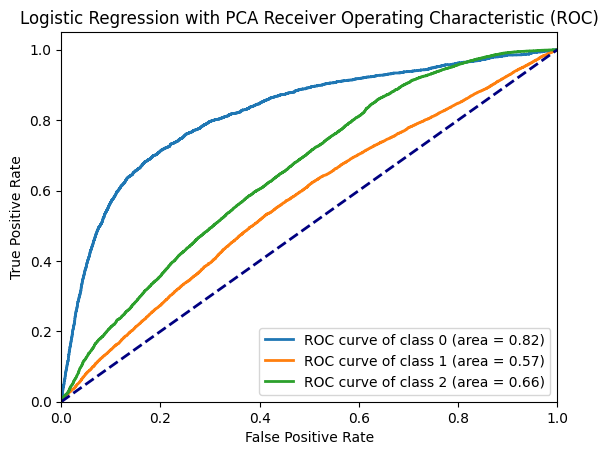

In [ ]:
# prompt: ROC curve of logistic regression in PCA

from sklearn.decomposition import PCA

# Assuming X_train, X_test, y_train, y_test are defined from the previous parts

# Train a Logistic Regression model with PCA
pca = PCA(n_components=0.95)  # Keep components explaining 95% of the variance
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

model_pca = LogisticRegression()
model_pca.fit(X_train_pca, y_train)

y_pred_pca = model_pca.predict(X_test_pca)

# Evaluate the model
accuracy_pca = accuracy_score(y_test, y_pred_pca)
print(f"Logistic Regression with PCA Accuracy: {accuracy_pca}")

# Binarize the output for ROC curve
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Get predicted probabilities for all classes
y_pred_proba_pca = model_pca.predict_proba(X_test_pca)

# Compute ROC curve and ROC area for each class
fpr_pca = dict()
tpr_pca = dict()
roc_auc_pca = dict()
for i in range(n_classes):
    fpr_pca[i], tpr_pca[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba_pca[:, i])
    roc_auc_pca[i] = auc(fpr_pca[i], tpr_pca[i])

# Plot ROC curves for each class
plt.figure()
for i in range(n_classes):
    plt.plot(fpr_pca[i], tpr_pca[i], lw=2, label='ROC curve of class {0} (area = {1:0.2f})'
                                   ''.format(i, roc_auc_pca[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression with PCA Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components = 15)

In [ ]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
X_train_trf.shape

(125088, 15)

In [ ]:
X_train_trf

array([[ 4.94460998e-01,  5.11480278e-01, -1.43120050e-01, ...,
         5.19179355e-02, -1.32993896e-01,  1.07492428e-03],
       [-6.66918371e-01, -2.82575411e+00, -5.16043096e-01, ...,
        -1.68409401e+00, -2.79671574e-01,  1.05886764e-03],
       [ 2.01454456e+00, -1.00207024e+00,  7.82091785e-01, ...,
         1.01369730e-01,  1.07362872e-01, -5.49309118e-03],
       ...,
       [ 1.44655011e-01,  9.72152473e-01,  1.62610384e-01, ...,
        -1.50663689e-02,  5.27194732e-01, -1.42356089e-03],
       [-4.76927452e+00, -2.26776395e-01,  3.81151096e-01, ...,
        -1.62891154e-01,  4.99171132e-01, -7.48561326e-03],
       [ 1.08285919e+00,  9.31441769e-01,  6.14937008e-01, ...,
        -4.72108854e-03, -2.99121523e-03, -6.26579454e-03]])

In [ ]:
knn = KNeighborsClassifier()
knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(X_test_trf)
print(time.time() - start)

3824.66060256958


In KNN Model PCA accuracy is 43%

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.4354374520337682

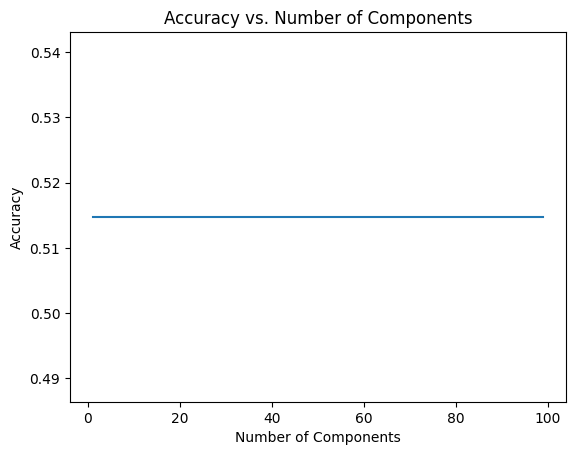

In [ ]:
# Store accuracy scores for each component
accuracy_scores = []

# Assume 'n_components' is a variable holding the desired range of components (e.g., 1 to 99)
for n in range(1, 100): # Replace with your desired range
    # ... (your existing code for fitting the model with 'n' components) ...

    # Calculate accuracy for the current number of components
    y_pred = knn.predict(X_test_trf)  # Make sure X_test_trf is based on 'n' components
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_scores.append(accuracy)

# Now plot the accuracy scores
plt.plot(range(1, 100), accuracy_scores)  # Using the collected accuracy scores
plt.xlabel('Number of Components')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Components')
plt.show()

In [ ]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [ ]:
pca.explained_variance_

array([3.06792022, 2.30523862, 1.96840751, 1.8138864 , 1.45515921,
       1.19154112, 1.12085943, 1.07224848, 1.04308664, 1.0224204 ,
       1.01503398, 1.01029239, 1.00577962, 1.00316631, 1.00208658,
       0.99940317, 0.99540581, 0.9906602 , 0.98712298, 0.98364452,
       0.95832719, 0.95032381, 0.94213686, 0.92764973, 0.91326829,
       0.89401604, 0.87947018, 0.85129418, 0.8243825 , 0.71910867,
       0.69449239, 0.68309254, 0.63350145, 0.57010593])

In [ ]:
# Reduce the number of components to be less than or equal to the number of features
pca = PCA(n_components=39)  # or any number less than or equal to 39
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
pca.explained_variance_

array([3.06792022, 2.30523862, 1.96840751, 1.8138864 , 1.45515921,
       1.19154112, 1.12085943, 1.07224848, 1.04308664, 1.0224204 ,
       1.01503398, 1.01029239, 1.00577962, 1.00316631, 1.00208658,
       0.99940317, 0.99540581, 0.9906602 , 0.98712298, 0.98364452,
       0.95832719, 0.95032381, 0.94213686, 0.92764973, 0.91326829,
       0.89401604, 0.87947018, 0.85129418, 0.8243825 , 0.71910867,
       0.69449239, 0.68309254, 0.63350145, 0.57010593, 0.53822651,
       0.47759216, 0.28040627, 0.20352478, 0.00602871])

In [ ]:
pca.explained_variance_ratio_

array([0.07866399, 0.05910821, 0.05047158, 0.04650954, 0.03731148,
       0.03055209, 0.02873976, 0.02749333, 0.0267456 , 0.0262157 ,
       0.0260263 , 0.02590473, 0.02578901, 0.02572201, 0.02569432,
       0.02562552, 0.02552302, 0.02540134, 0.02531064, 0.02522145,
       0.0245723 , 0.02436708, 0.02415716, 0.0237857 , 0.02341695,
       0.02292331, 0.02255034, 0.02182788, 0.02113784, 0.01843854,
       0.01780735, 0.01751505, 0.0162435 , 0.01461798, 0.01380057,
       0.01224585, 0.00718985, 0.00521854, 0.00015458])

In [ ]:
pca.components_

array([[ 2.51562098e-03, -3.90209148e-02,  5.89515571e-02, ...,
        -2.40317043e-02, -1.24015591e-02, -3.15997307e-02],
       [-2.41884560e-03, -2.18811955e-01,  1.23522116e-01, ...,
        -1.81954331e-03, -8.98999240e-04, -5.07439311e-03],
       [ 3.20614962e-03, -1.56988823e-01,  4.63064569e-02, ...,
         1.70629880e-02,  1.56147039e-02,  1.57233604e-01],
       ...,
       [-1.07722815e-04,  1.60225656e-02,  3.57178233e-03, ...,
         4.35453378e-03,  2.58809782e-03, -1.98826630e-03],
       [ 1.43208946e-04, -7.30166449e-04,  2.19217435e-03, ...,
         9.01935321e-04, -1.17296542e-03,  3.42212313e-03],
       [-1.84054563e-04,  1.36538753e-03, -5.48558835e-04, ...,
        -2.50561099e-02, -2.26953106e-02, -9.70778069e-02]])

In [ ]:
import numpy as np
np.cumsum(pca.explained_variance_ratio_)

array([0.07866399, 0.1377722 , 0.18824379, 0.23475332, 0.2720648 ,
       0.30261689, 0.33135665, 0.35884998, 0.38559557, 0.41181127,
       0.43783758, 0.4637423 , 0.48953132, 0.51525333, 0.54094765,
       0.56657317, 0.59209619, 0.61749753, 0.64280817, 0.66802962,
       0.69260192, 0.716969  , 0.74112616, 0.76491186, 0.78832881,
       0.81125212, 0.83380245, 0.85563034, 0.87676818, 0.89520672,
       0.91301407, 0.93052912, 0.94677262, 0.96139061, 0.97519117,
       0.98743703, 0.99462688, 0.99984542, 1.        ])

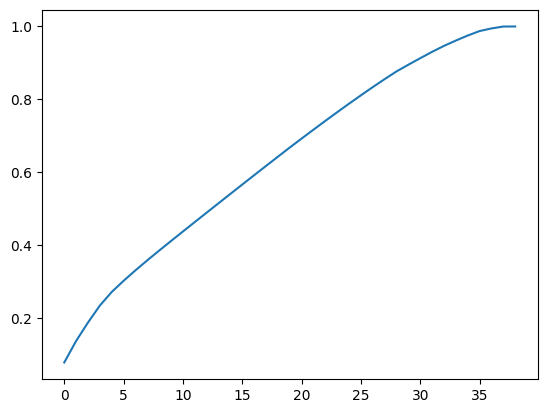

In [ ]:
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_))

#5. CLASSIFICATION RREPORT>>

In [ ]:
# prompt: Classification report

from sklearn.metrics import classification_report

# Assuming y_test and y_pred are defined

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.32      0.23      0.27      3025
           2       0.58      0.70      0.64     17734
           3       0.39      0.28      0.32     10513

    accuracy                           0.51     31272
   macro avg       0.43      0.40      0.41     31272
weighted avg       0.49      0.51      0.49     31272



#Q. WHICH MODEL IS BEST IN THIS DATASET AND WHY?

# ANS: Best Model for This Dataset: Decision Tree (or Ensemble Variants)

# *Reasons Why Decision Trees (and Ensembles) Are Best*

Data Structure Compatibility:

The dataset contains a mix of numerical, categorical, and binary indicator features.
Decision Trees handle both types natively, requiring minimal preprocessing (e.g., no need for one-hot encoding or scaling).
Complexity of Relationships:

Earthquake damage grades likely involve non-linear relationships between features (e.g., building materials, age, and area).
Decision Trees and ensemble methods (e.g., Random Forest, Gradient Boosting) excel at modeling such non-linear patterns.
Interpretability:

Decision Trees provide insights into which features are most critical for predicting damage grade through feature importance metrics.
This interpretability is helpful for understanding earthquake risks.
Performance on Large Datasets:

The dataset is large (~156,000 training rows). Ensemble methods like Random Forest or Gradient Boosting scale well and handle overfitting better than standalone models.
Comparison to Other Models:

Logistic Regression assumes linear relationships, which is overly simplistic for this problem.
KNN is computationally expensive for large datasets and less interpretable.
Naive Bayes assumes feature independence, which is unrealistic given the structural interdependencies in building attributes.
Recommendation:
Start with Decision Trees for their ease of use and interpretability. Then, move to Random Forest or Gradient Boosting (XGBoost/LightGBM) for better generalization and performance on complex datasets.



# KNN Might Be Best:
KNN could perform well if:

The dataset is small and fits in memory.
Features are already scaled and have meaningful numeric distances.
Relationships in the data are highly local and depend on nearest neighbors.
